# Preprocessing

In [225]:
import pandas as pd
import numpy as np

In [226]:
data = pd.read_excel(r'/content/BA_AirlineReviews_CL_excel.xlsx',header=0)

data.head()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,TypeOfTraveller,SeatType,Route,DateFlown,SeatComfort,CabinStaffService,GroundService,ValueForMoney,Recommended,Aircraft,Food&Beverages,InflightEntertainment,Wifi&Connectivity
0,0,Very Dissatisfied,"""Service level far worse then Ryanair""",L Keele,19th November 2023,True,4 Hours before takeoff we received a Mail stat...,Couple Leisure,Economy Class,London to Stuttgart,2023-11-01,1.0,1.0,1.0,1.0,no,NaN,NaN,NaN,NaN
1,1,Neutral,"""do not upgrade members based on status""",Austin Jones,19th November 2023,True,I recently had a delay on British Airways from...,Business,Economy Class,Brussels to London,2023-11-01,2.0,3.0,1.0,2.0,no,A320,1.0,2.0,2.0
2,2,Enthusiastic,"""Flight was smooth and quick""",M A Collie,16th November 2023,False,"Boarded on time, but it took ages to get to th...",Couple Leisure,Business Class,London Heathrow to Dublin,2023-11-01,3.0,3.0,4.0,3.0,yes,A320,4.0,NaN,NaN
3,3,Very Dissatisfied,"""Absolutely hopeless airline""",Nigel Dean,16th November 2023,True,"5 days before the flight, we were advised by B...",Couple Leisure,Economy Class,London to Dublin,2022-12-01,3.0,3.0,1.0,1.0,no,NaN,NaN,NaN,NaN
4,4,Very Dissatisfied,"""Customer Service is non existent""",Gaylynne Simpson,14th November 2023,False,"We traveled to Lisbon for our dream vacation, ...",Couple Leisure,Economy Class,London to Lisbon,2023-11-01,1.0,1.0,1.0,1.0,no,NaN,1.0,1.0,1.0


In [227]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3701 entries, 0 to 3700
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     3701 non-null   int64         
 1   Satisfaction           3701 non-null   object        
 2   ReviewHeader           3701 non-null   object        
 3   Name                   3701 non-null   object        
 4   Datetime               3701 non-null   object        
 5   VerifiedReview         3701 non-null   bool          
 6   ReviewBody             3701 non-null   object        
 7   TypeOfTraveller        2930 non-null   object        
 8   SeatType               3699 non-null   object        
 9   Route                  2926 non-null   object        
 10  DateFlown              2923 non-null   datetime64[ns]
 11  SeatComfort            3585 non-null   float64       
 12  CabinStaffService      3574 non-null   float64       
 13  Gro

In [228]:
from sklearn.impute import KNNImputer

numeric_missing_col = data.columns[(data.isnull().any()) & (data.dtypes != 'object')].to_list()

impNumeric = KNNImputer(n_neighbors=5)
for col in numeric_missing_col:
    numeric = data[[col]].values
    impNumeric = impNumeric.fit(numeric)
    numeric = impNumeric.transform(numeric)
    numeric = numeric.round()
    data[col] = numeric

data.isnull().sum()

id                          0
Satisfaction                0
ReviewHeader                0
Name                        0
Datetime                    0
VerifiedReview              0
ReviewBody                  0
TypeOfTraveller           771
SeatType                    2
Route                     775
DateFlown                   0
SeatComfort                 0
CabinStaffService           0
GroundService               0
ValueForMoney               0
Recommended                 0
Aircraft                 1779
Food&Beverages              0
InflightEntertainment       0
Wifi&Connectivity           0
dtype: int64

In [229]:
nominal_missing_col = data.columns[(data.isnull().any()) & (data.dtypes == 'object')].to_list()
for col in nominal_missing_col:
    data[col].fillna("Unknown", inplace=True)

data.isnull().sum()

id                       0
Satisfaction             0
ReviewHeader             0
Name                     0
Datetime                 0
VerifiedReview           0
ReviewBody               0
TypeOfTraveller          0
SeatType                 0
Route                    0
DateFlown                0
SeatComfort              0
CabinStaffService        0
GroundService            0
ValueForMoney            0
Recommended              0
Aircraft                 0
Food&Beverages           0
InflightEntertainment    0
Wifi&Connectivity        0
dtype: int64

In [230]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)
categorical_col = ['TypeOfTraveller', 'SeatType']
for col in categorical_col:
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out([col]))
    data = pd.concat([data, encoded_df], axis=1)
    data = data.drop([col], axis=1)

lbenc = LabelEncoder()
for i in data.columns.values:
    if (data[i].dtypes == "object" or data[i].dtypes == "bool") and i != "Satisfaction":
        data[i] = lbenc.fit_transform(data[i].astype(str))

satisfaction_order = [
    "Very Dissatisfied",
    "Dissatisfied",
    "Neutral",
    "Satisfied",
    "Very Satisfied",
    "Enthusiastic",
    "Extremely Satisfied",
    "Delighted",
    "Evangelist",
    "Advocate"
]

ordinal_enc = OrdinalEncoder(categories=[satisfaction_order])
data["Satisfaction"] = ordinal_enc.fit_transform(data[["Satisfaction"]])

data.head()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,Route,DateFlown,SeatComfort,...,TypeOfTraveller_Business,TypeOfTraveller_Couple Leisure,TypeOfTraveller_Family Leisure,TypeOfTraveller_Solo Leisure,TypeOfTraveller_Unknown,SeatType_Business Class,SeatType_Economy Class,SeatType_First Class,SeatType_Premium Economy,SeatType_Unknown
0,0,0.0,483,1590,595,1,25,1044,1.698797e+18,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,2.0,1128,254,595,1,1649,143,1.698797e+18,2.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2,5.0,264,1660,406,0,372,824,1.698797e+18,3.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,3,0.0,37,2009,406,1,28,946,1.669853e+18,3.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,4,0.0,222,1013,295,0,3603,976,1.698797e+18,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [231]:
data.describe()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,Route,DateFlown,SeatComfort,...,TypeOfTraveller_Business,TypeOfTraveller_Couple Leisure,TypeOfTraveller_Family Leisure,TypeOfTraveller_Solo Leisure,TypeOfTraveller_Unknown,SeatType_Business Class,SeatType_Economy Class,SeatType_First Class,SeatType_Premium Economy,SeatType_Unknown
count,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3.701000e+03,3701.000000,...,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.00000,3701.000000,3701.000000,3701.000000
mean,1850.000000,3.627668,1665.487166,1396.319643,905.066739,0.311537,1845.307755,924.593083,-7.329317e+17,2.879222,...,0.173196,0.270197,0.107539,0.240746,0.208322,0.323696,0.52067,0.057552,0.097541,0.000540
std,1068.531001,3.094761,869.403991,838.782534,527.062164,0.463184,1065.214398,468.600891,4.381454e+18,1.340735,...,0.378468,0.444122,0.309839,0.427594,0.406163,0.467949,0.49964,0.232926,0.296733,0.023243
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.223372e+18,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,925.000000,1.000000,897.000000,655.000000,457.000000,0.000000,923.000000,563.000000,1.438387e+18,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,1850.000000,3.000000,1804.000000,1354.000000,888.000000,0.000000,1847.000000,962.000000,1.483229e+18,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000
75%,2775.000000,6.000000,2609.000000,2136.000000,1373.000000,1.000000,2767.000000,1454.000000,1.551398e+18,4.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.00000,0.000000,0.000000,0.000000
max,3700.000000,9.000000,2684.000000,2901.000000,1819.000000,1.000000,3691.000000,1542.000000,1.698797e+18,5.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000


In [232]:
data.drop(['id', 'Name', 'ReviewHeader', 'ReviewBody', 'Route', 'Aircraft', 'DateFlown', 'Datetime'], inplace=True, axis = 1)
data.columns.to_list()

['Satisfaction',
 'VerifiedReview',
 'SeatComfort',
 'CabinStaffService',
 'GroundService',
 'ValueForMoney',
 'Recommended',
 'Food&Beverages',
 'InflightEntertainment',
 'Wifi&Connectivity',
 'TypeOfTraveller_Business',
 'TypeOfTraveller_Couple Leisure',
 'TypeOfTraveller_Family Leisure',
 'TypeOfTraveller_Solo Leisure',
 'TypeOfTraveller_Unknown',
 'SeatType_Business Class',
 'SeatType_Economy Class',
 'SeatType_First Class',
 'SeatType_Premium Economy',
 'SeatType_Unknown']

In [233]:
from sklearn.model_selection import train_test_split

features = data.drop(['Satisfaction'], axis=1)
label = data['Satisfaction']

x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=0.1, random_state=42, stratify=label, shuffle=True)

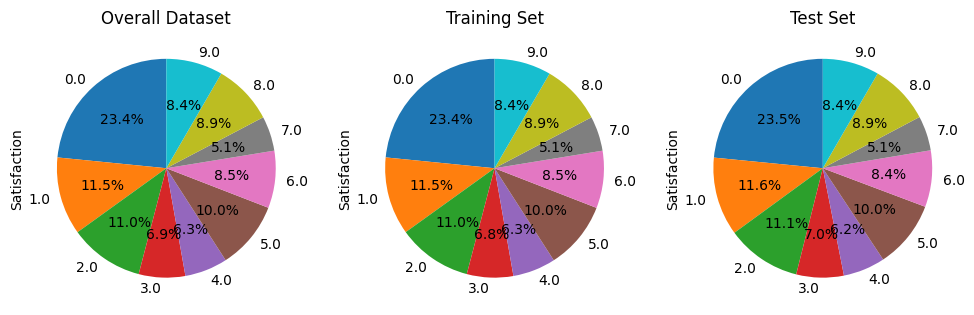

In [234]:
import matplotlib.pyplot as plt
import seaborn as sns

s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

sorted_train = s_train['Satisfaction'].value_counts().sort_index()
sorted_test = s_test['Satisfaction'].value_counts().sort_index()
sorted_data = data['Satisfaction'].value_counts().sort_index()

# Create a pie chart for the overall dataset
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 2)
plt.title('Training Set')
sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

plt.subplot(1, 3, 3)
plt.title('Test Set')
sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

plt.subplot(1, 3, 1)
plt.title('Overall Dataset')
sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

plt.show()

In [235]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,1.000000,-0.053196,-0.042544,-0.055706,-0.094923,-0.072955,0.000019,0.060171,0.065903,0.078334,0.040597,0.076577,0.157712,-0.341139,0.023674,0.016246,-0.039935,-0.032269,-0.016451
1,-0.053196,1.000000,0.594581,0.476571,0.680494,0.641432,0.581483,0.437649,0.235556,-0.130733,-0.050030,-0.013271,0.052451,0.129975,0.020035,-0.105862,0.146022,0.035192,-0.034311
2,-0.042544,0.594581,1.000000,0.462598,0.645761,0.649522,0.663100,0.359542,0.218784,-0.121094,-0.015043,-0.008890,0.026215,0.106949,0.099310,-0.122863,0.110052,-0.036092,-0.004066
3,-0.055706,0.476571,0.462598,1.000000,0.591288,0.553304,0.396400,0.258803,0.218779,-0.131688,0.009200,-0.022326,0.059440,0.065211,0.058713,-0.091635,0.054343,0.020390,-0.015922
4,-0.094923,0.680494,0.645761,0.591288,1.000000,0.799057,0.644759,0.389409,0.211914,-0.179549,-0.053717,-0.038004,0.038518,0.212387,0.037194,-0.059308,0.059412,-0.003146,-0.028076
5,-0.072955,0.641432,0.649522,0.553304,0.799057,1.000000,0.650527,0.394026,0.211953,-0.171770,-0.050867,-0.020437,0.048071,0.178671,0.075868,-0.087849,0.038319,-0.000280,-0.020242
6,0.000019,0.581483,0.663100,0.396400,0.644759,0.650527,1.000000,0.452487,0.242445,-0.139504,-0.026110,-0.022162,0.038569,0.133114,0.105001,-0.132810,0.089439,-0.011279,-0.013350
7,0.060171,0.437649,0.359542,0.258803,0.389409,0.394026,0.452487,1.000000,0.321332,-0.071616,0.036818,0.011061,0.068508,-0.055329,0.015413,-0.049379,0.067047,0.006732,-0.005325
8,0.065903,0.235556,0.218784,0.218779,0.211914,0.211953,0.242445,0.321332,1.000000,-0.036935,-0.004702,0.026599,-0.001429,0.020382,0.049410,-0.054080,-0.009725,0.020665,0.000974
9,0.078334,-0.130733,-0.121094,-0.131688,-0.179549,-0.171770,-0.139504,-0.071616,-0.036935,1.000000,-0.276494,-0.155063,-0.253058,-0.229964,0.119343,-0.097501,0.003640,-0.026426,-0.010987


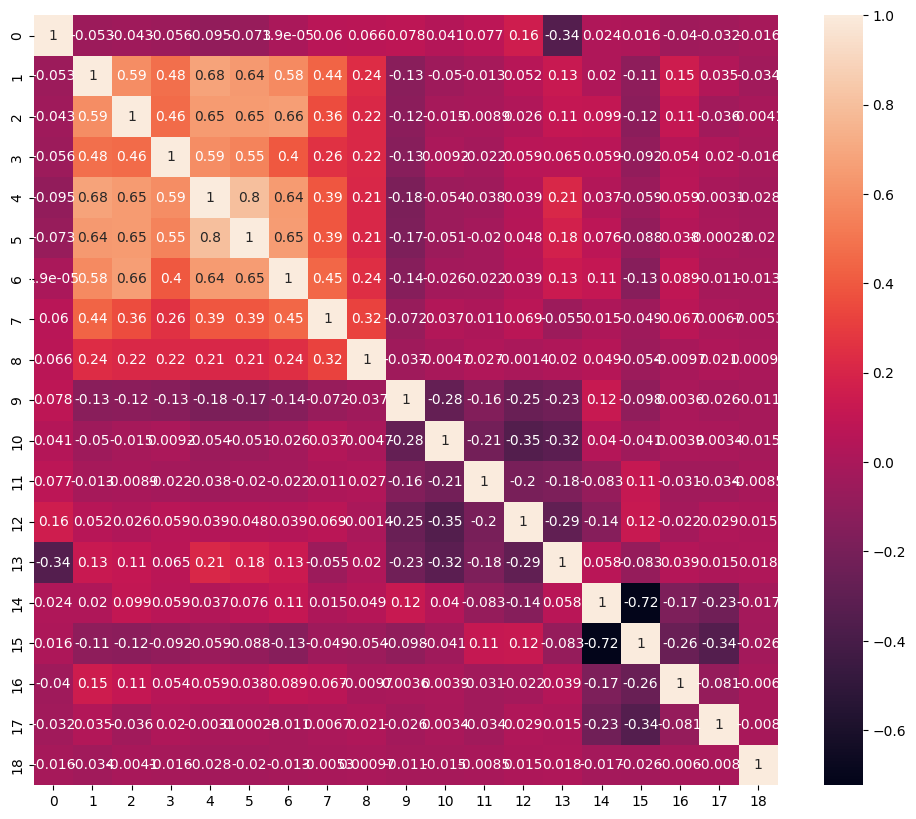

In [236]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

correlation_matrix = pd.DataFrame(x_train).corr()
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True ,ax=ax)
correlation_matrix

In [237]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = pd.DataFrame(dataset, columns=col).corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:  # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [238]:
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
print(to_drop)

x_train = x_train.drop(x_train.columns[to_drop], axis=1)
x_test = x_test.drop(x_test.columns[to_drop], axis=1)

[]


# Developing model

## Default

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


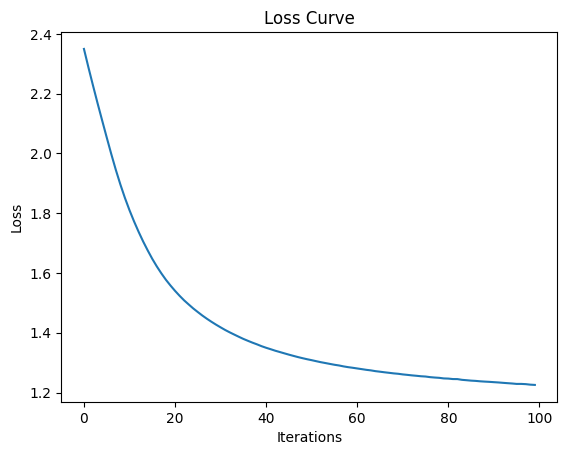

In [239]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [240]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

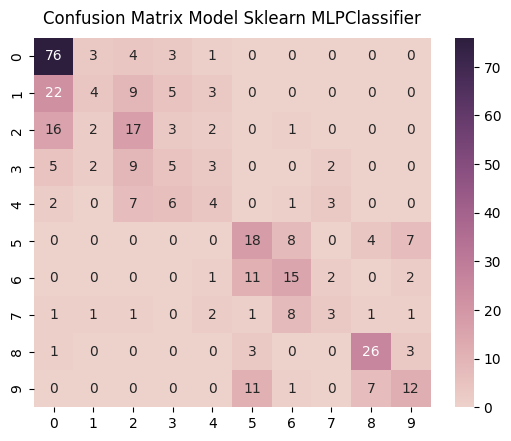

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


In [241]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

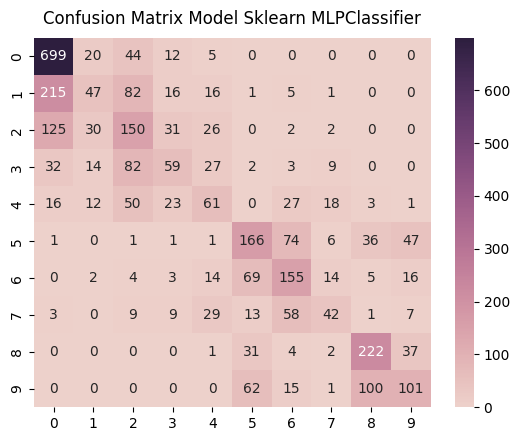

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


In [242]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

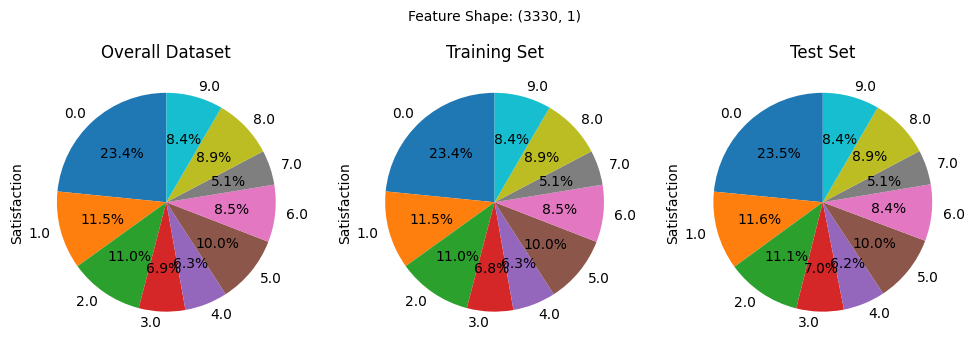

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


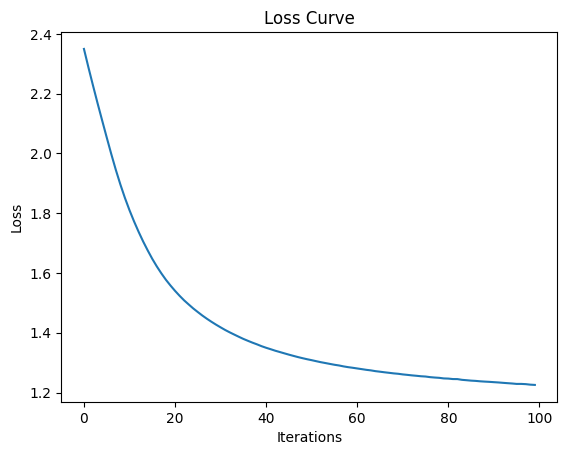

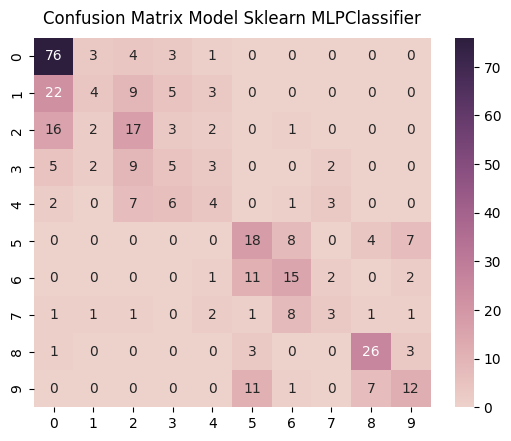

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


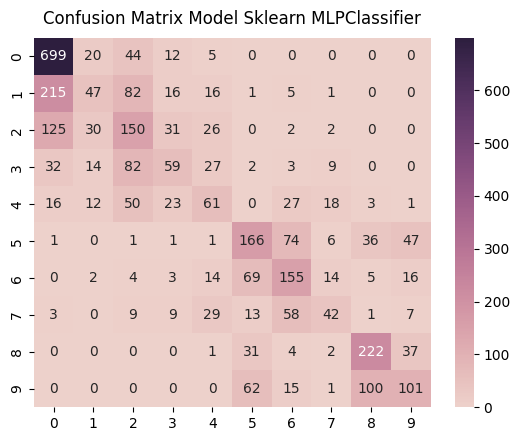

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


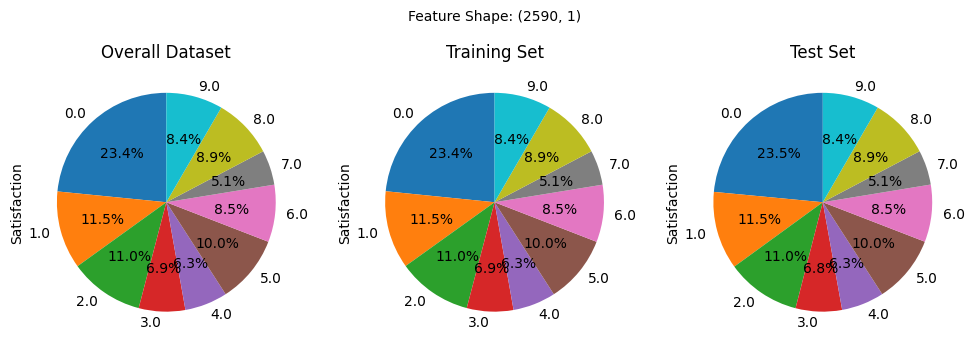

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


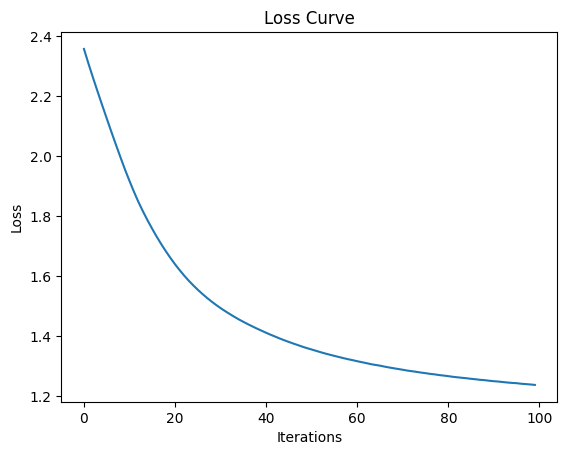

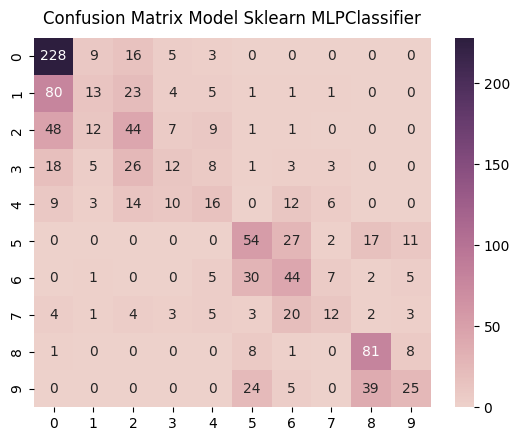

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


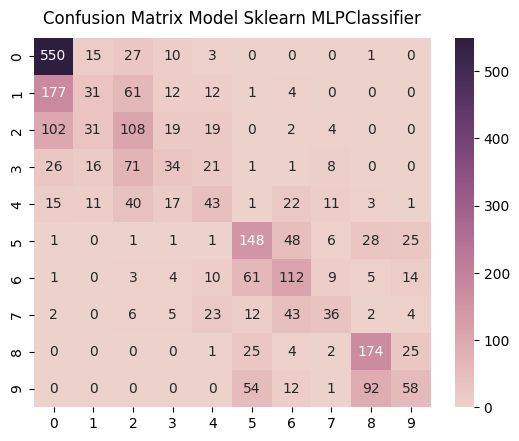

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


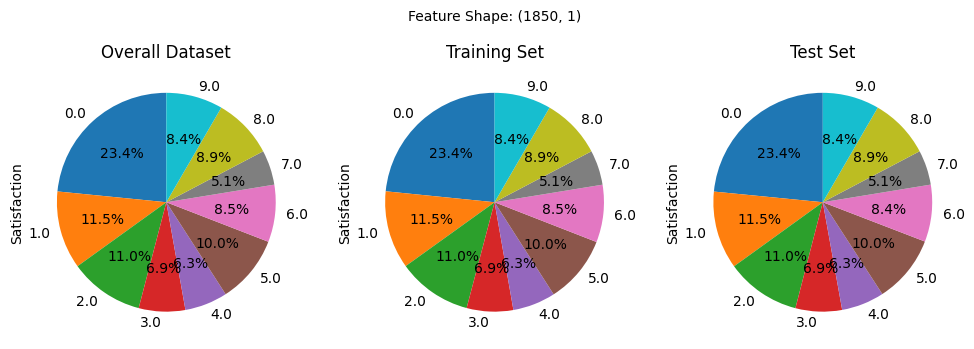

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


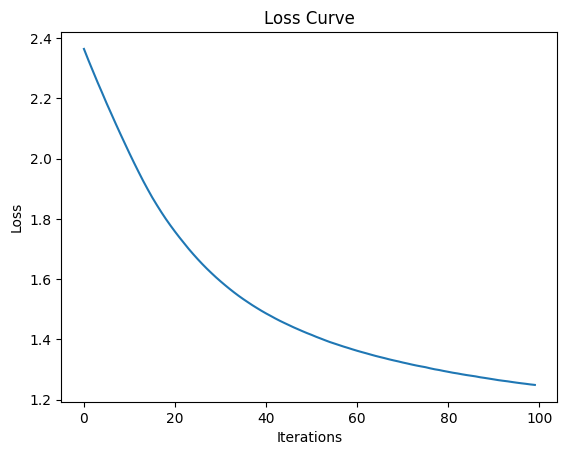

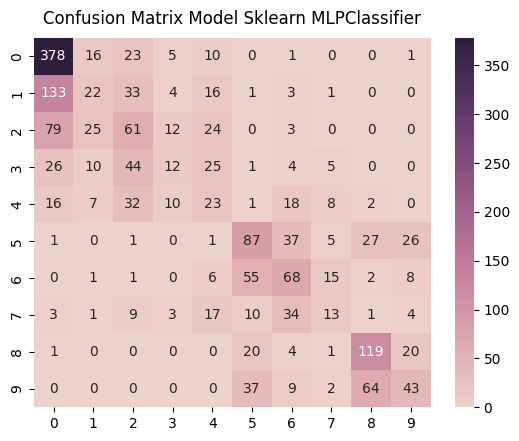

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


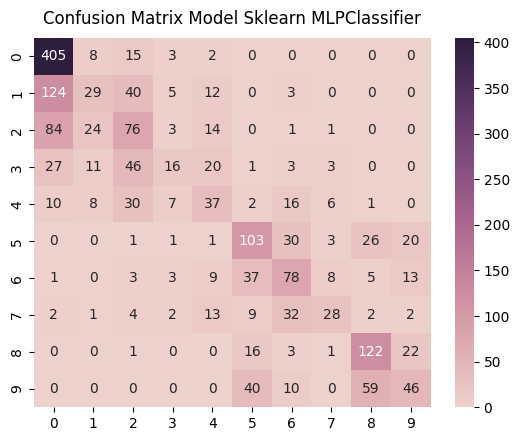

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [243]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## One Hidden Layer

### Experiment 1 | 8 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


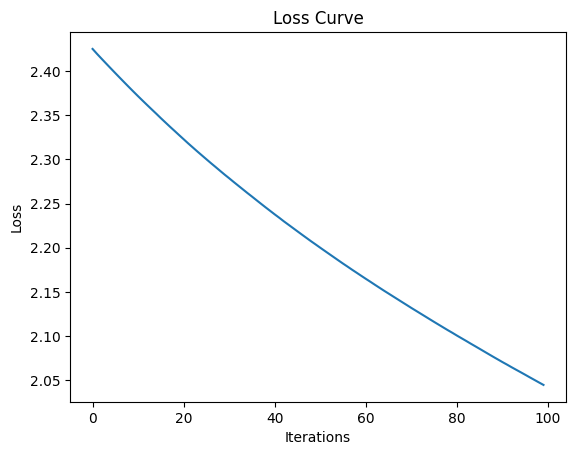

In [244]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [245]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

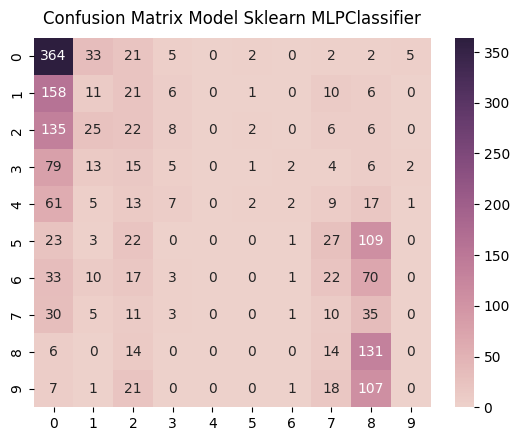

              precision    recall  f1-score      support
0.0            0.406250  0.838710  0.547368   434.000000
1.0            0.103774  0.051643  0.068966   213.000000
2.0            0.124294  0.107843  0.115486   204.000000
3.0            0.135135  0.039370  0.060976   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.125000  0.006410  0.012195   156.000000
7.0            0.081967  0.105263  0.092166    95.000000
8.0            0.267894  0.793939  0.400612   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.293895  0.293895  0.293895     0.293895
macro avg      0.124431  0.194318  0.129777  1851.000000
weighted avg   0.168786  0.293895  0.194657  1851.000000
Mean Squared Error:  7.528903295515938


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [246]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

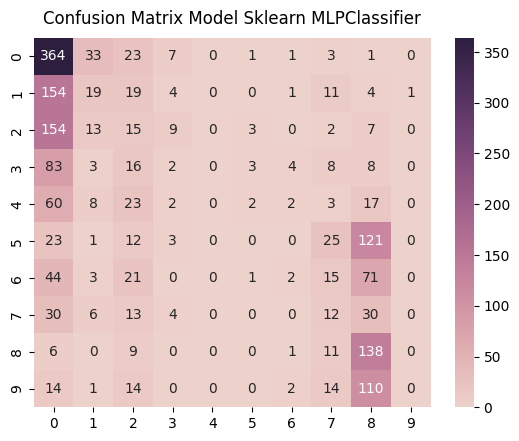

              precision    recall  f1-score      support
0.0            0.390558  0.840647  0.533333   433.000000
1.0            0.218391  0.089202  0.126667   213.000000
2.0            0.090909  0.073892  0.081522   203.000000
3.0            0.064516  0.015748  0.025316   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.153846  0.012739  0.023529   157.000000
7.0            0.115385  0.126316  0.120603    95.000000
8.0            0.272189  0.836364  0.410714   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.298378  0.298378  0.298378     0.298378
macro avg      0.130579  0.199491  0.132168  1850.000000
weighted avg   0.174218  0.298378  0.194917  1850.000000
Mean Squared Error:  7.553513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [247]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

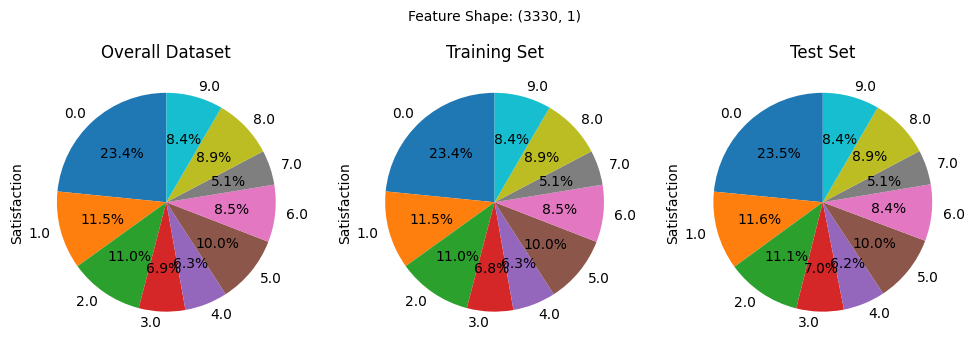

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


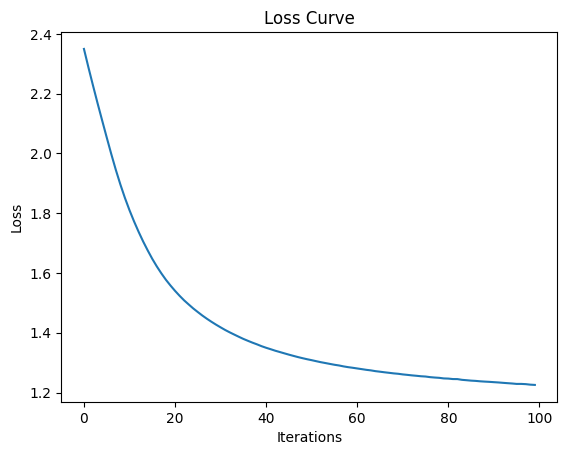

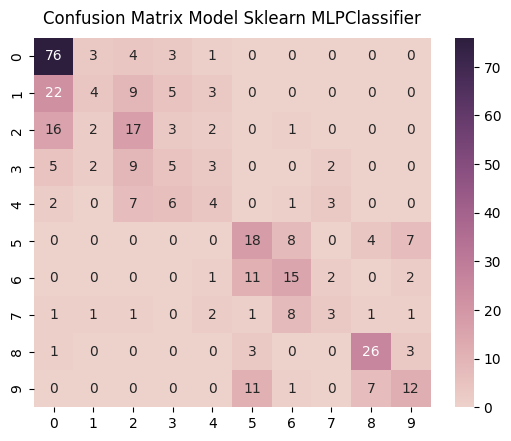

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


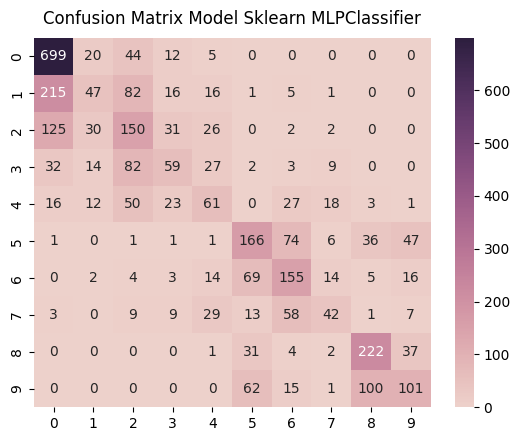

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


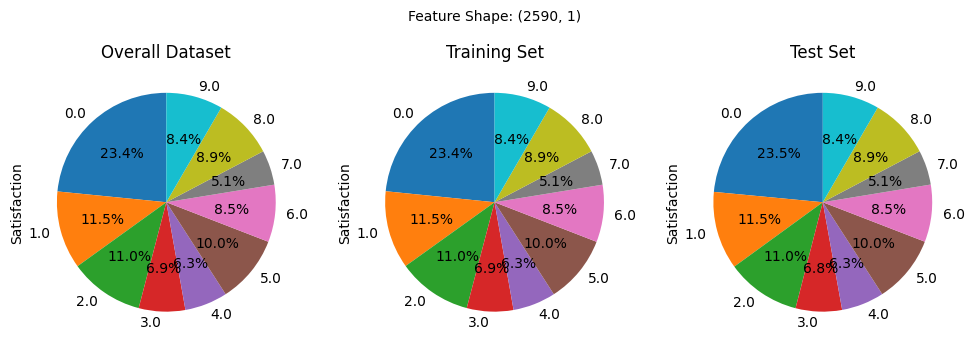

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


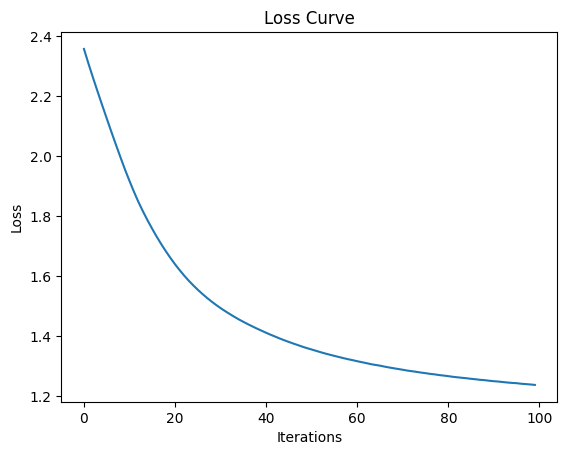

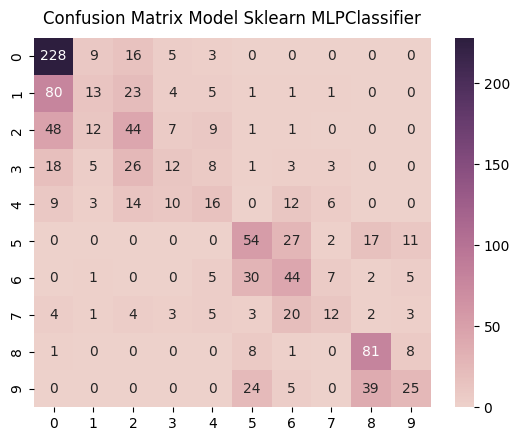

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


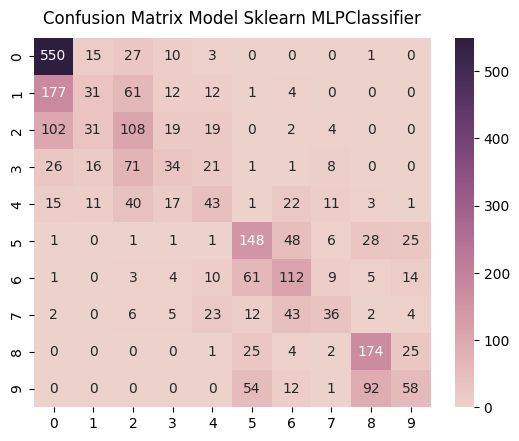

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


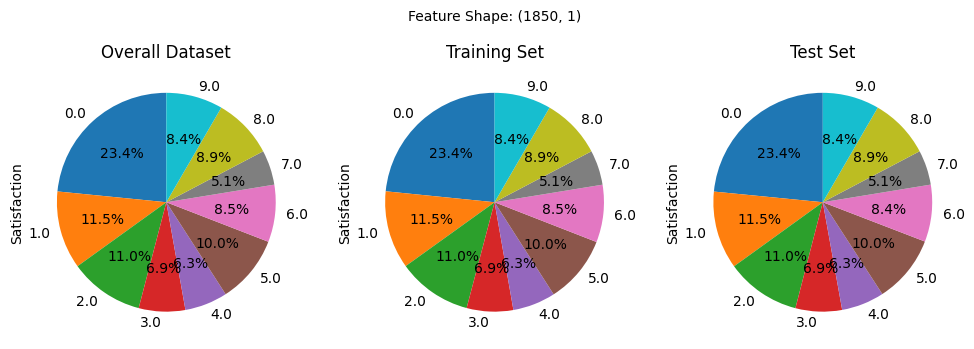

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


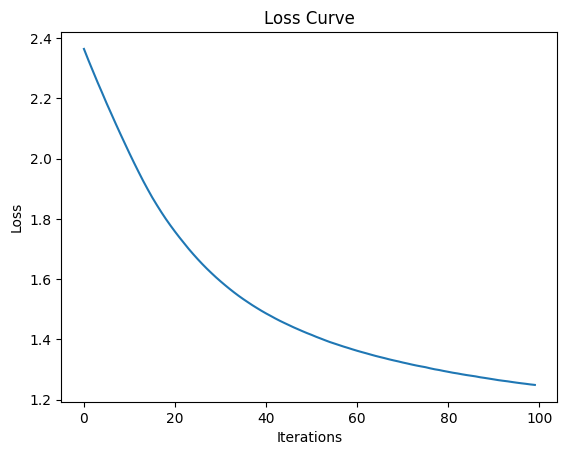

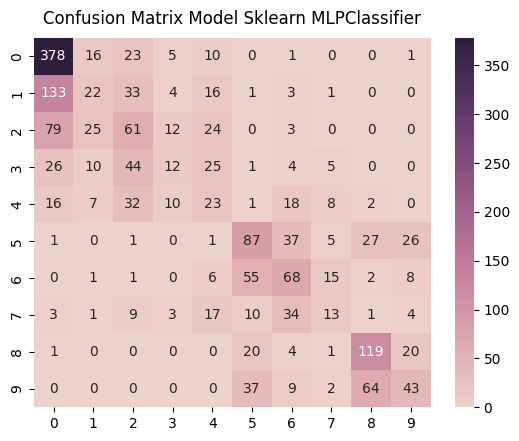

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


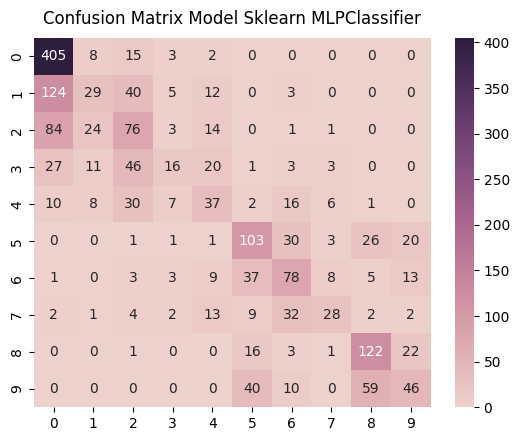

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [248]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 2 | 16 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


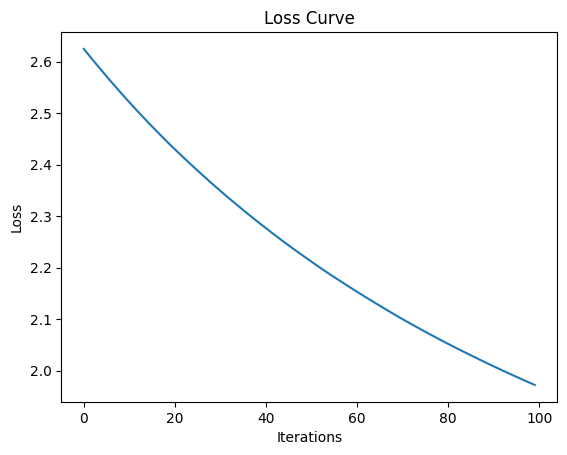

In [249]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [250]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

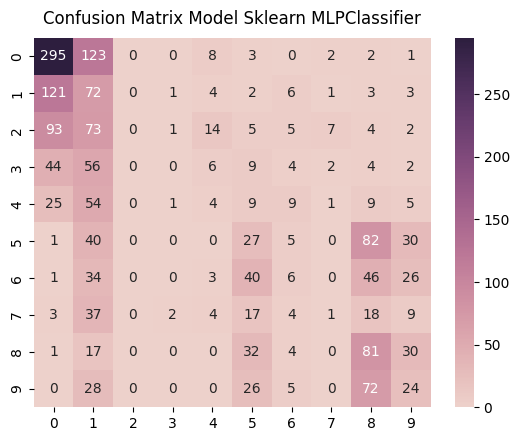

              precision    recall  f1-score      support
0.0            0.505137  0.679724  0.579568   434.000000
1.0            0.134831  0.338028  0.192771   213.000000
2.0            0.000000  0.000000  0.000000   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.093023  0.034188  0.050000   117.000000
5.0            0.158824  0.145946  0.152113   185.000000
6.0            0.125000  0.038462  0.058824   156.000000
7.0            0.071429  0.010526  0.018349    95.000000
8.0            0.252336  0.490909  0.333333   165.000000
9.0            0.181818  0.154839  0.167247   155.000000
accuracy       0.275527  0.275527  0.275527     0.275527
macro avg      0.152240  0.189262  0.155220  1851.000000
weighted avg   0.207627  0.275527  0.226054  1851.000000
Mean Squared Error:  7.0124257158292815


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [251]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

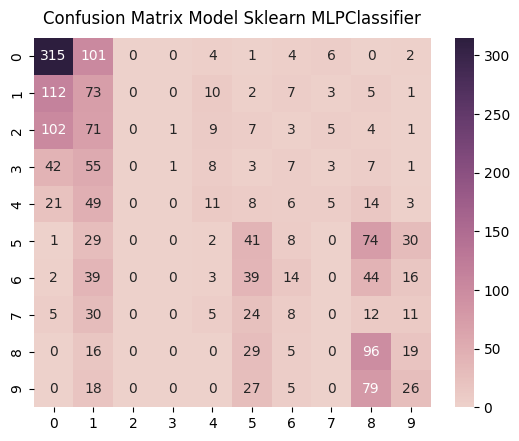

              precision    recall  f1-score      support
0.0            0.525000  0.727483  0.609874   433.000000
1.0            0.151767  0.342723  0.210375   213.000000
2.0            0.000000  0.000000  0.000000   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.211538  0.094017  0.130178   117.000000
5.0            0.226519  0.221622  0.224044   185.000000
6.0            0.208955  0.089172  0.125000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.286567  0.581818  0.384000   165.000000
9.0            0.236364  0.167742  0.196226   155.000000
accuracy       0.311892  0.311892  0.311892     0.311892
macro avg      0.234671  0.223245  0.189520  1850.000000
weighted avg   0.273802  0.311892  0.259964  1850.000000
Mean Squared Error:  6.507567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [252]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

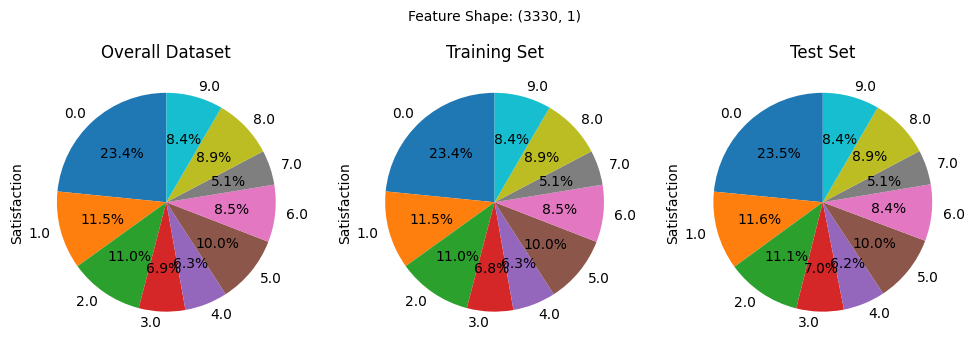

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


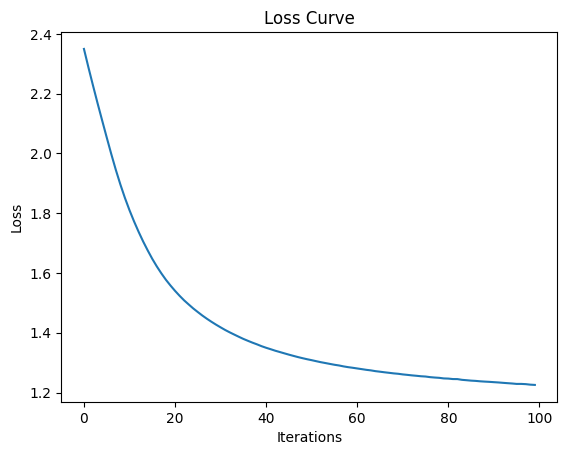

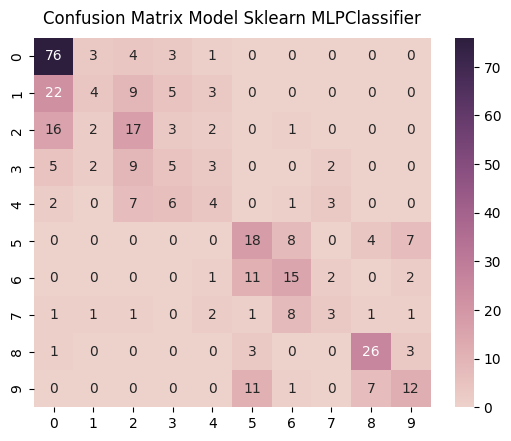

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


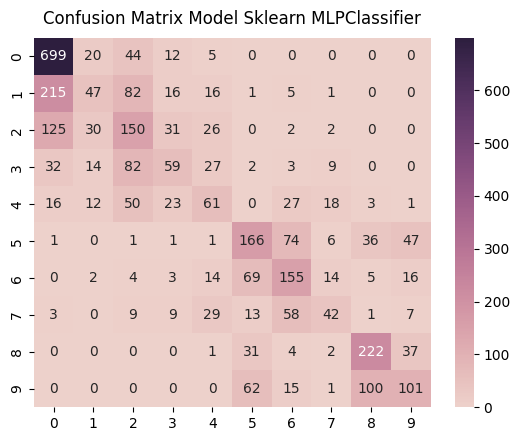

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


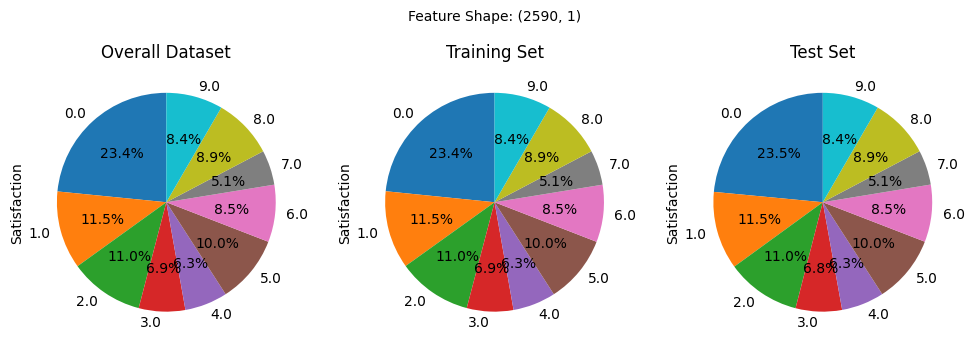

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


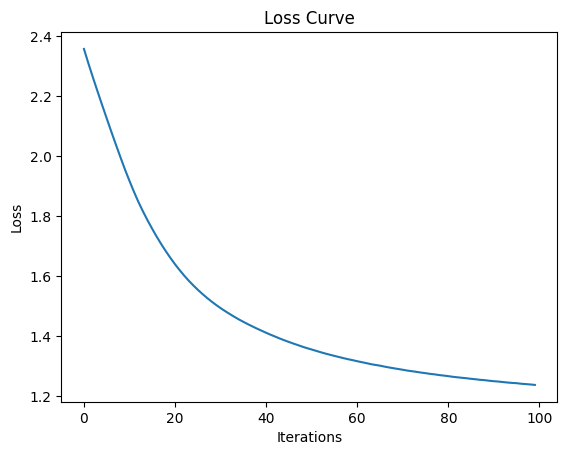

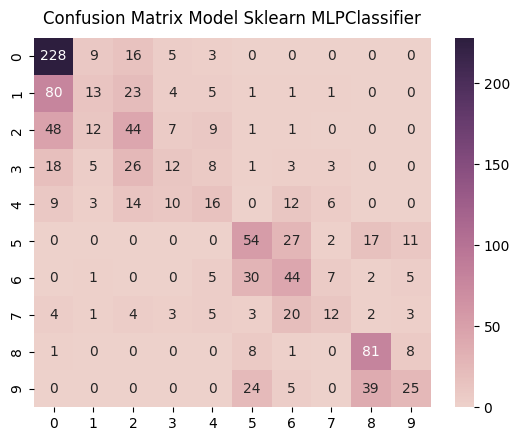

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


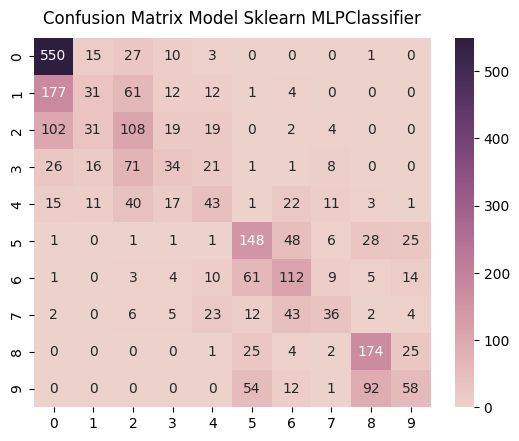

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


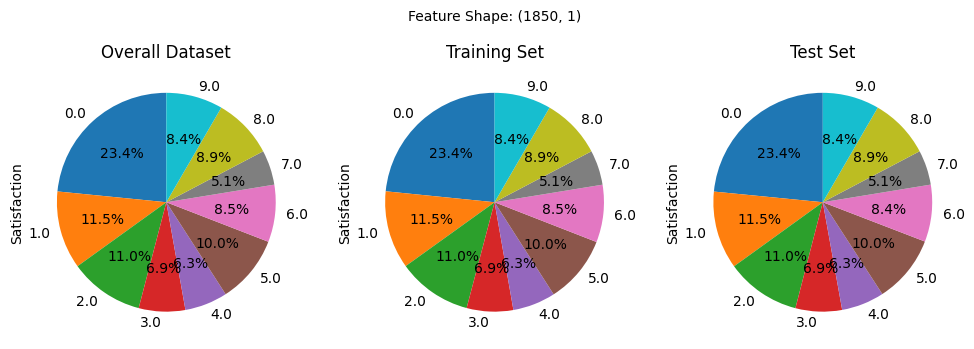

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


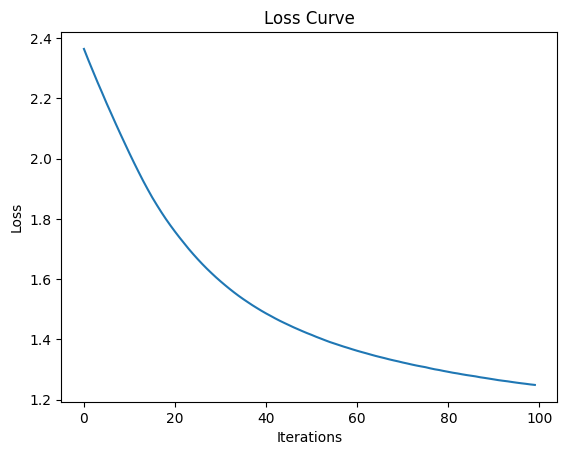

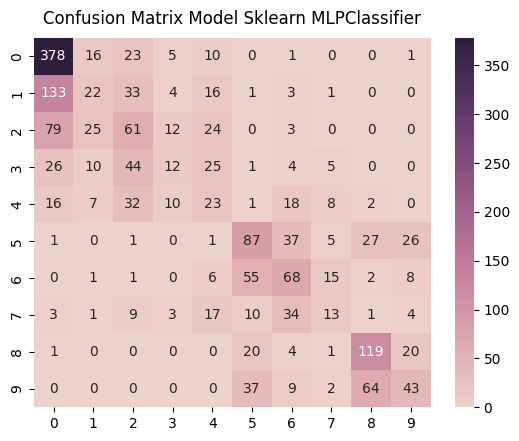

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


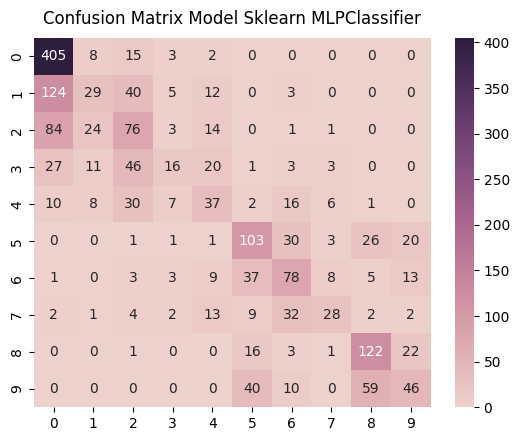

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [253]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 3 | 32 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


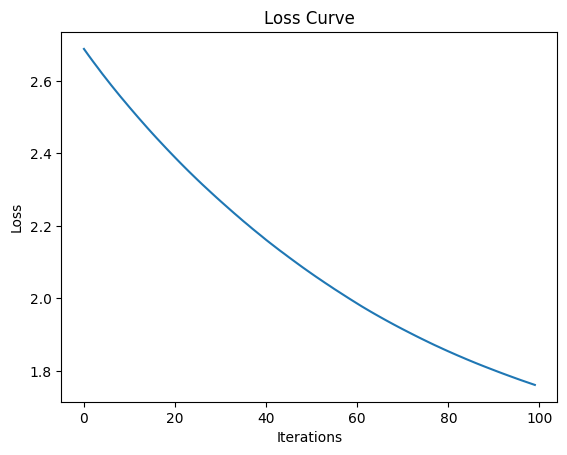

In [254]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [255]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

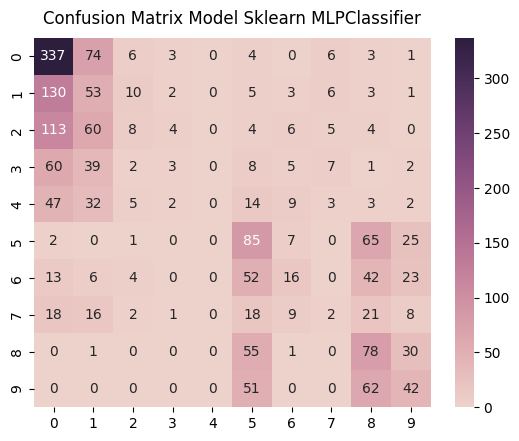

              precision    recall  f1-score      support
0.0            0.468056  0.776498  0.584055   434.000000
1.0            0.188612  0.248826  0.214575   213.000000
2.0            0.210526  0.039216  0.066116   204.000000
3.0            0.200000  0.023622  0.042254   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.287162  0.459459  0.353430   185.000000
6.0            0.285714  0.102564  0.150943   156.000000
7.0            0.068966  0.021053  0.032258    95.000000
8.0            0.276596  0.472727  0.348993   165.000000
9.0            0.313433  0.270968  0.290657   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.229906  0.241493  0.208328  1851.000000
weighted avg   0.275595  0.337115  0.276969  1851.000000
Mean Squared Error:  5.366828741220962


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [256]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

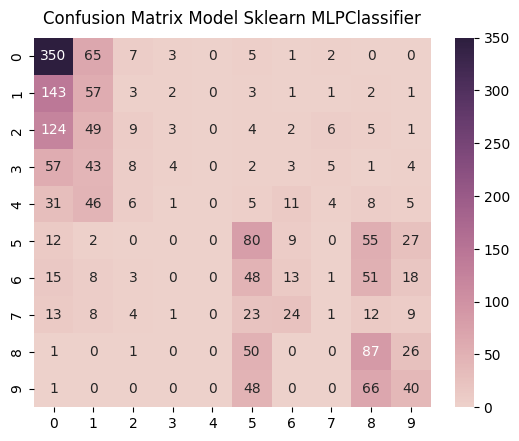

              precision    recall  f1-score      support
0.0            0.468541  0.808314  0.593220   433.000000
1.0            0.205036  0.267606  0.232179   213.000000
2.0            0.219512  0.044335  0.073770   203.000000
3.0            0.285714  0.031496  0.056738   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.298507  0.432432  0.353201   185.000000
6.0            0.203125  0.082803  0.117647   157.000000
7.0            0.050000  0.010526  0.017391    95.000000
8.0            0.303136  0.527273  0.384956   165.000000
9.0            0.305344  0.258065  0.279720   155.000000
accuracy       0.346486  0.346486  0.346486     0.346486
macro avg      0.233892  0.246285  0.210882  1850.000000
weighted avg   0.279247  0.346486  0.281535  1850.000000
Mean Squared Error:  4.981621621621621


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [257]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

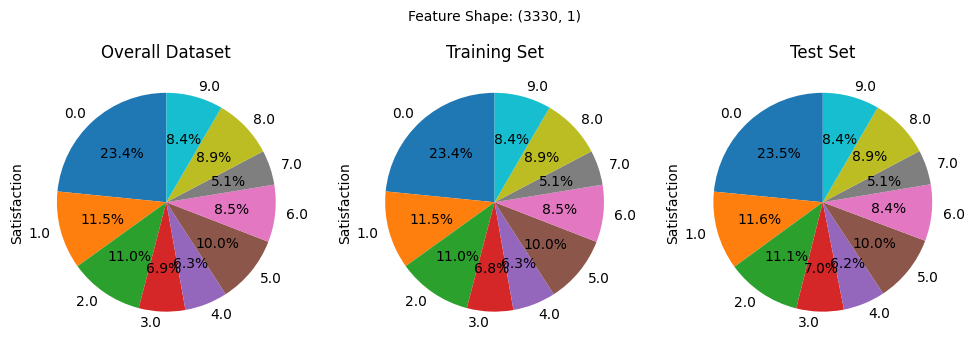

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


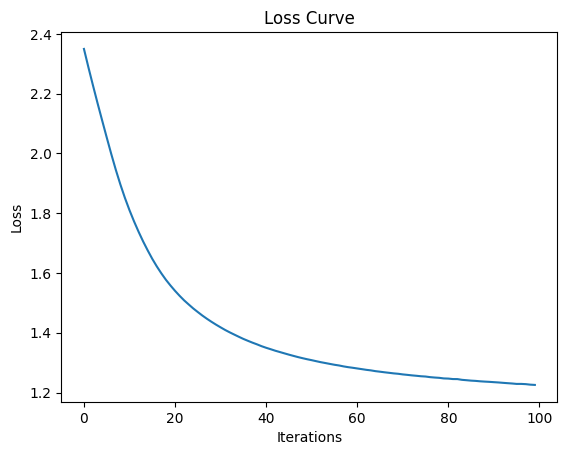

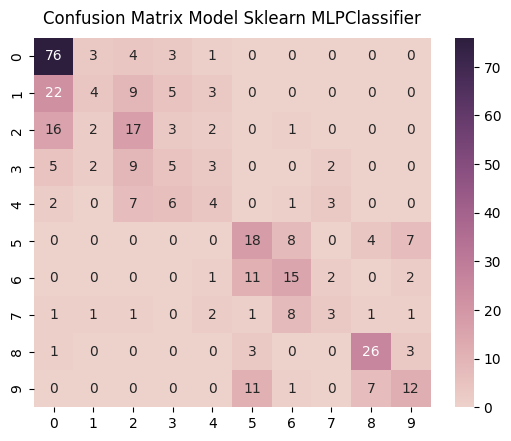

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


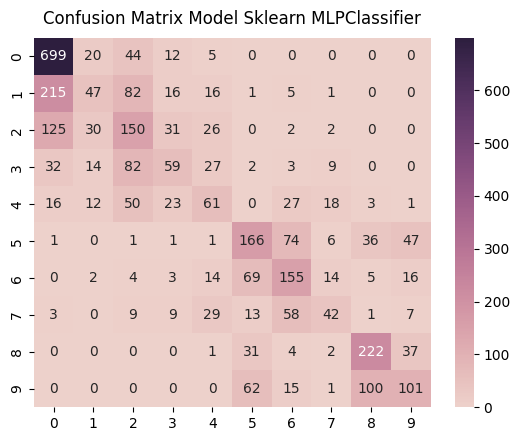

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


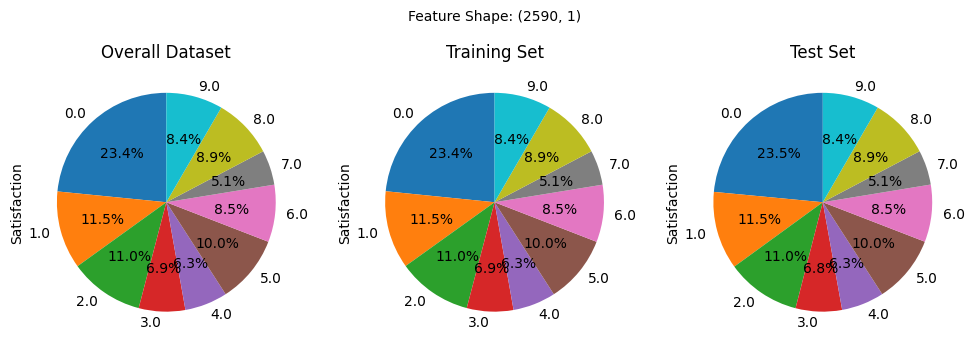

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


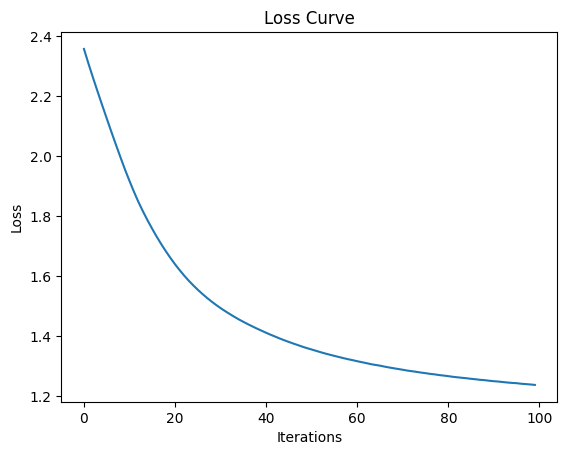

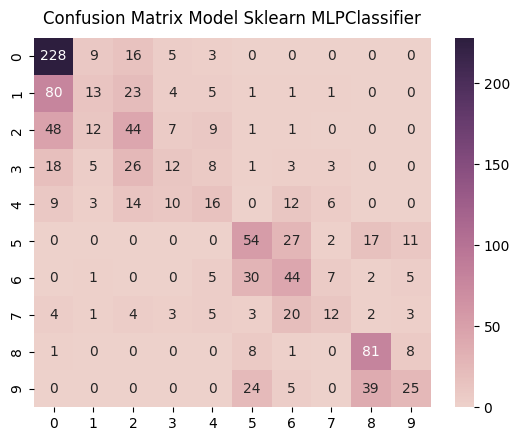

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


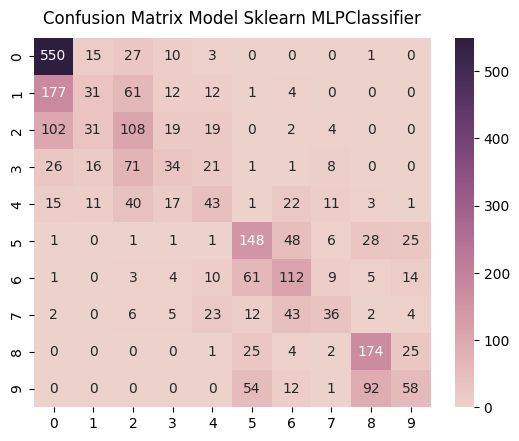

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


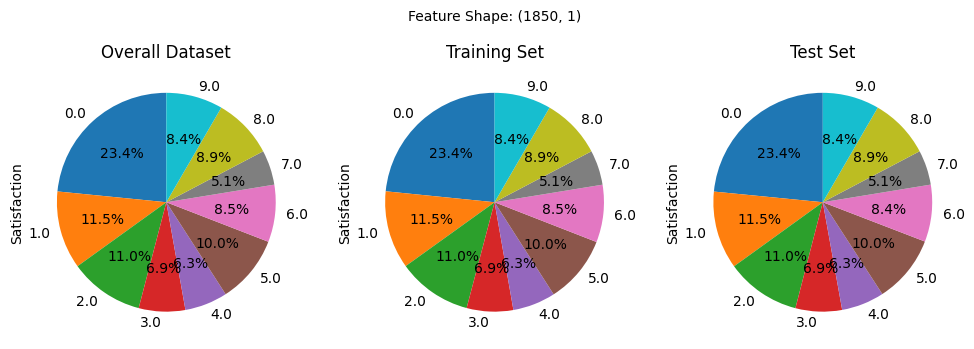

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


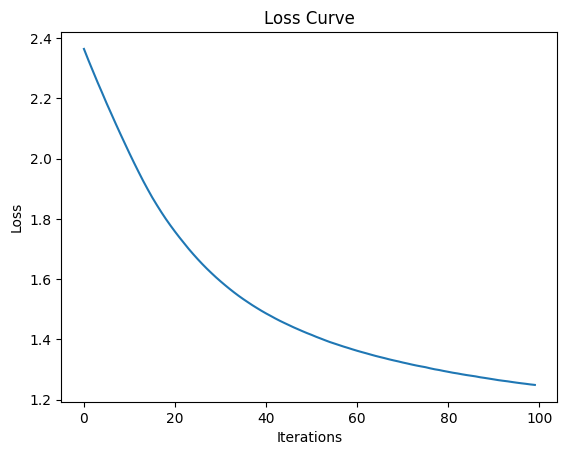

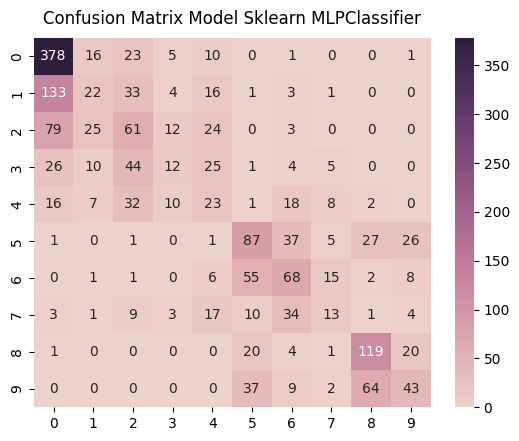

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


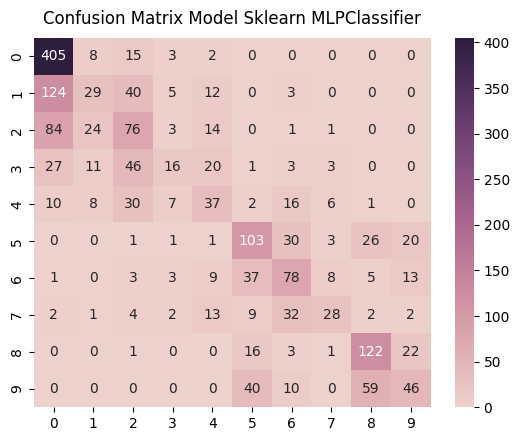

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [258]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 4 | 64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


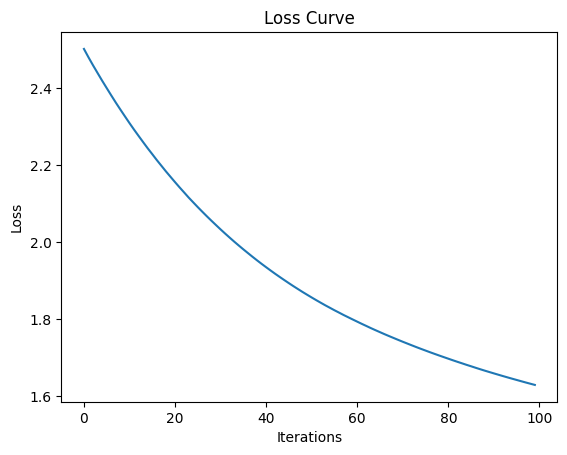

In [259]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [260]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

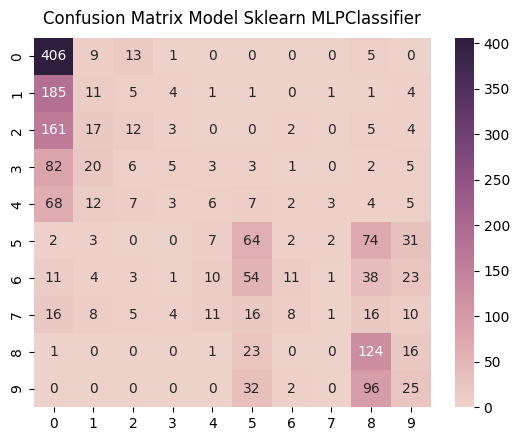

              precision    recall  f1-score      support
0.0            0.435622  0.935484  0.594436   434.000000
1.0            0.130952  0.051643  0.074074   213.000000
2.0            0.235294  0.058824  0.094118   204.000000
3.0            0.238095  0.039370  0.067568   127.000000
4.0            0.153846  0.051282  0.076923   117.000000
5.0            0.320000  0.345946  0.332468   185.000000
6.0            0.392857  0.070513  0.119565   156.000000
7.0            0.125000  0.010526  0.019417    95.000000
8.0            0.339726  0.751515  0.467925   165.000000
9.0            0.203252  0.161290  0.179856   155.000000
accuracy       0.359265  0.359265  0.359265     0.359265
macro avg      0.257465  0.247639  0.202635  1851.000000
weighted avg   0.288012  0.359265  0.268845  1851.000000
Mean Squared Error:  5.008643976229066


In [261]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

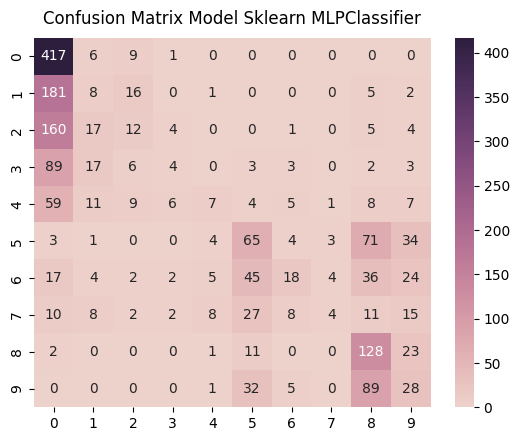

              precision    recall  f1-score      support
0.0            0.444563  0.963048  0.608315   433.000000
1.0            0.111111  0.037559  0.056140   213.000000
2.0            0.214286  0.059113  0.092664   203.000000
3.0            0.210526  0.031496  0.054795   127.000000
4.0            0.259259  0.059829  0.097222   117.000000
5.0            0.347594  0.351351  0.349462   185.000000
6.0            0.409091  0.114650  0.179104   157.000000
7.0            0.333333  0.042105  0.074766    95.000000
8.0            0.360563  0.775758  0.492308   165.000000
9.0            0.200000  0.180645  0.189831   155.000000
accuracy       0.373514  0.373514  0.373514     0.373514
macro avg      0.289033  0.261555  0.219461  1850.000000
weighted avg   0.306716  0.373514  0.282719  1850.000000
Mean Squared Error:  4.7118918918918915


In [262]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

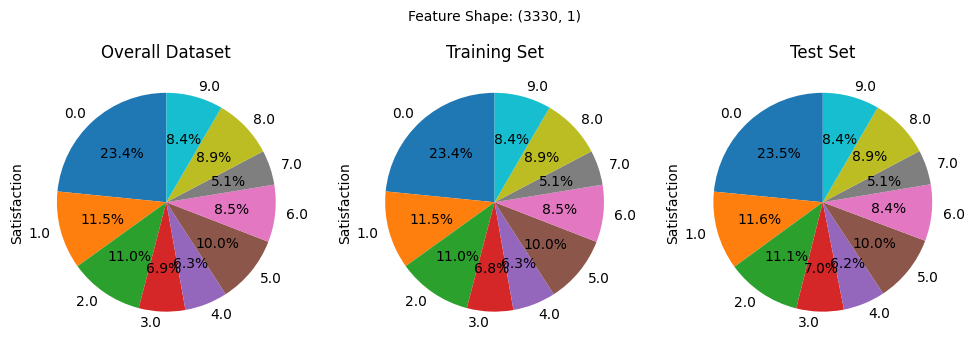

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


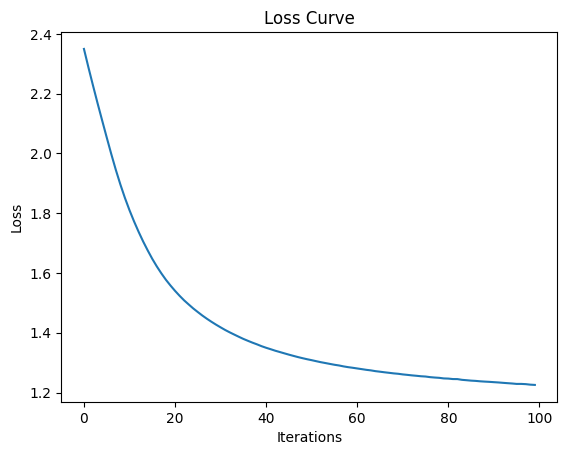

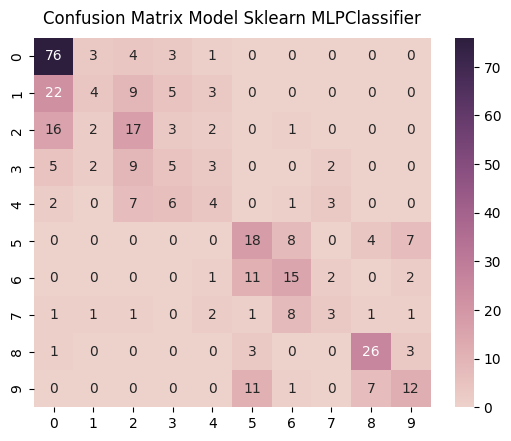

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


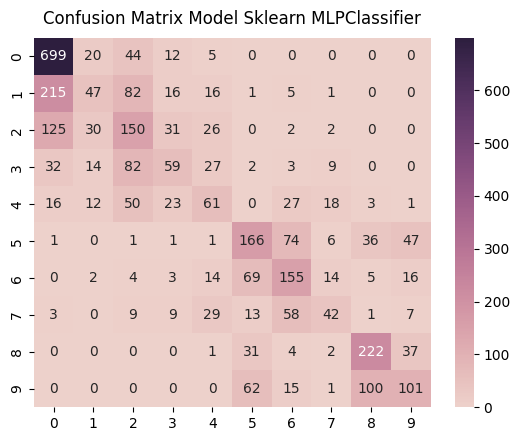

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


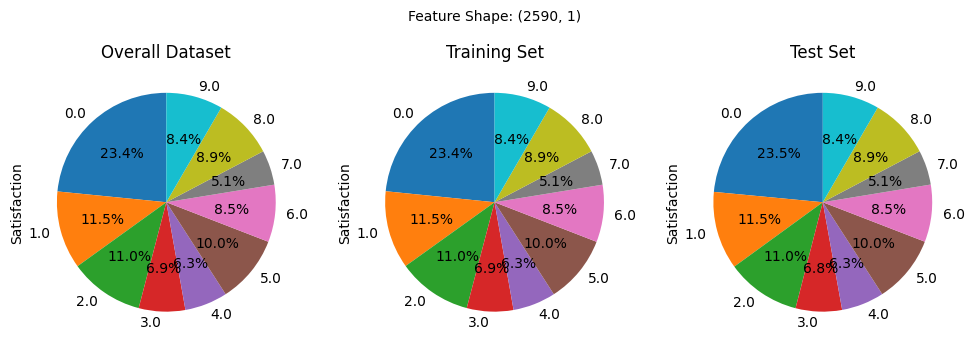

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


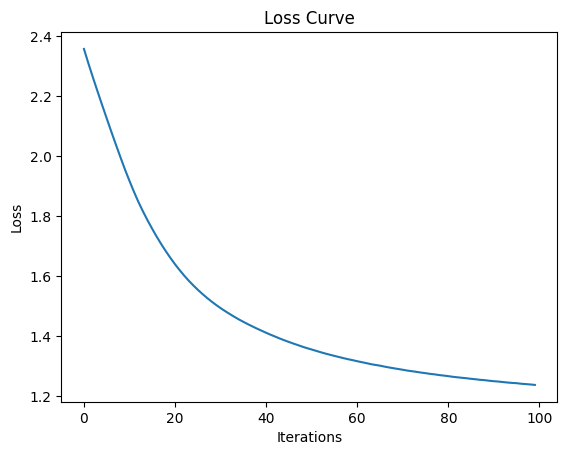

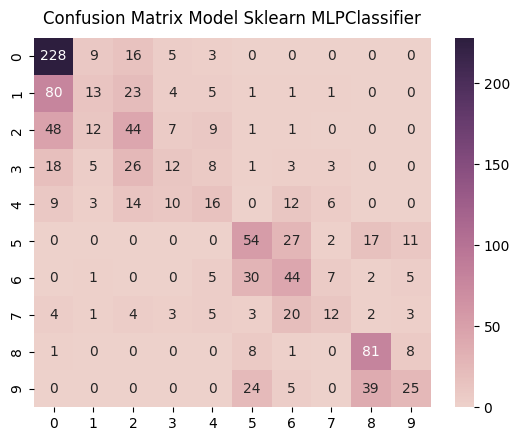

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


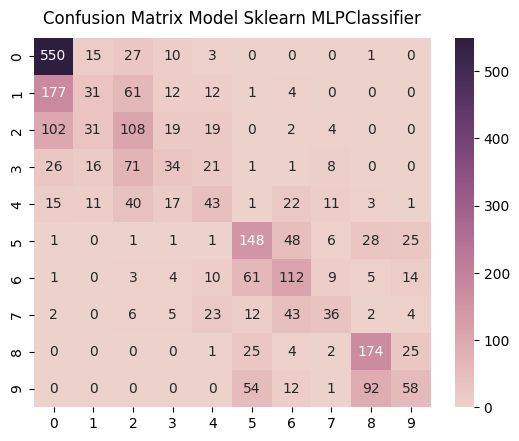

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


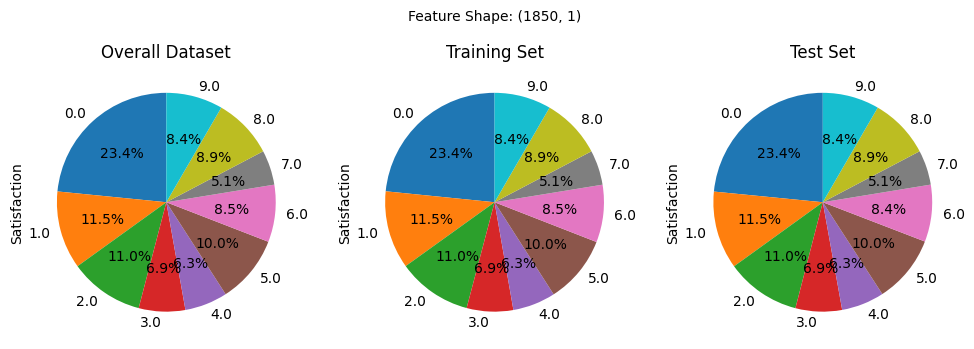

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


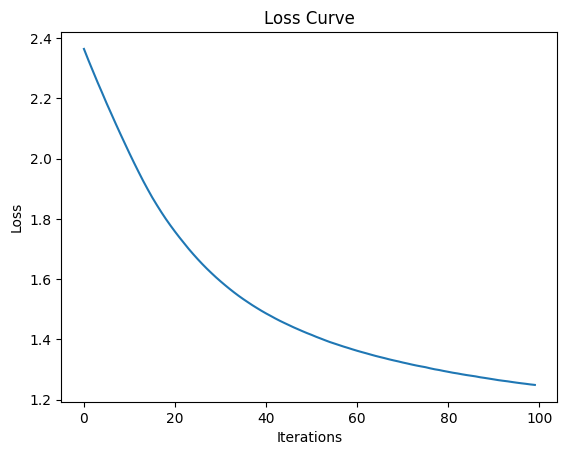

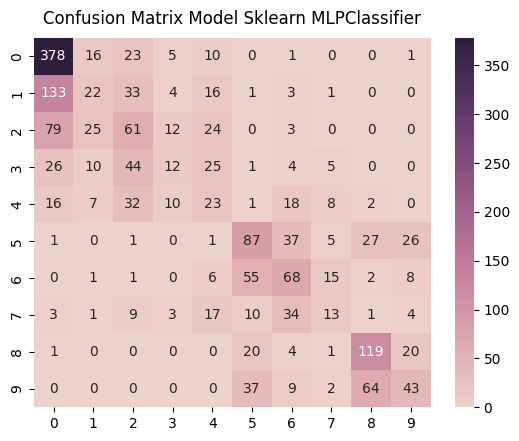

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


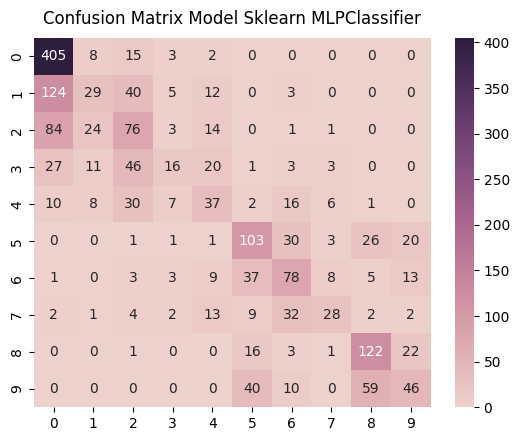

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [263]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 5 | 128 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


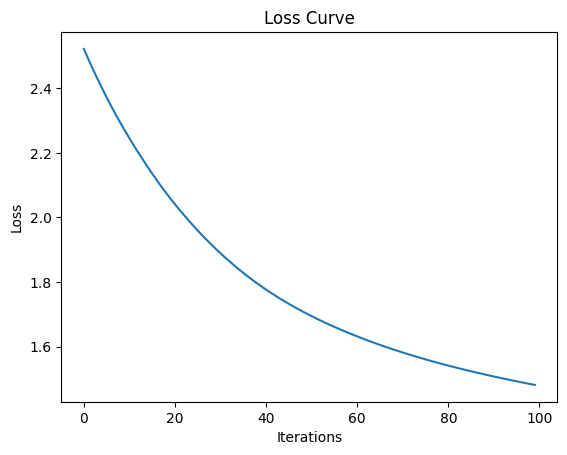

In [264]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [265]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

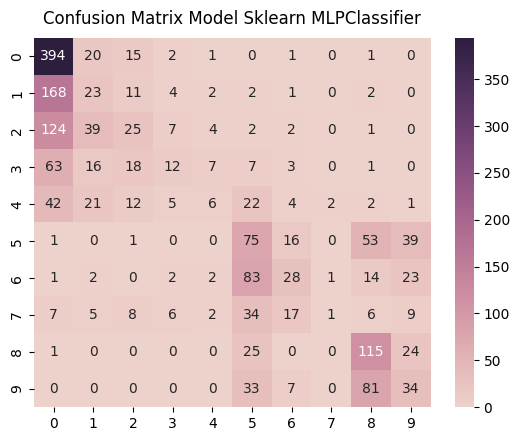

              precision    recall  f1-score      support
0.0            0.491885  0.907834  0.638057   434.000000
1.0            0.182540  0.107981  0.135693   213.000000
2.0            0.277778  0.122549  0.170068   204.000000
3.0            0.315789  0.094488  0.145455   127.000000
4.0            0.250000  0.051282  0.085106   117.000000
5.0            0.265018  0.405405  0.320513   185.000000
6.0            0.354430  0.179487  0.238298   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.416667  0.696970  0.521542   165.000000
9.0            0.261538  0.219355  0.238596   155.000000
accuracy       0.385197  0.385197  0.385197     0.385197
macro avg      0.306565  0.279588  0.251353  1851.000000
weighted avg   0.332652  0.385197  0.318946  1851.000000
Mean Squared Error:  3.5742841707185304


In [266]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

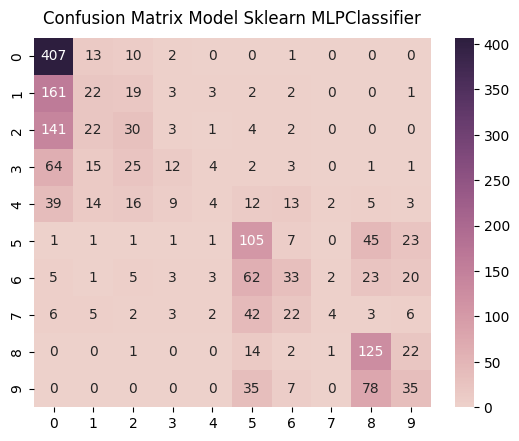

              precision    recall  f1-score  support
0.0            0.493932  0.939954  0.647574   433.00
1.0            0.236559  0.103286  0.143791   213.00
2.0            0.275229  0.147783  0.192308   203.00
3.0            0.333333  0.094488  0.147239   127.00
4.0            0.222222  0.034188  0.059259   117.00
5.0            0.377698  0.567568  0.453564   185.00
6.0            0.358696  0.210191  0.265060   157.00
7.0            0.444444  0.042105  0.076923    95.00
8.0            0.446429  0.757576  0.561798   165.00
9.0            0.315315  0.225806  0.263158   155.00
accuracy       0.420000  0.420000  0.420000     0.42
macro avg      0.350386  0.312295  0.281067  1850.00
weighted avg   0.367249  0.420000  0.347035  1850.00
Mean Squared Error:  3.324324324324324


In [267]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

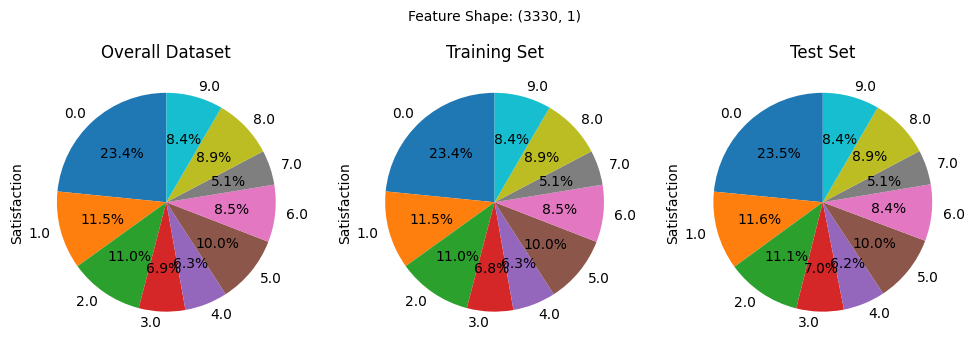

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


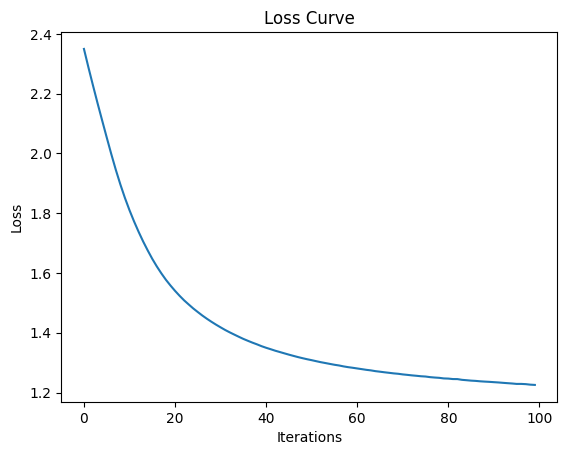

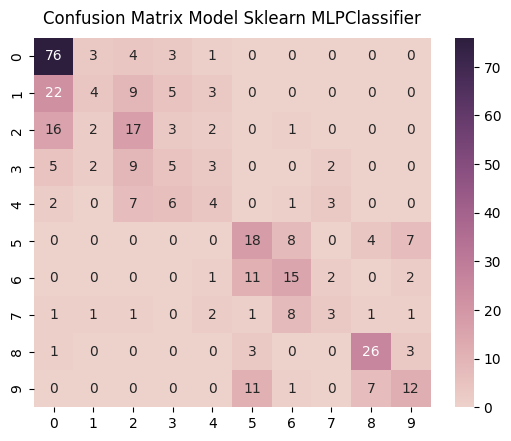

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


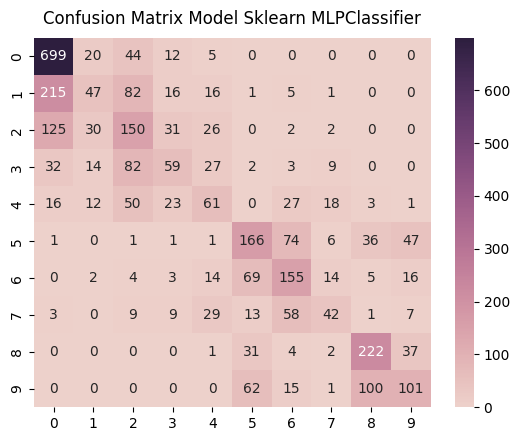

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


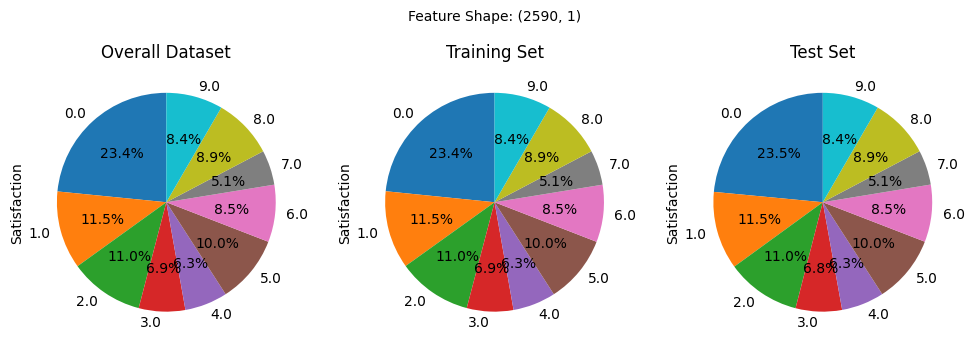

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


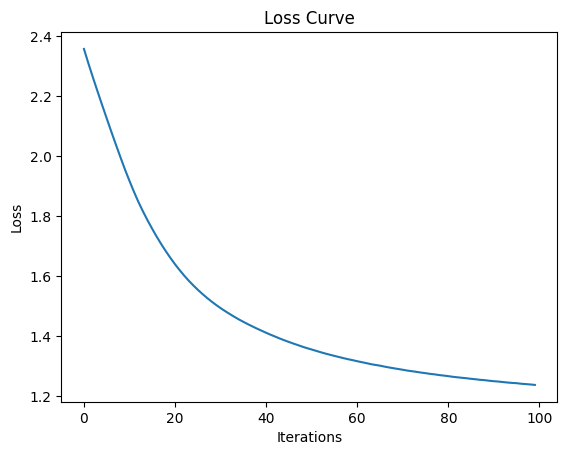

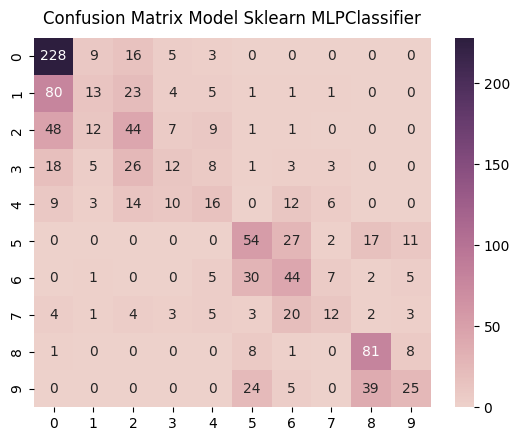

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


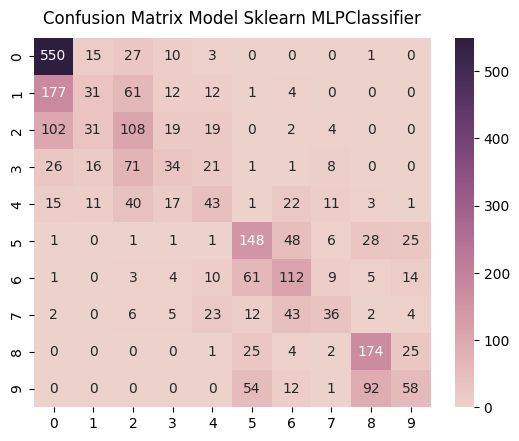

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


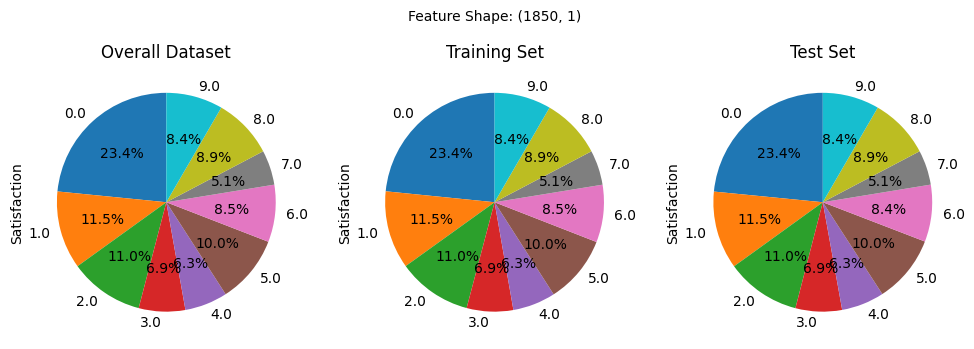

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


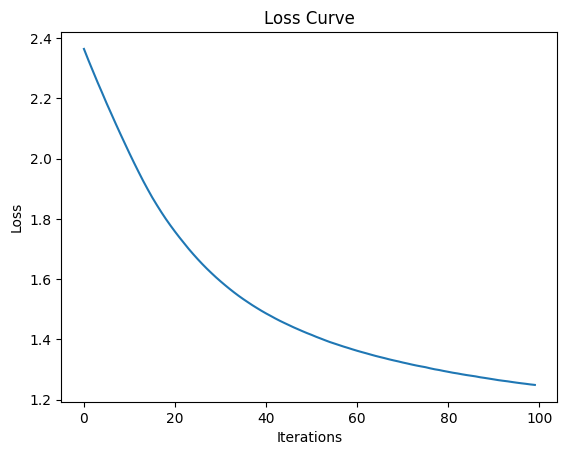

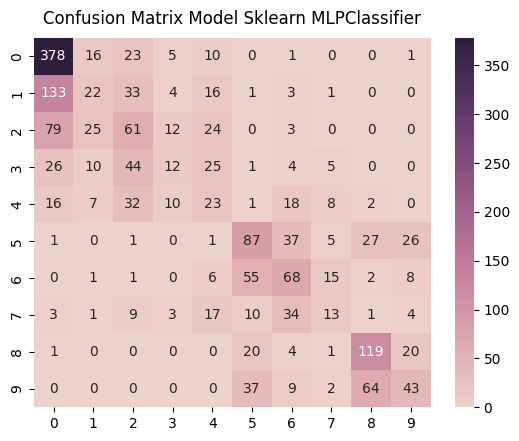

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


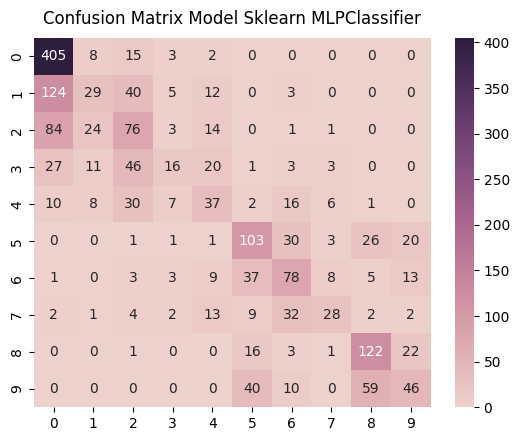

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [268]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## Two Hidden Layer

### Experiment 1 | 32/64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


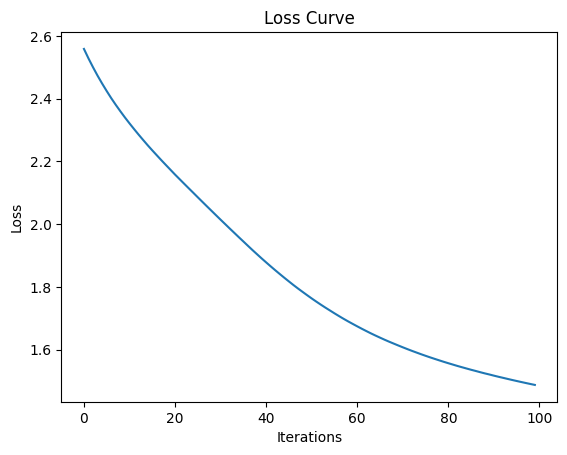

In [269]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [270]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

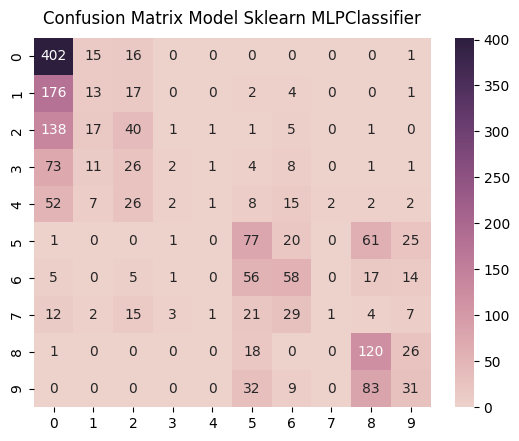

              precision    recall  f1-score      support
0.0            0.467442  0.926267  0.621329   434.000000
1.0            0.200000  0.061033  0.093525   213.000000
2.0            0.275862  0.196078  0.229226   204.000000
3.0            0.200000  0.015748  0.029197   127.000000
4.0            0.250000  0.008547  0.016529   117.000000
5.0            0.351598  0.416216  0.381188   185.000000
6.0            0.391892  0.371795  0.381579   156.000000
7.0            0.333333  0.010526  0.020408    95.000000
8.0            0.415225  0.727273  0.528634   165.000000
9.0            0.287037  0.200000  0.235741   155.000000
accuracy       0.402485  0.402485  0.402485     0.402485
macro avg      0.317239  0.293348  0.253736  1851.000000
weighted avg   0.338869  0.402485  0.322923  1851.000000
Mean Squared Error:  3.7687736358725012


In [271]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

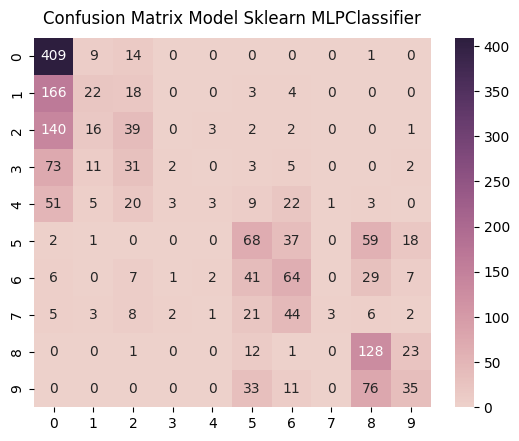

              precision    recall  f1-score      support
0.0            0.480047  0.944573  0.636576   433.000000
1.0            0.328358  0.103286  0.157143   213.000000
2.0            0.282609  0.192118  0.228739   203.000000
3.0            0.250000  0.015748  0.029630   127.000000
4.0            0.333333  0.025641  0.047619   117.000000
5.0            0.354167  0.367568  0.360743   185.000000
6.0            0.336842  0.407643  0.368876   157.000000
7.0            0.750000  0.031579  0.060606    95.000000
8.0            0.423841  0.775758  0.548180   165.000000
9.0            0.397727  0.225806  0.288066   155.000000
accuracy       0.417838  0.417838  0.417838     0.417838
macro avg      0.393692  0.308972  0.272618  1850.000000
weighted avg   0.393058  0.417838  0.340749  1850.000000
Mean Squared Error:  3.3535135135135135


In [272]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

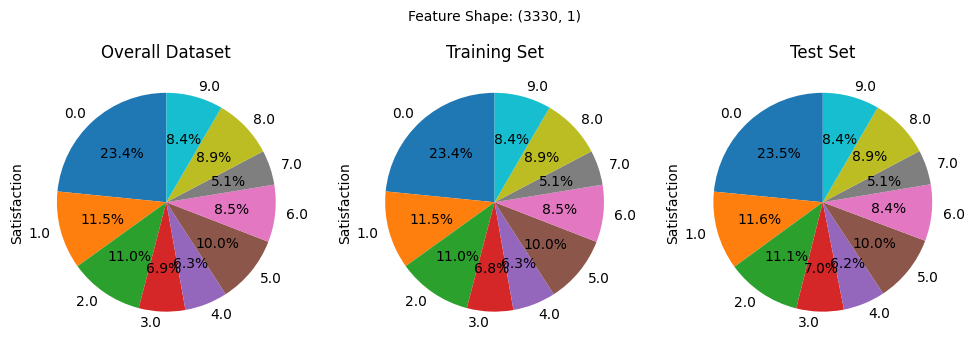

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


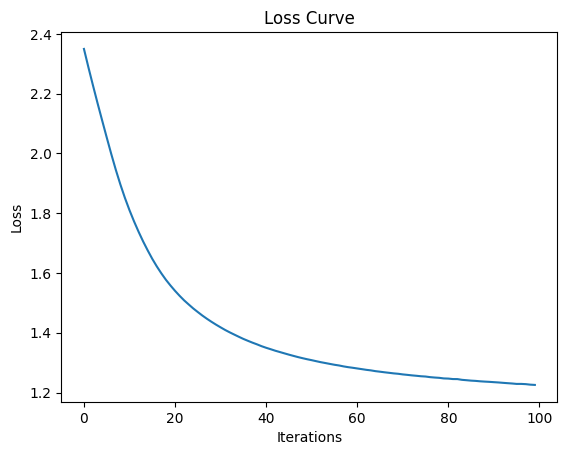

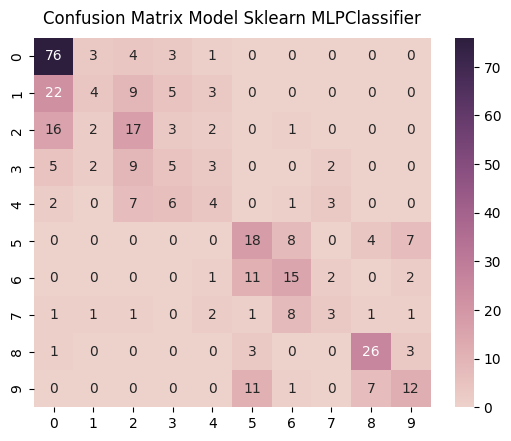

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


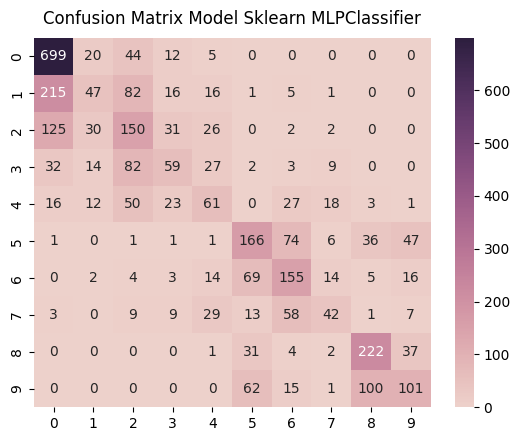

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


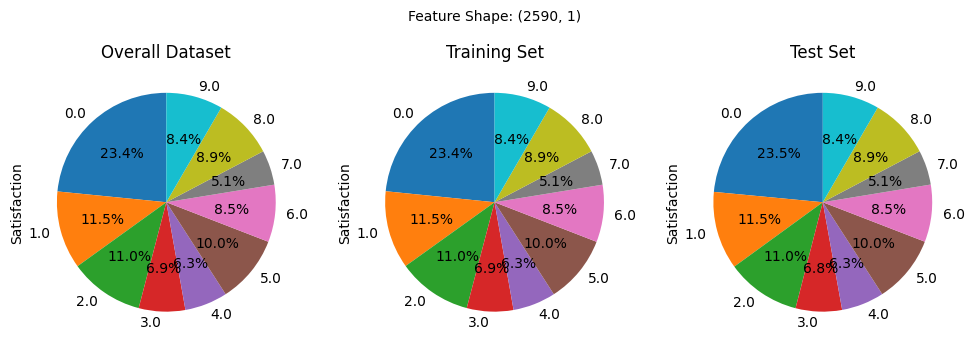

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


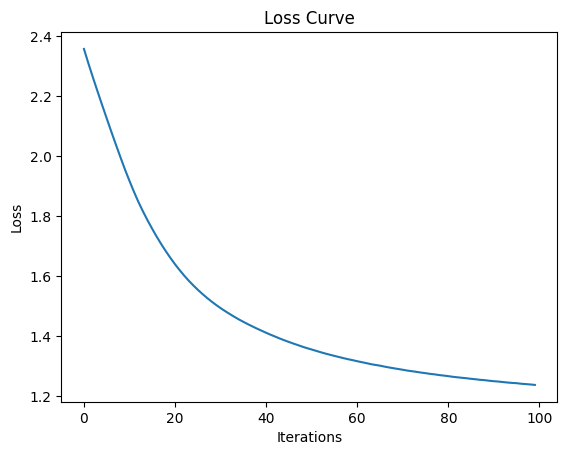

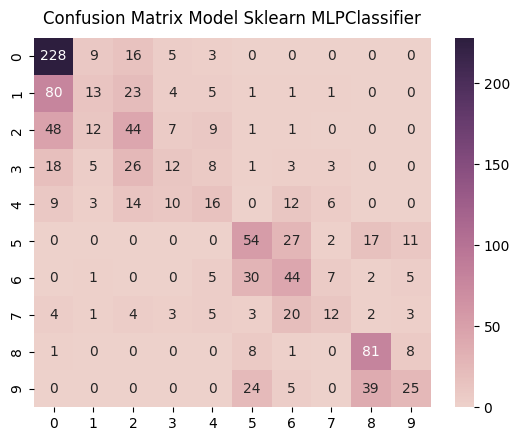

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


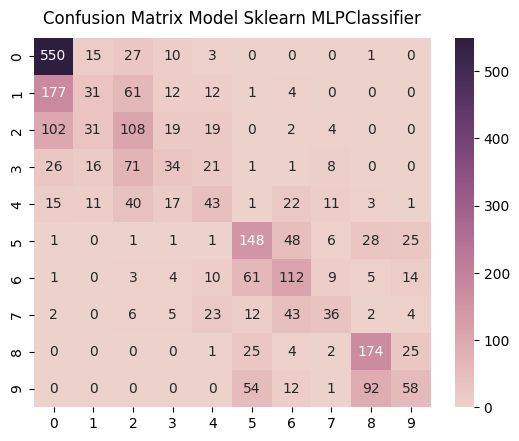

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


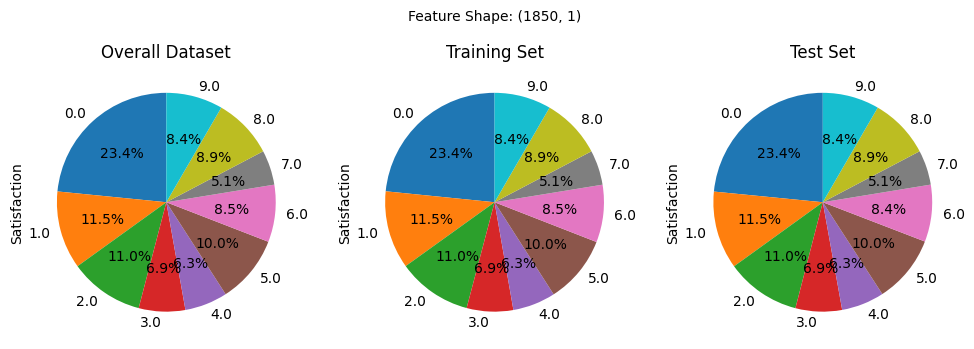

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


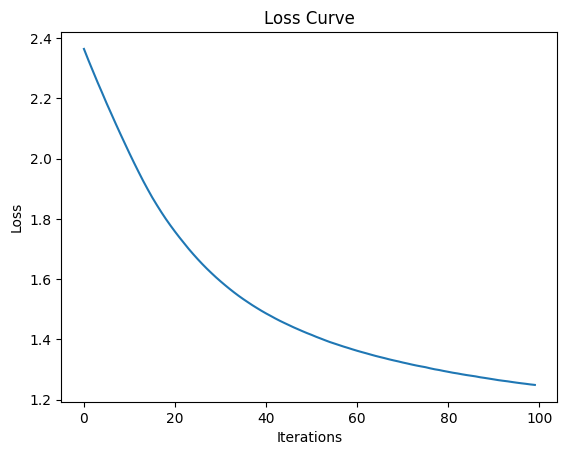

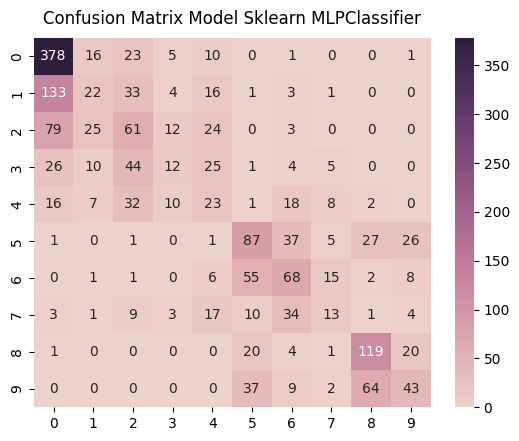

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


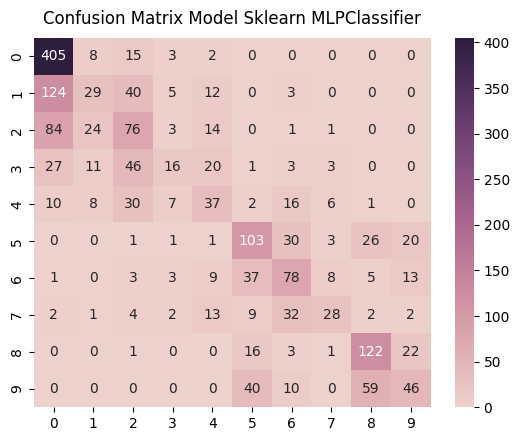

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [273]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 2 | 32/128 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


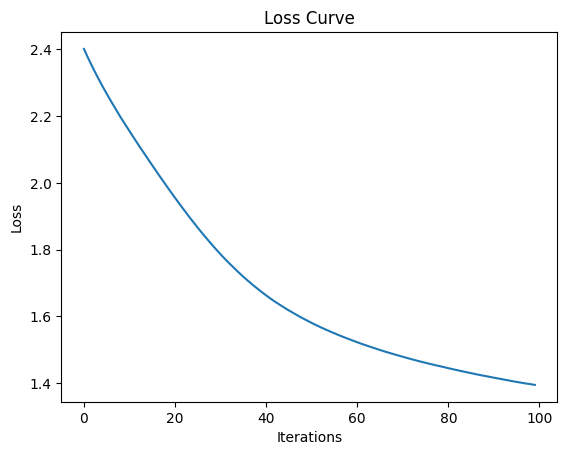

In [274]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [275]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

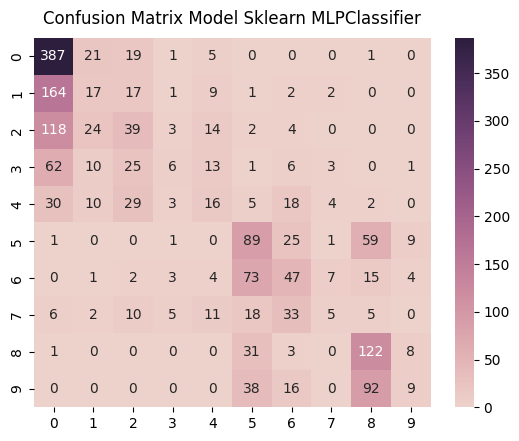

              precision    recall  f1-score      support
0.0            0.503251  0.891705  0.643392   434.000000
1.0            0.200000  0.079812  0.114094   213.000000
2.0            0.276596  0.191176  0.226087   204.000000
3.0            0.260870  0.047244  0.080000   127.000000
4.0            0.222222  0.136752  0.169312   117.000000
5.0            0.344961  0.481081  0.401806   185.000000
6.0            0.305195  0.301282  0.303226   156.000000
7.0            0.227273  0.052632  0.085470    95.000000
8.0            0.412162  0.739394  0.529284   165.000000
9.0            0.290323  0.058065  0.096774   155.000000
accuracy       0.398163  0.398163  0.398163     0.398163
macro avg      0.304285  0.297914  0.264944  1851.000000
weighted avg   0.336355  0.398163  0.330478  1851.000000
Mean Squared Error:  3.254457050243112


In [276]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

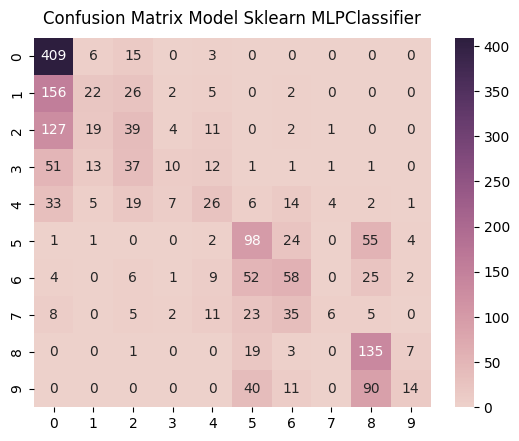

              precision    recall  f1-score      support
0.0            0.518378  0.944573  0.669394   433.000000
1.0            0.333333  0.103286  0.157706   213.000000
2.0            0.263514  0.192118  0.222222   203.000000
3.0            0.384615  0.078740  0.130719   127.000000
4.0            0.329114  0.222222  0.265306   117.000000
5.0            0.410042  0.529730  0.462264   185.000000
6.0            0.386667  0.369427  0.377850   157.000000
7.0            0.500000  0.063158  0.112150    95.000000
8.0            0.431310  0.818182  0.564854   165.000000
9.0            0.500000  0.090323  0.153005   155.000000
accuracy       0.441622  0.441622  0.441622     0.441622
macro avg      0.405697  0.341176  0.311547  1850.000000
weighted avg   0.415694  0.441622  0.372219  1850.000000
Mean Squared Error:  2.903783783783784


In [277]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

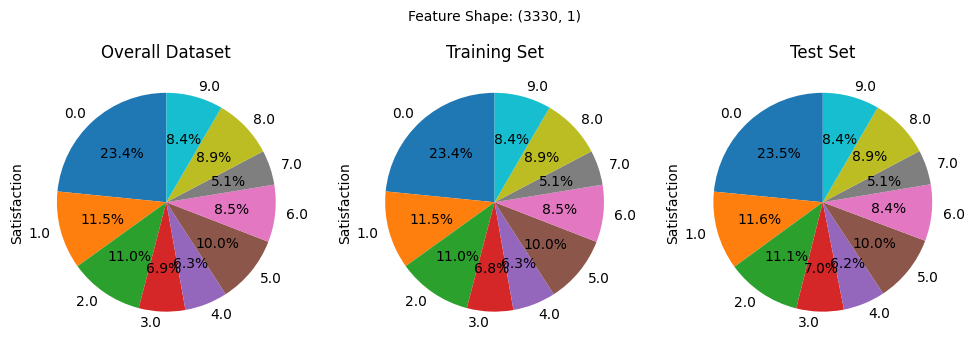

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


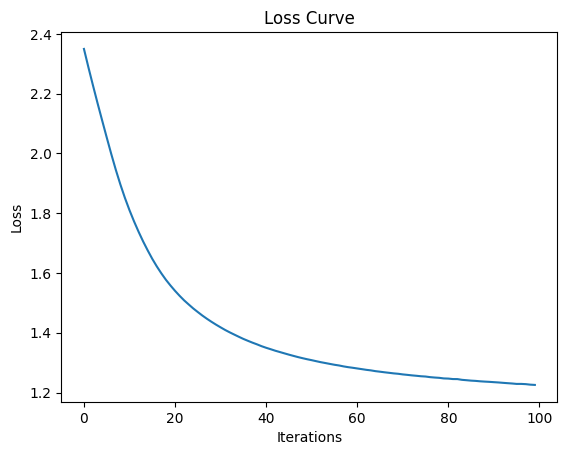

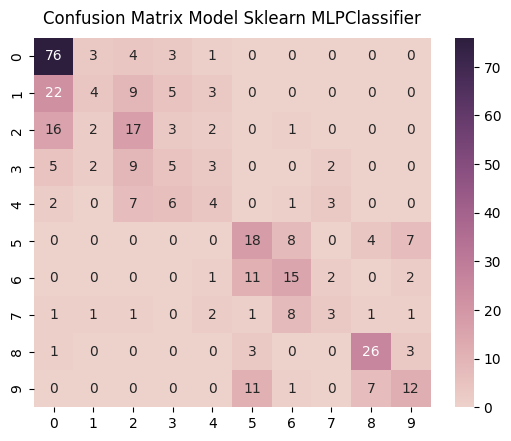

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


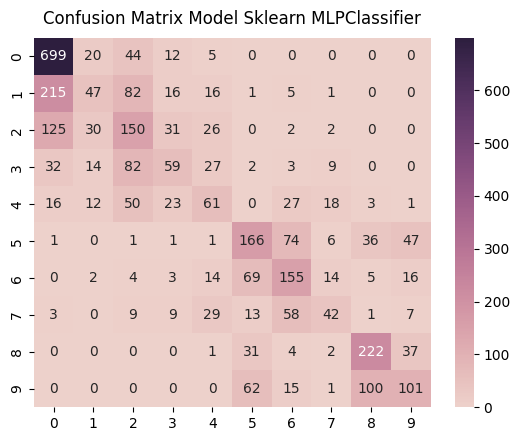

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


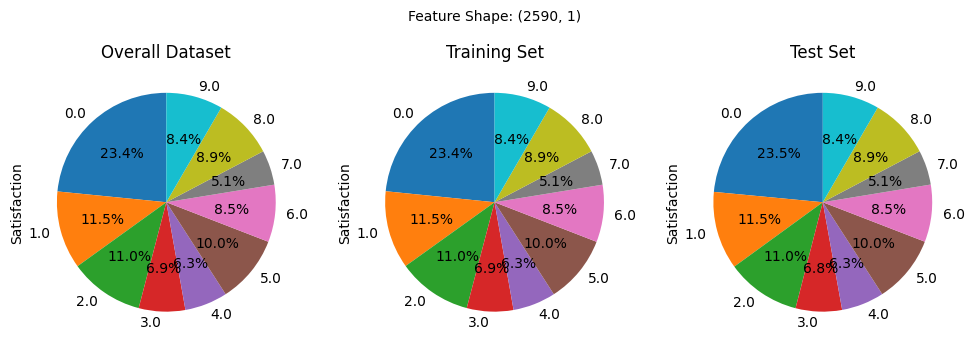

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


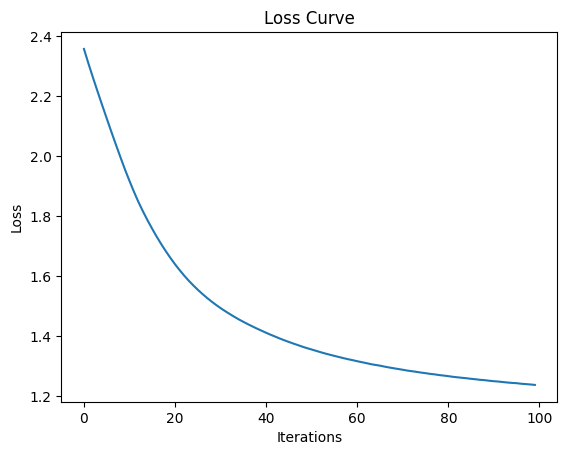

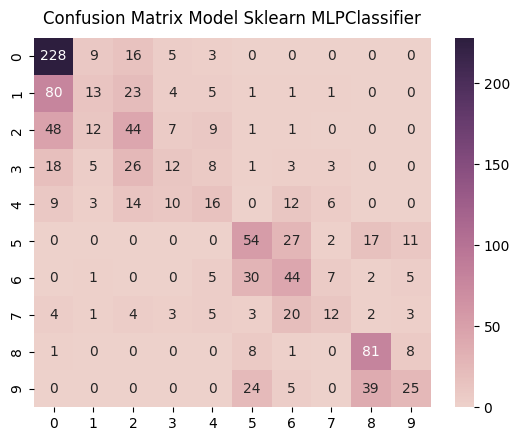

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


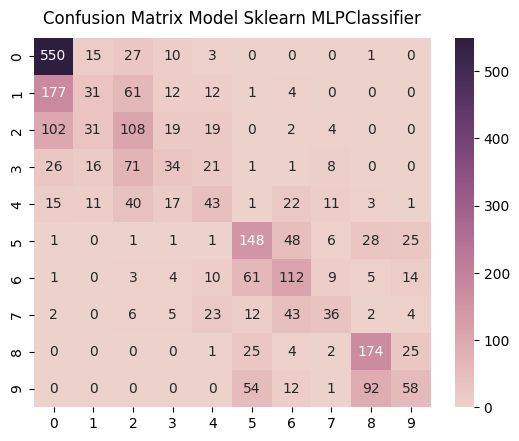

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


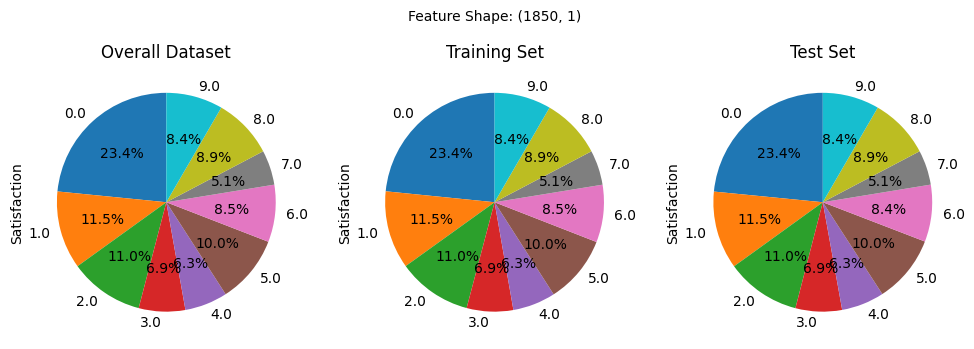

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


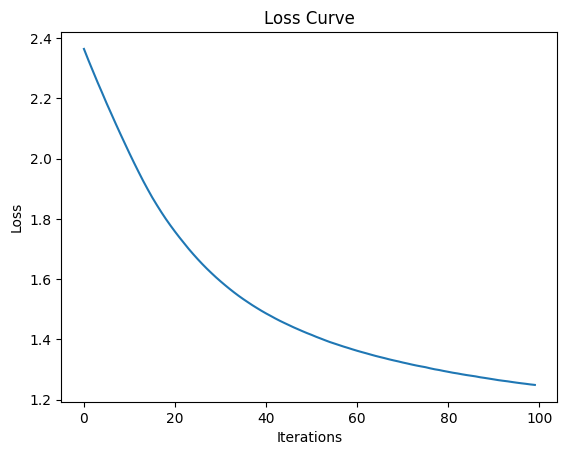

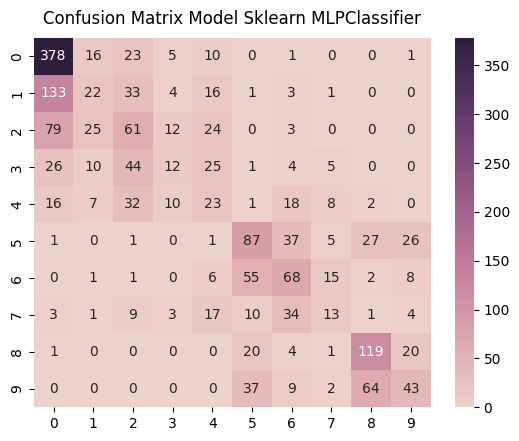

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


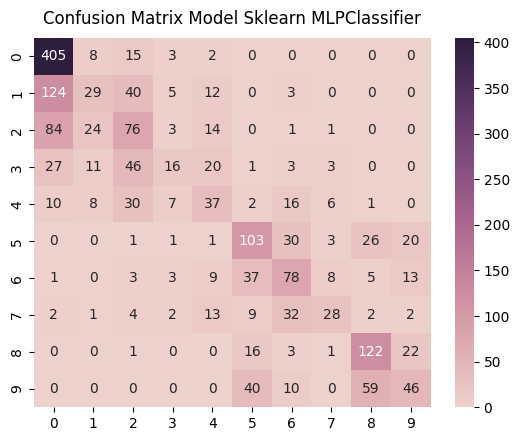

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [278]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 3 | 32/32 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


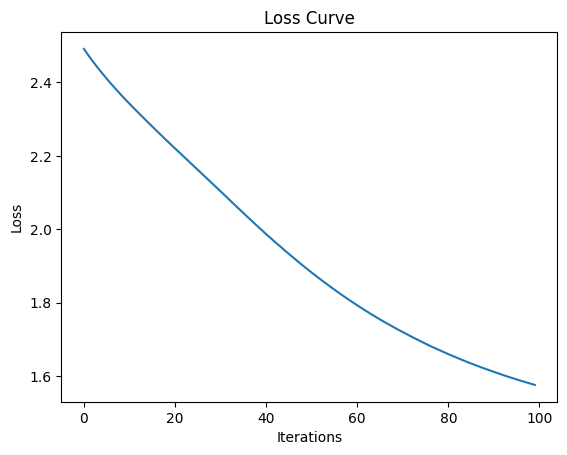

In [279]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [280]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

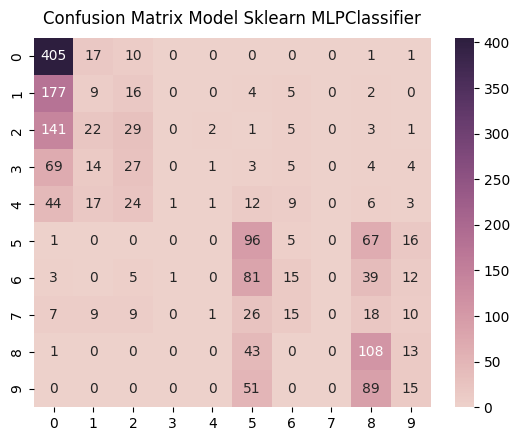

              precision    recall  f1-score      support
0.0            0.477594  0.933180  0.631825   434.000000
1.0            0.102273  0.042254  0.059801   213.000000
2.0            0.241667  0.142157  0.179012   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.200000  0.008547  0.016393   117.000000
5.0            0.302839  0.518919  0.382470   185.000000
6.0            0.254237  0.096154  0.139535   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.320475  0.654545  0.430279   165.000000
9.0            0.200000  0.096774  0.130435   155.000000
accuracy       0.366288  0.366288  0.366288     0.366288
macro avg      0.209908  0.249253  0.196975  1851.000000
weighted avg   0.260035  0.366288  0.275054  1851.000000
Mean Squared Error:  4.094543490005402


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [281]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

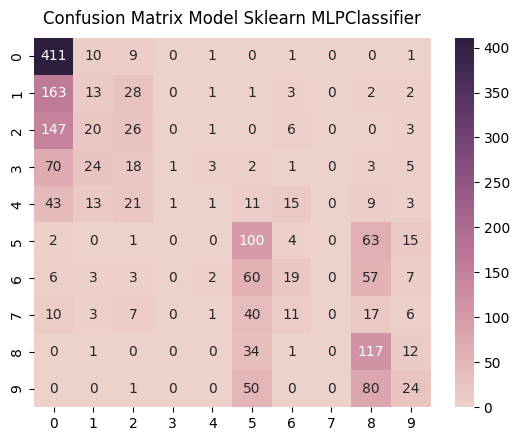

              precision    recall  f1-score      support
0.0            0.482394  0.949192  0.639689   433.000000
1.0            0.149425  0.061033  0.086667   213.000000
2.0            0.228070  0.128079  0.164038   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.100000  0.008547  0.015748   117.000000
5.0            0.335570  0.540541  0.414079   185.000000
6.0            0.311475  0.121019  0.174312   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.336207  0.709091  0.456140   165.000000
9.0            0.307692  0.154839  0.206009   155.000000
accuracy       0.384865  0.384865  0.384865     0.384865
macro avg      0.275083  0.268021  0.217218  1850.000000
weighted avg   0.311541  0.384865  0.293904  1850.000000
Mean Squared Error:  4.114594594594594


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [282]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

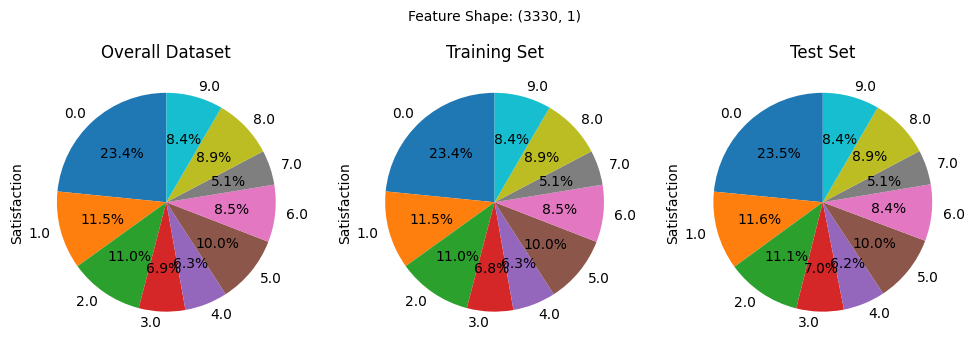

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


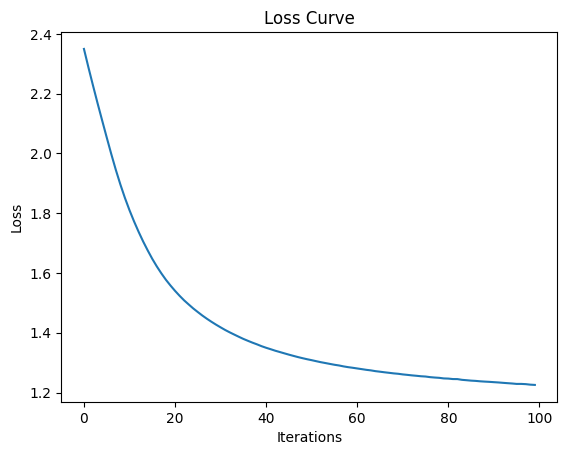

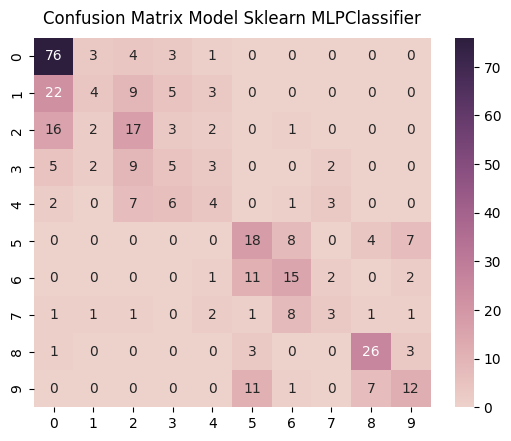

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


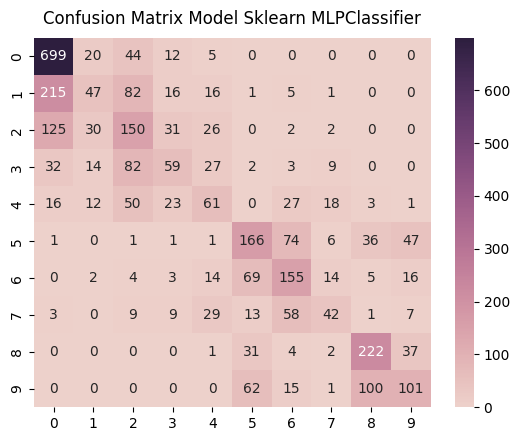

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


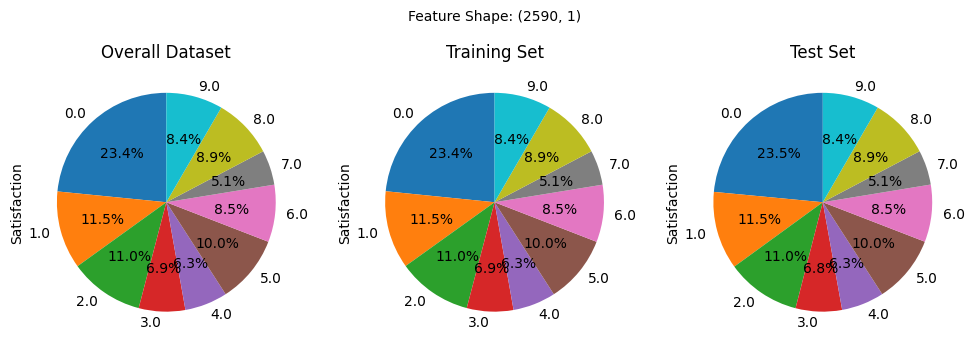

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


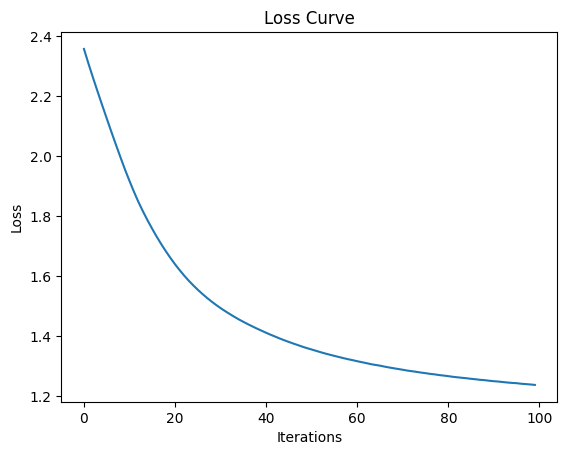

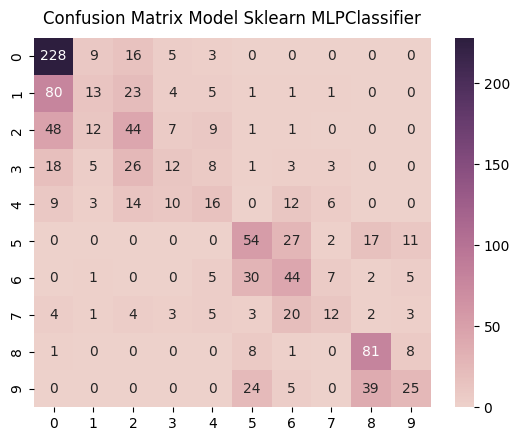

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


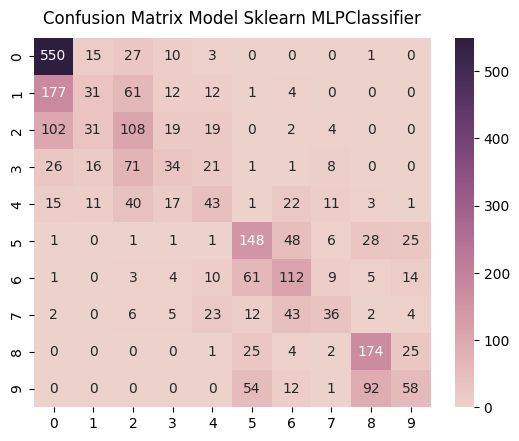

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


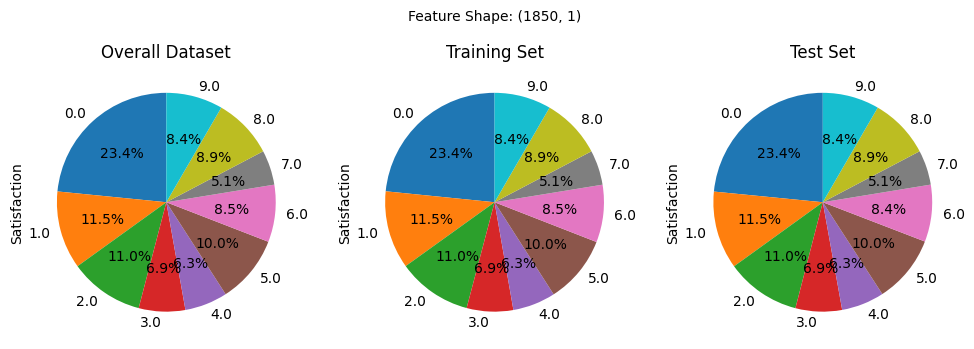

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


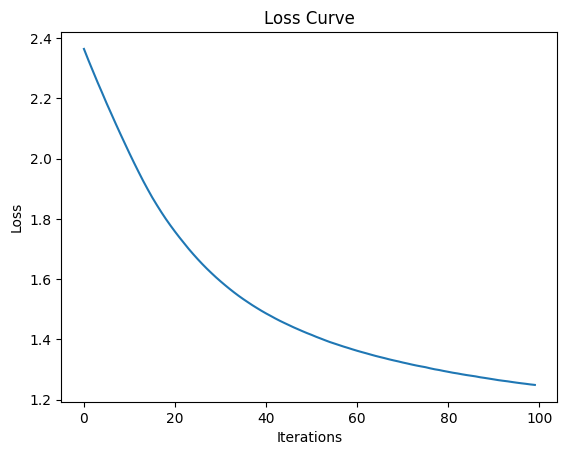

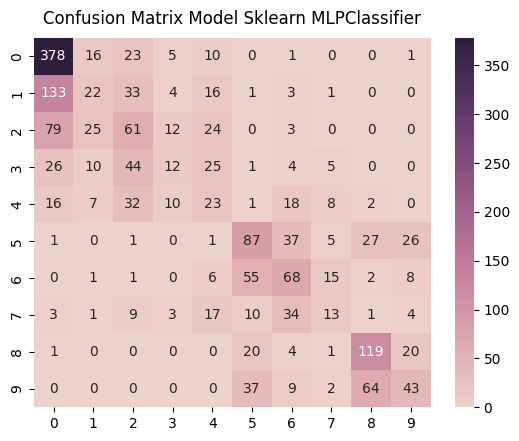

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


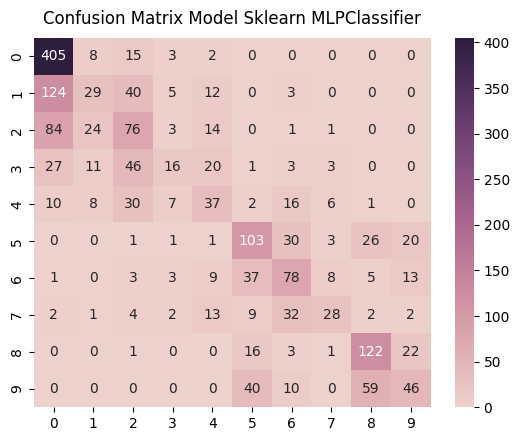

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [283]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 4 | 64/128 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


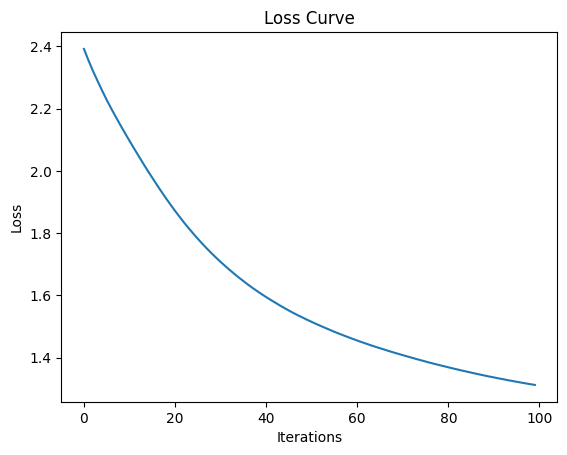

In [284]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [285]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

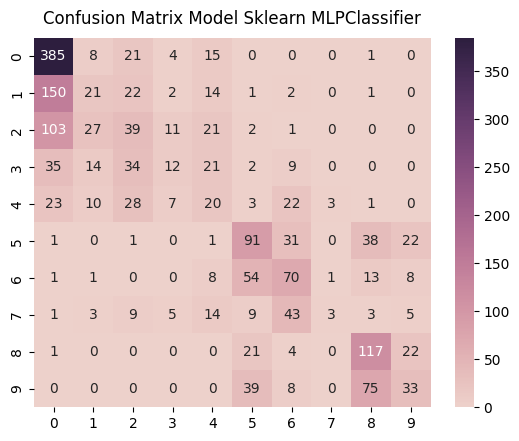

              precision    recall  f1-score      support
0.0            0.550000  0.887097  0.679012   434.000000
1.0            0.250000  0.098592  0.141414   213.000000
2.0            0.253247  0.191176  0.217877   204.000000
3.0            0.292683  0.094488  0.142857   127.000000
4.0            0.175439  0.170940  0.173160   117.000000
5.0            0.409910  0.491892  0.447174   185.000000
6.0            0.368421  0.448718  0.404624   156.000000
7.0            0.428571  0.031579  0.058824    95.000000
8.0            0.469880  0.709091  0.565217   165.000000
9.0            0.366667  0.212903  0.269388   155.000000
accuracy       0.427337  0.427337  0.427337     0.427337
macro avg      0.356482  0.333648  0.309955  1851.000000
weighted avg   0.383411  0.427337  0.374995  1851.000000
Mean Squared Error:  2.9340896812533765


In [286]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

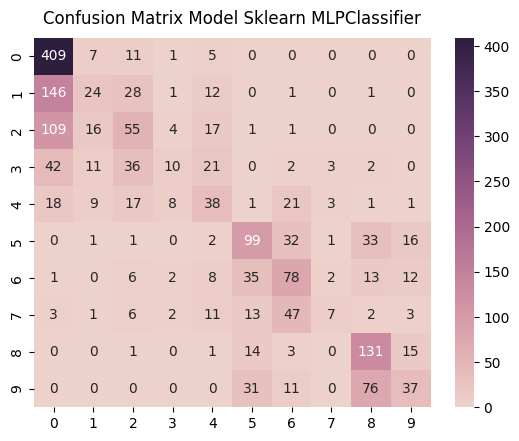

              precision    recall  f1-score  support
0.0            0.561813  0.944573  0.704565   433.00
1.0            0.347826  0.112676  0.170213   213.00
2.0            0.341615  0.270936  0.302198   203.00
3.0            0.357143  0.078740  0.129032   127.00
4.0            0.330435  0.324786  0.327586   117.00
5.0            0.510309  0.535135  0.522427   185.00
6.0            0.397959  0.496815  0.441926   157.00
7.0            0.437500  0.073684  0.126126    95.00
8.0            0.505792  0.793939  0.617925   165.00
9.0            0.440476  0.238710  0.309623   155.00
accuracy       0.480000  0.480000  0.480000     0.48
macro avg      0.423087  0.386999  0.365162  1850.00
weighted avg   0.443728  0.480000  0.424516  1850.00
Mean Squared Error:  2.535135135135135


In [287]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

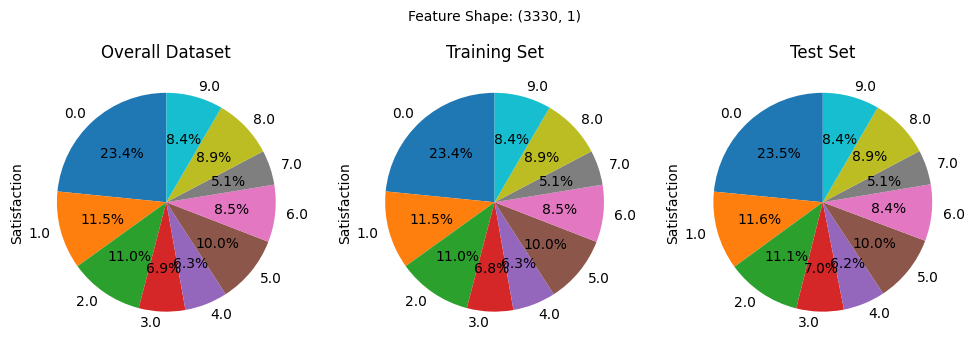

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


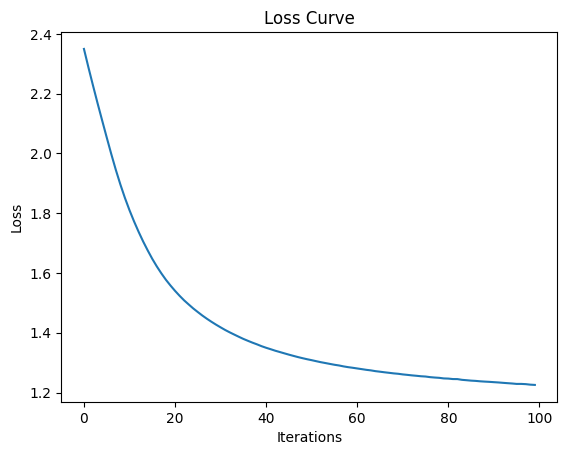

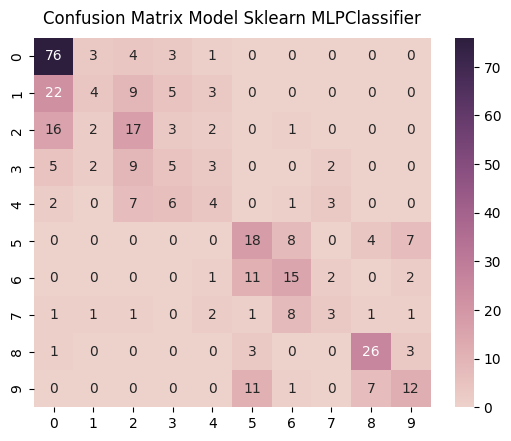

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


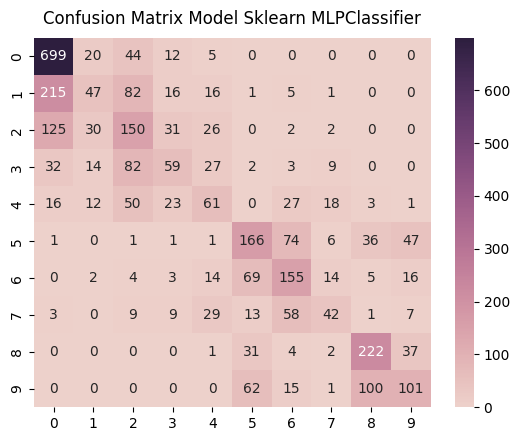

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


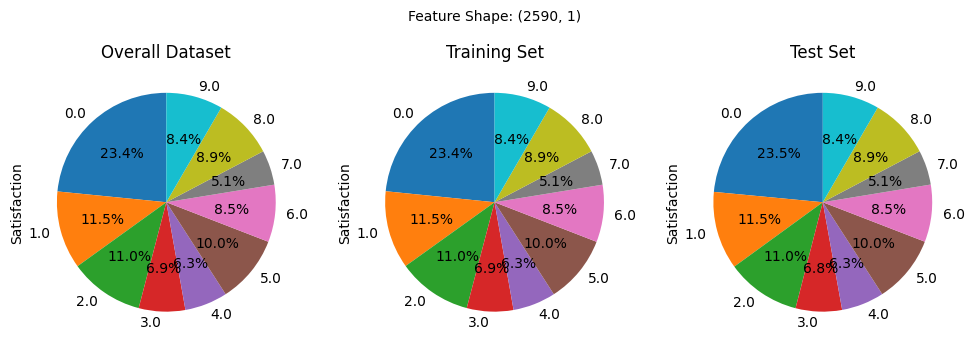

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


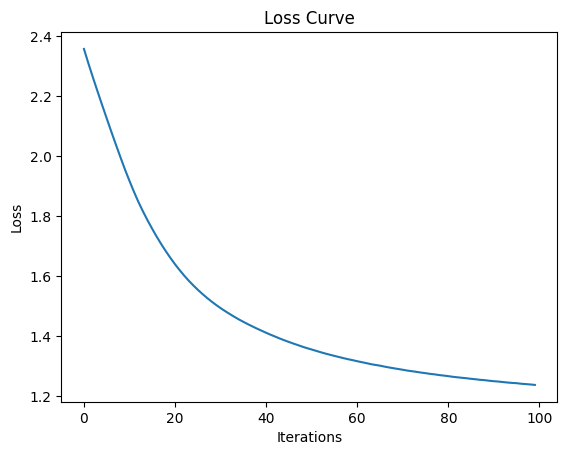

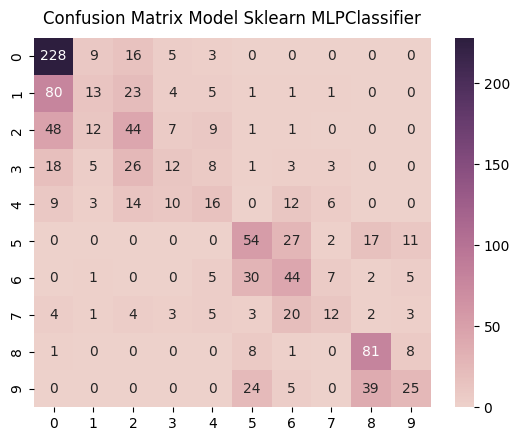

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


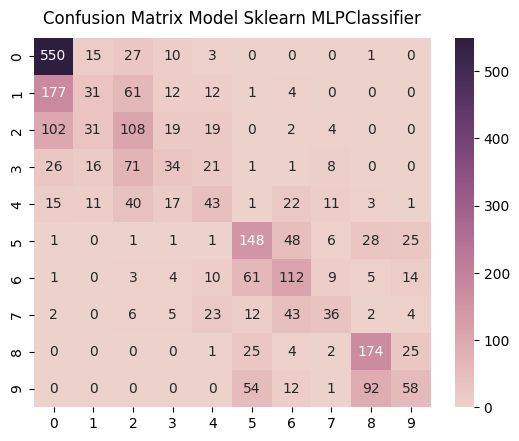

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


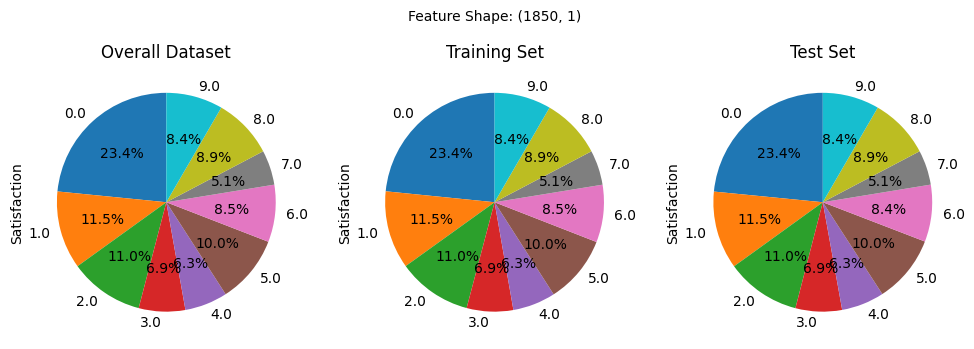

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


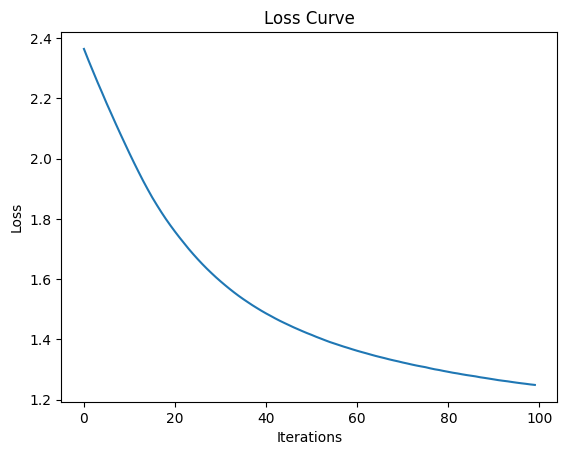

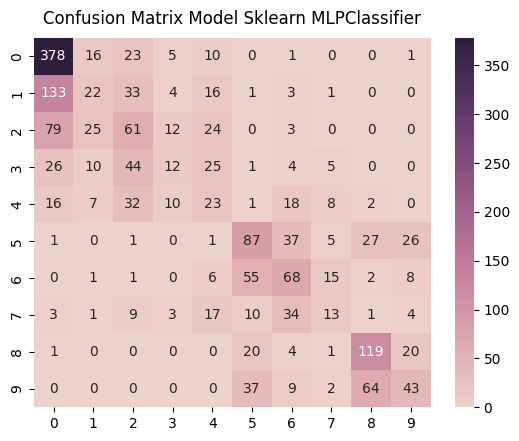

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


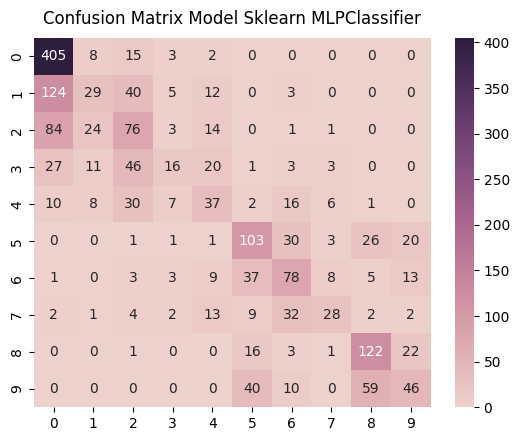

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [288]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 5 | 64/64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


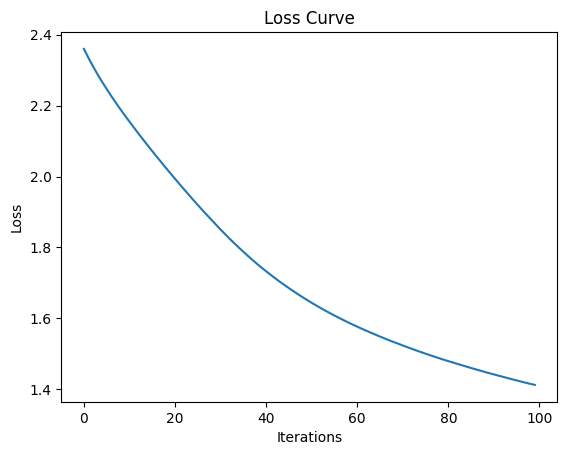

In [289]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [290]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

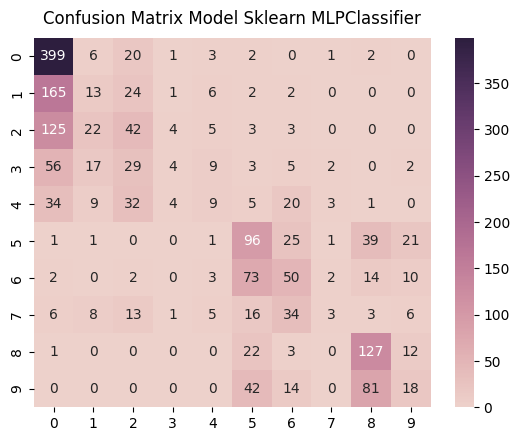

              precision    recall  f1-score      support
0.0            0.505703  0.919355  0.652494   434.000000
1.0            0.171053  0.061033  0.089965   213.000000
2.0            0.259259  0.205882  0.229508   204.000000
3.0            0.266667  0.031496  0.056338   127.000000
4.0            0.219512  0.076923  0.113924   117.000000
5.0            0.363636  0.518919  0.427617   185.000000
6.0            0.320513  0.320513  0.320513   156.000000
7.0            0.250000  0.031579  0.056075    95.000000
8.0            0.475655  0.769697  0.587963   165.000000
9.0            0.260870  0.116129  0.160714   155.000000
accuracy       0.411129  0.411129  0.411129     0.411129
macro avg      0.309287  0.305153  0.269511  1851.000000
weighted avg   0.339432  0.411129  0.338201  1851.000000
Mean Squared Error:  3.4192328471096705


In [291]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

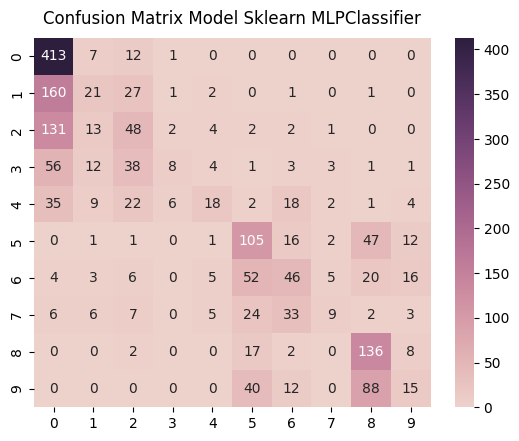

              precision    recall  f1-score      support
0.0            0.513043  0.953811  0.667205   433.000000
1.0            0.291667  0.098592  0.147368   213.000000
2.0            0.294479  0.236453  0.262295   203.000000
3.0            0.444444  0.062992  0.110345   127.000000
4.0            0.461538  0.153846  0.230769   117.000000
5.0            0.432099  0.567568  0.490654   185.000000
6.0            0.345865  0.292994  0.317241   157.000000
7.0            0.409091  0.094737  0.153846    95.000000
8.0            0.459459  0.824242  0.590022   165.000000
9.0            0.254237  0.096774  0.140187   155.000000
accuracy       0.442703  0.442703  0.442703     0.442703
macro avg      0.390592  0.338201  0.310993  1850.000000
weighted avg   0.401523  0.442703  0.372338  1850.000000
Mean Squared Error:  3.1810810810810812


In [292]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

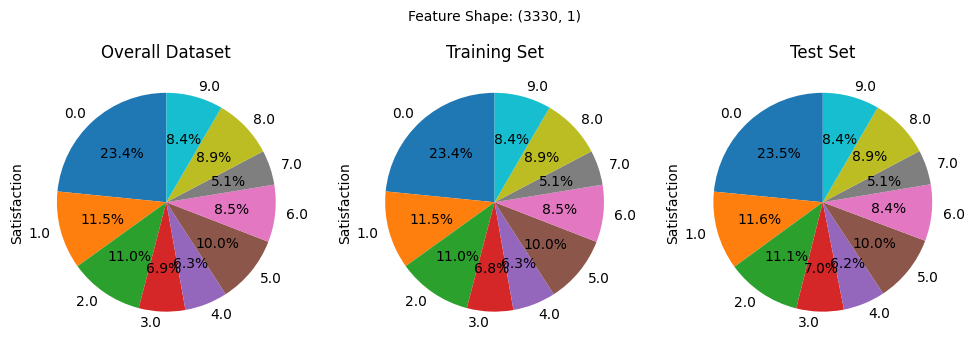

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


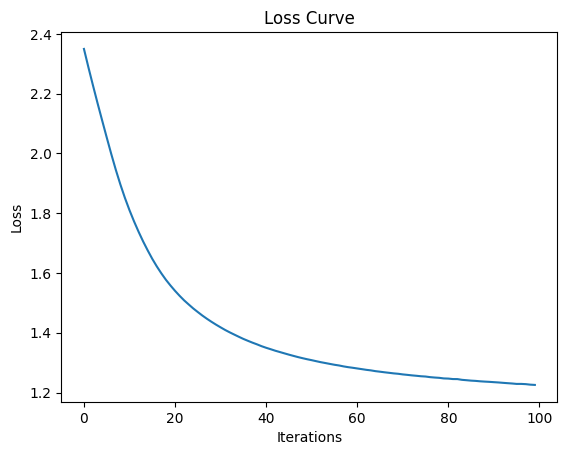

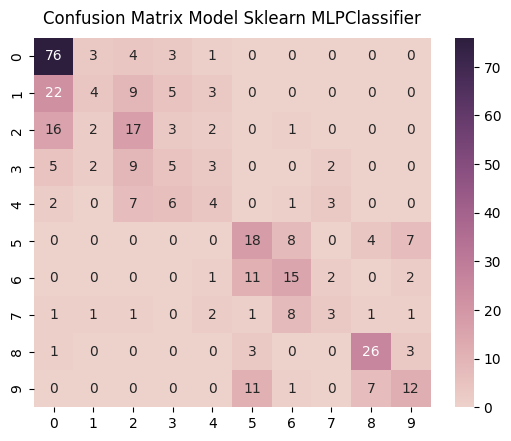

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


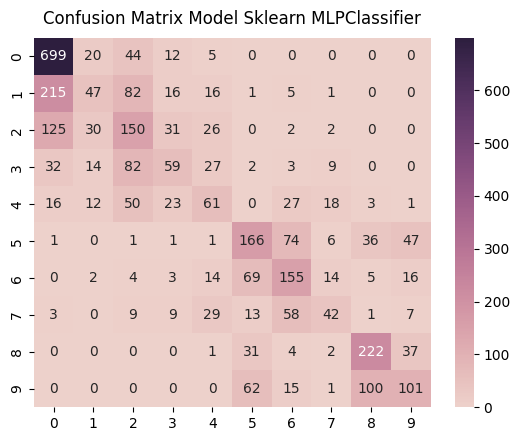

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


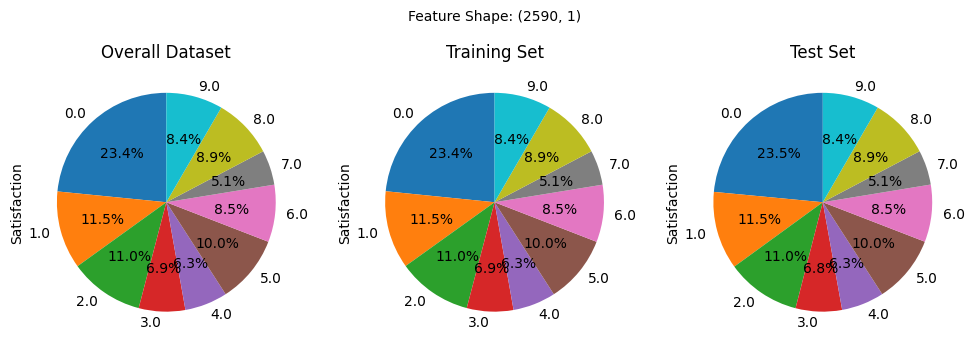

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


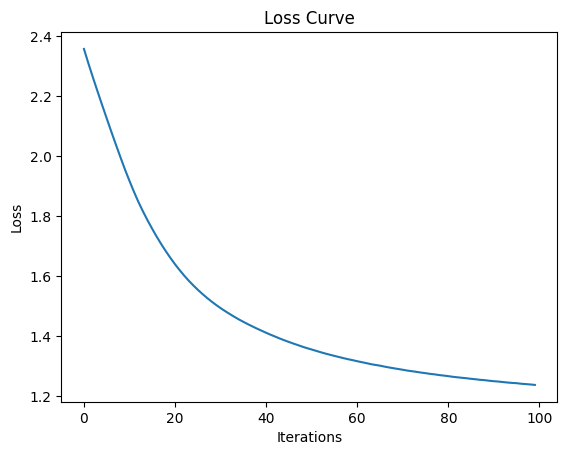

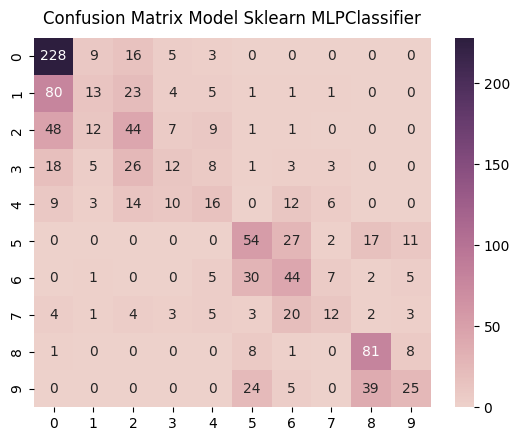

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


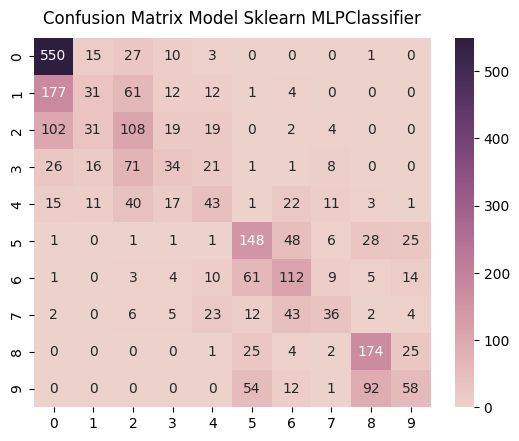

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


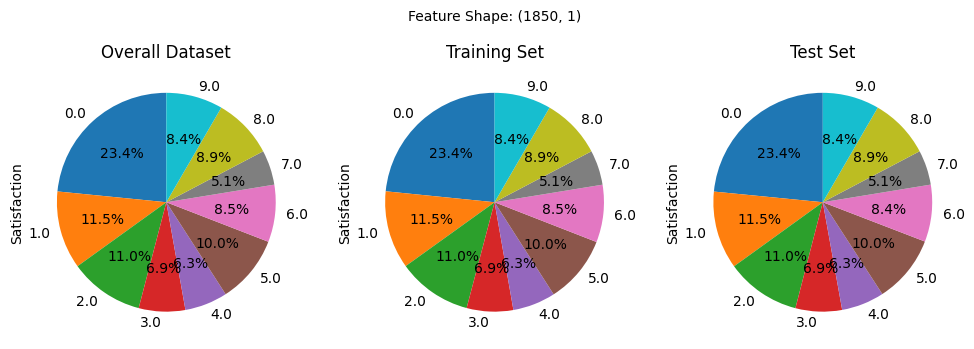

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


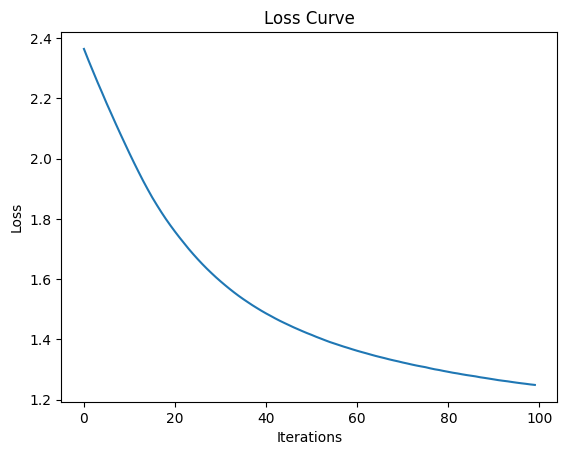

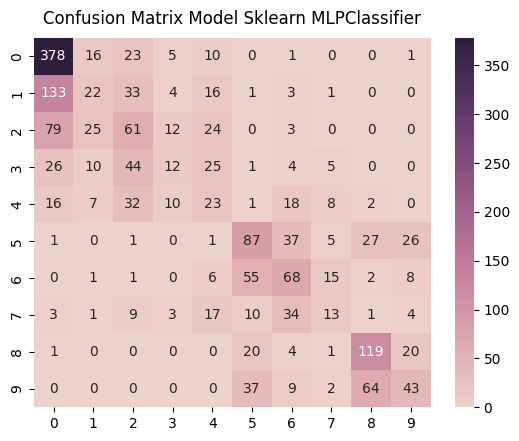

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


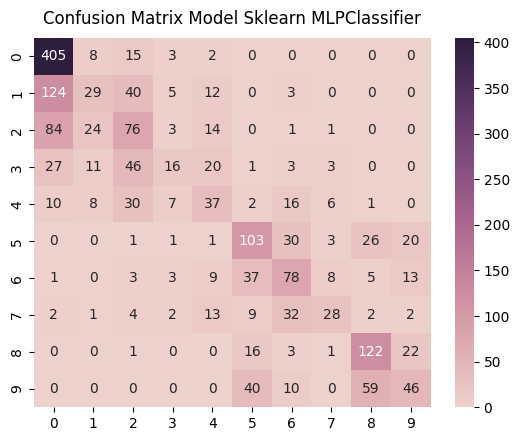

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [293]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 6 | 128/128 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


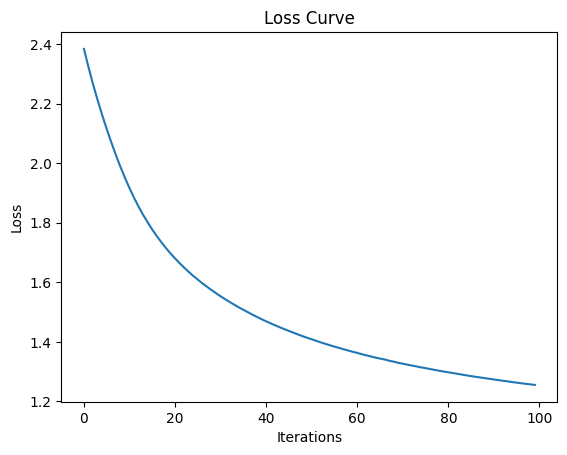

In [294]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128,128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [295]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

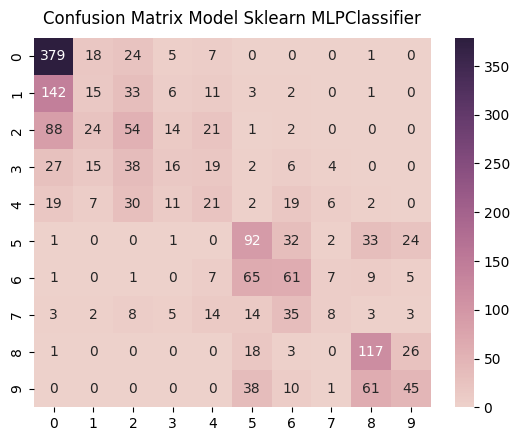

              precision    recall  f1-score      support
0.0            0.573374  0.873272  0.692237   434.000000
1.0            0.185185  0.070423  0.102041   213.000000
2.0            0.287234  0.264706  0.275510   204.000000
3.0            0.275862  0.125984  0.172973   127.000000
4.0            0.210000  0.179487  0.193548   117.000000
5.0            0.391489  0.497297  0.438095   185.000000
6.0            0.358824  0.391026  0.374233   156.000000
7.0            0.285714  0.084211  0.130081    95.000000
8.0            0.515419  0.709091  0.596939   165.000000
9.0            0.436893  0.290323  0.348837   155.000000
accuracy       0.436521  0.436521  0.436521     0.436521
macro avg      0.351999  0.348582  0.332450  1851.000000
weighted avg   0.386168  0.436521  0.392941  1851.000000
Mean Squared Error:  2.80064829821718


In [296]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

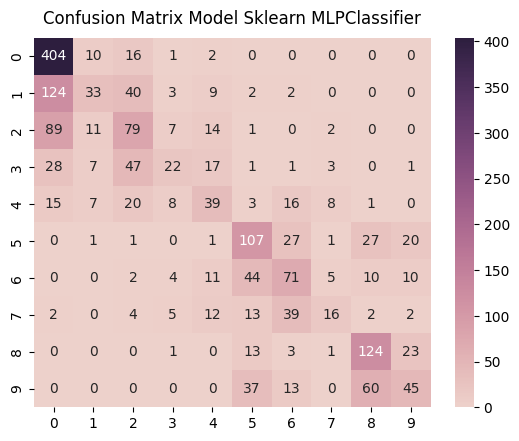

              precision    recall  f1-score      support
0.0            0.610272  0.933025  0.737900   433.000000
1.0            0.478261  0.154930  0.234043   213.000000
2.0            0.377990  0.389163  0.383495   203.000000
3.0            0.431373  0.173228  0.247191   127.000000
4.0            0.371429  0.333333  0.351351   117.000000
5.0            0.484163  0.578378  0.527094   185.000000
6.0            0.412791  0.452229  0.431611   157.000000
7.0            0.444444  0.168421  0.244275    95.000000
8.0            0.553571  0.751515  0.637532   165.000000
9.0            0.445545  0.290323  0.351563   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.460984  0.422455  0.414605  1850.000000
weighted avg   0.485454  0.508108  0.469124  1850.000000
Mean Squared Error:  2.310810810810811


In [297]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

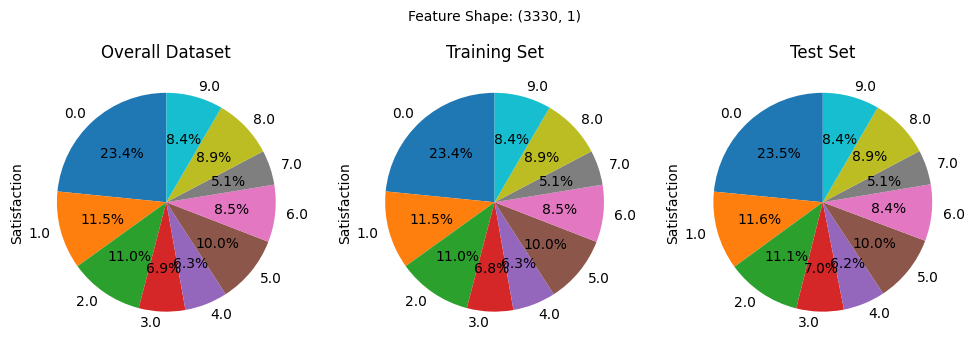

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


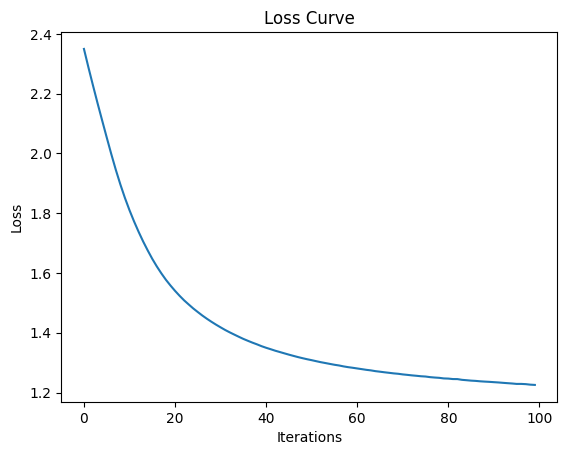

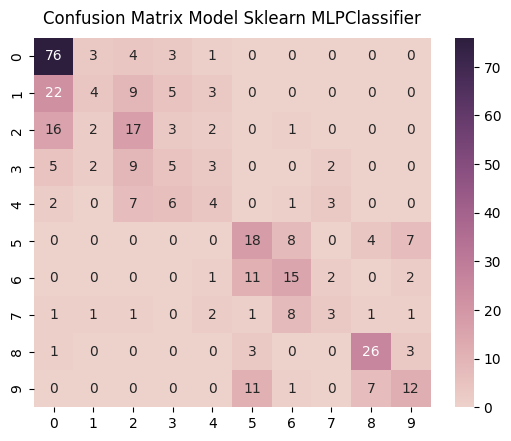

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


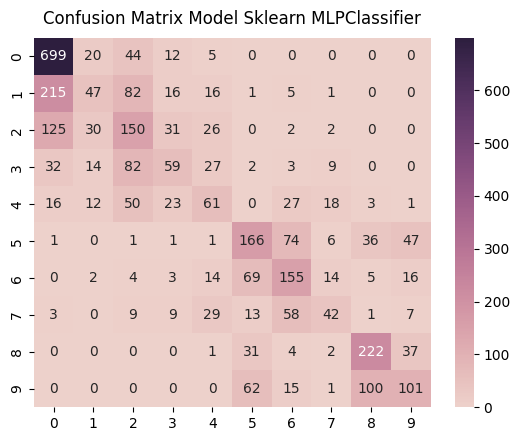

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


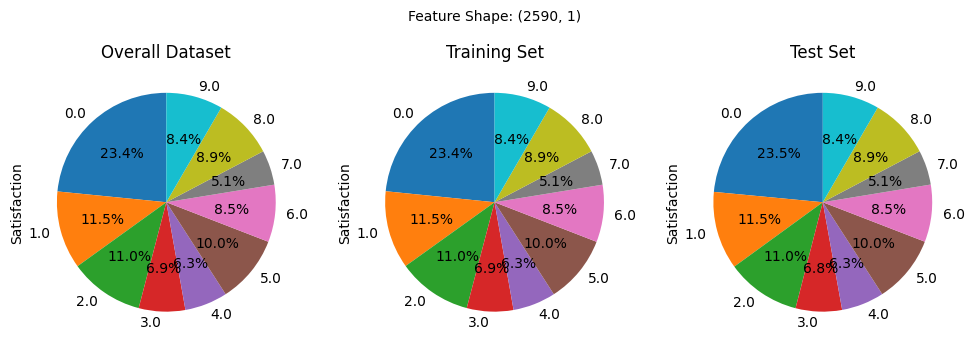

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


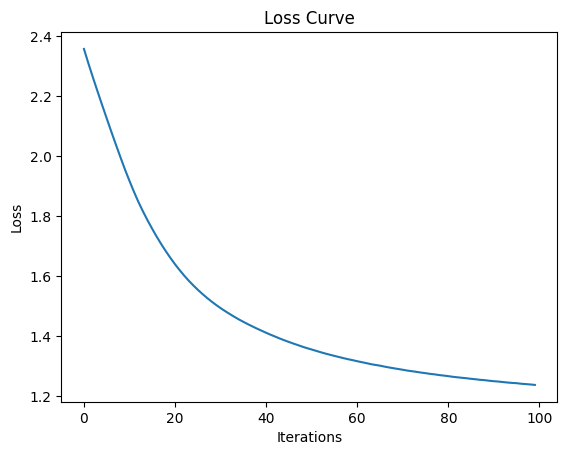

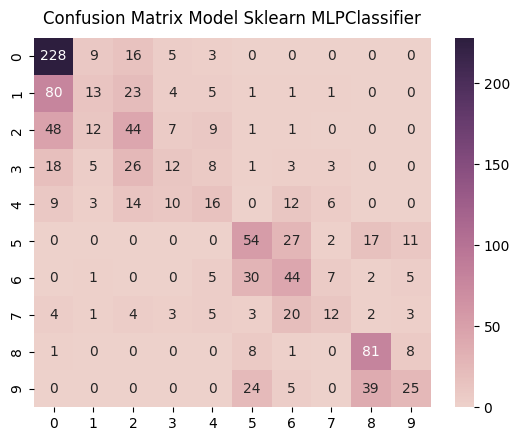

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


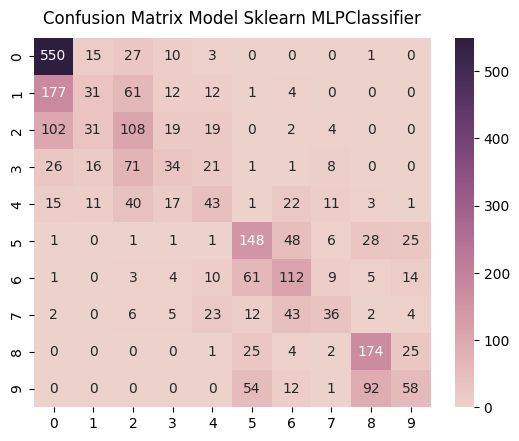

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


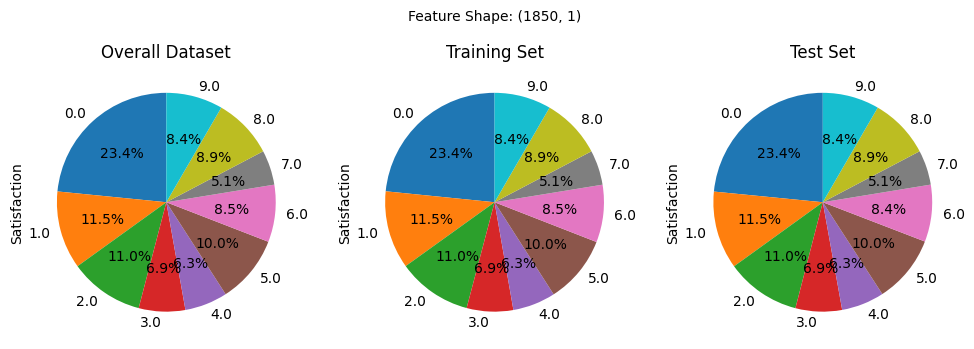

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


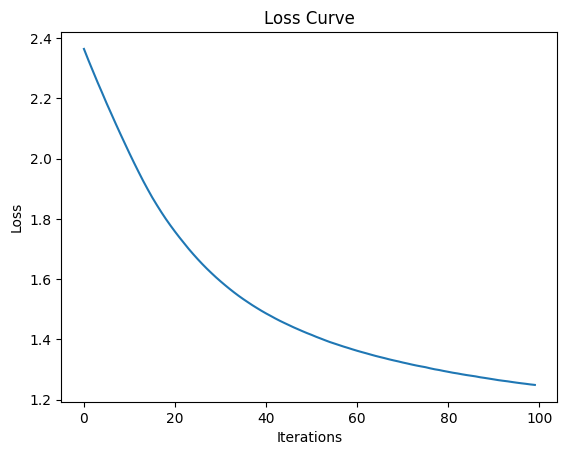

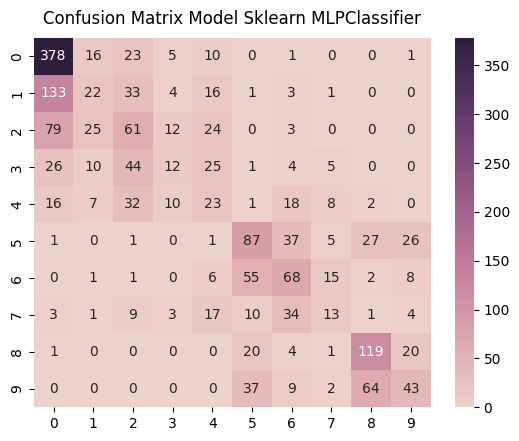

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


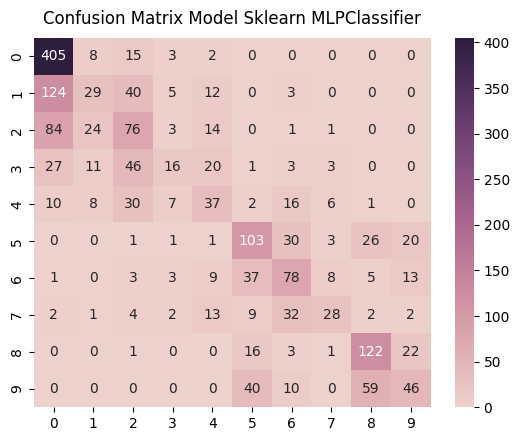

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [298]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## Three Hidden Layer

we picked 10 combination of random number

### 8/16/32


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


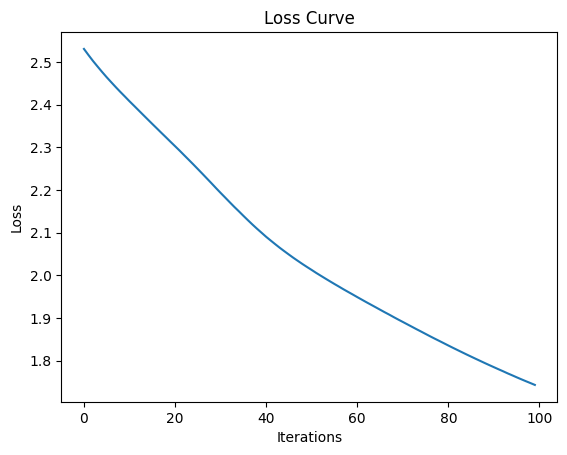

In [299]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8, 16, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [300]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

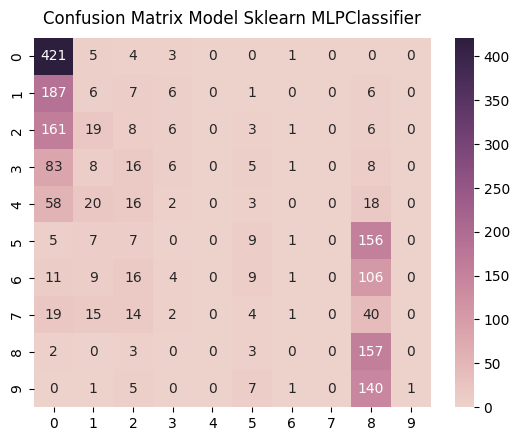

              precision    recall  f1-score      support
0.0            0.444562  0.970046  0.609703   434.000000
1.0            0.066667  0.028169  0.039604   213.000000
2.0            0.083333  0.039216  0.053333   204.000000
3.0            0.206897  0.047244  0.076923   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.204545  0.048649  0.078603   185.000000
6.0            0.142857  0.006410  0.012270   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.246468  0.951515  0.391521   165.000000
9.0            1.000000  0.006452  0.012821   155.000000
accuracy       0.329011  0.329011  0.329011     0.329011
macro avg      0.239533  0.209770  0.127478  1851.000000
weighted avg   0.273479  0.329011  0.203533  1851.000000
Mean Squared Error:  5.306861156131821


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [301]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

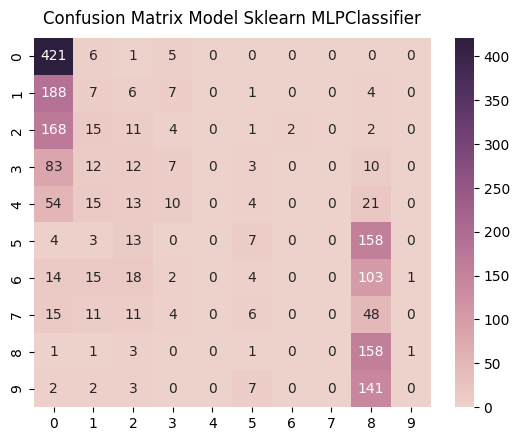

              precision    recall  f1-score     support
0.0            0.443158  0.972286  0.608821   433.00000
1.0            0.080460  0.032864  0.046667   213.00000
2.0            0.120879  0.054187  0.074830   203.00000
3.0            0.179487  0.055118  0.084337   127.00000
4.0            0.000000  0.000000  0.000000   117.00000
5.0            0.205882  0.037838  0.063927   185.00000
6.0            0.000000  0.000000  0.000000   157.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.244961  0.957576  0.390123   165.00000
9.0            0.000000  0.000000  0.000000   155.00000
accuracy       0.330270  0.330270  0.330270     0.33027
macro avg      0.127483  0.210987  0.126871  1850.00000
weighted avg   0.181008  0.330270  0.203058  1850.00000
Mean Squared Error:  5.147567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [302]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

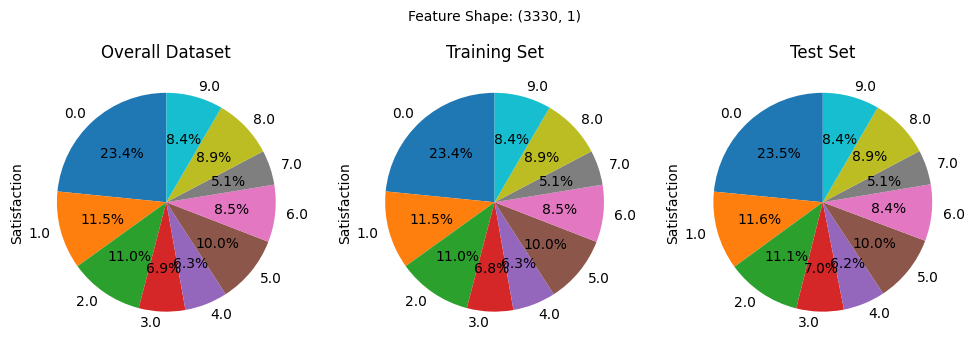

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


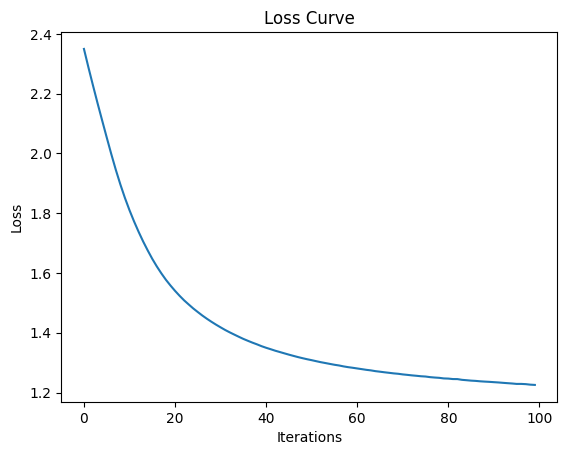

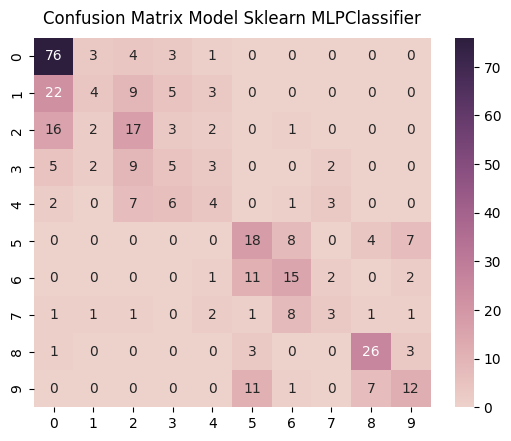

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


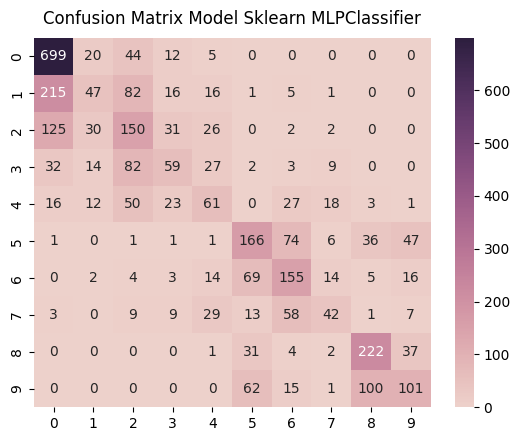

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


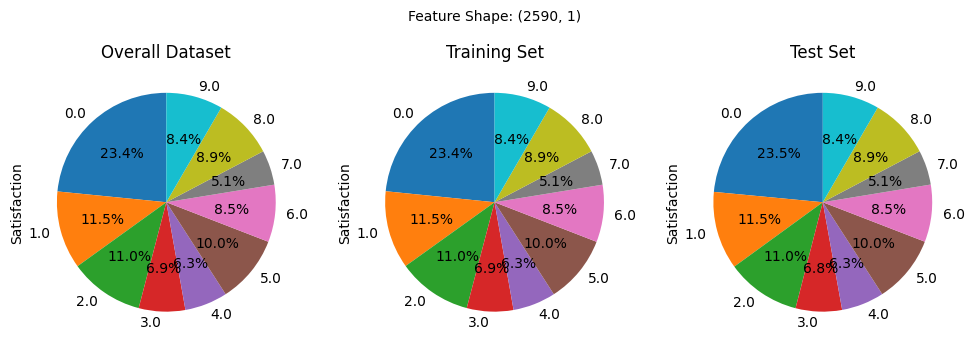

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


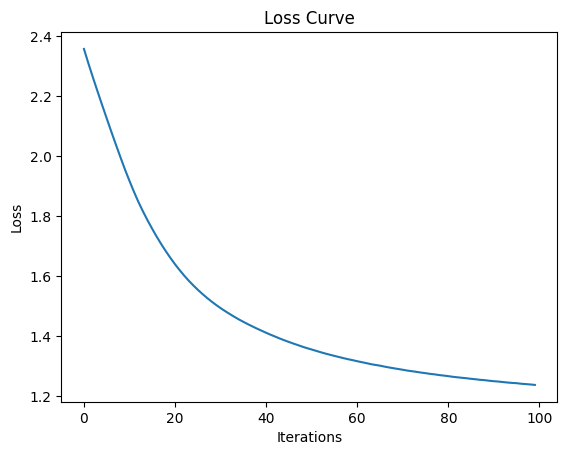

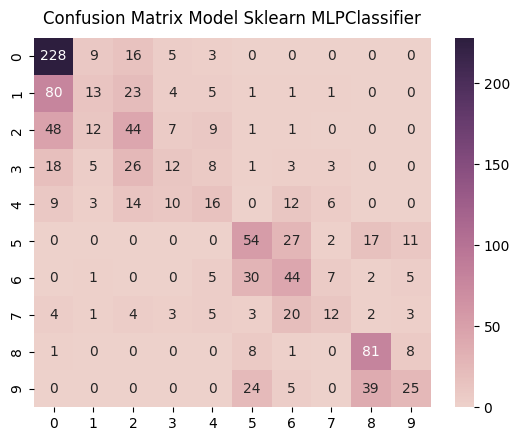

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


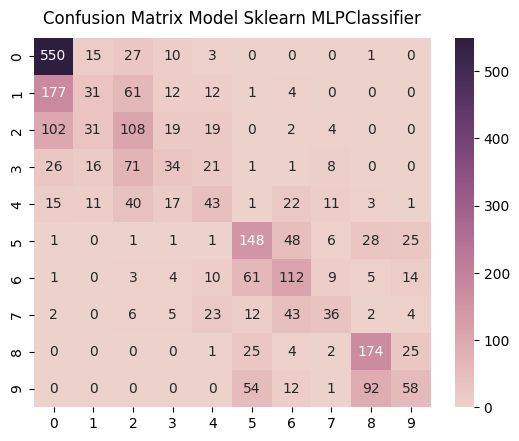

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


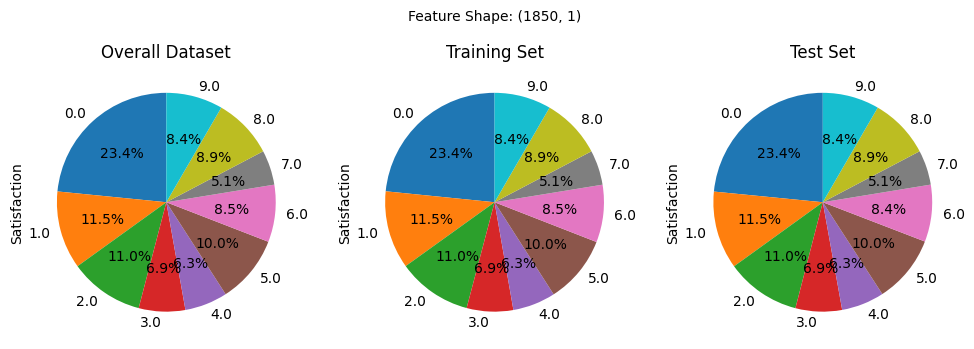

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


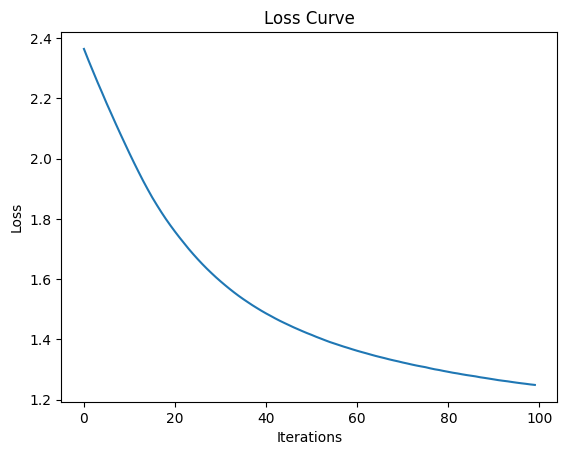

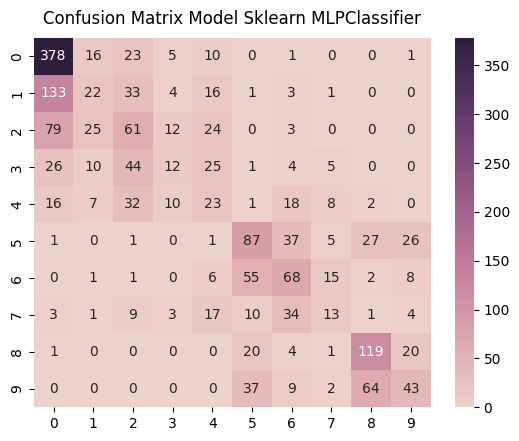

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


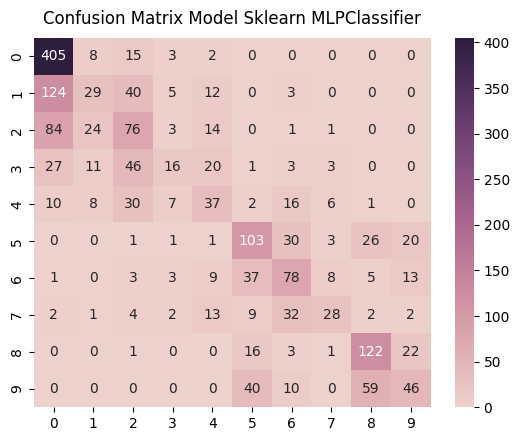

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [303]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 32/16/8


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


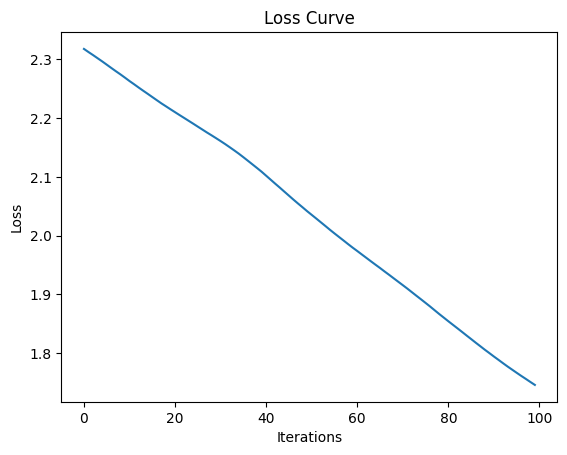

In [304]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [305]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

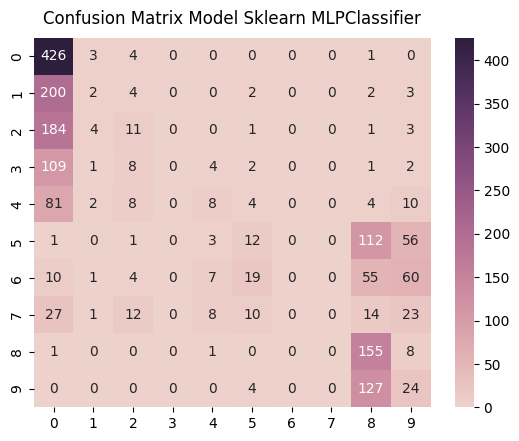

              precision    recall  f1-score      support
0.0            0.410010  0.981567  0.578411   434.000000
1.0            0.142857  0.009390  0.017621   213.000000
2.0            0.211538  0.053922  0.085938   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.258065  0.068376  0.108108   117.000000
5.0            0.222222  0.064865  0.100418   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.328390  0.939394  0.486656   165.000000
9.0            0.126984  0.154839  0.139535   155.000000
accuracy       0.344679  0.344679  0.344679     0.344679
macro avg      0.170007  0.227235  0.151669  1851.000000
weighted avg   0.214316  0.344679  0.219053  1851.000000
Mean Squared Error:  5.218800648298217


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [306]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

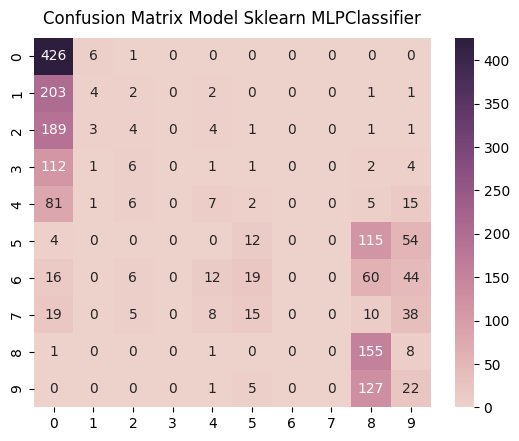

              precision    recall  f1-score      support
0.0            0.405328  0.983834  0.574124   433.000000
1.0            0.266667  0.018779  0.035088   213.000000
2.0            0.133333  0.019704  0.034335   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.194444  0.059829  0.091503   117.000000
5.0            0.218182  0.064865  0.100000   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.325630  0.939394  0.483619   165.000000
9.0            0.117647  0.141935  0.128655   155.000000
accuracy       0.340541  0.340541  0.340541     0.340541
macro avg      0.166123  0.222834  0.144732  1850.000000
weighted avg   0.213217  0.340541  0.211883  1850.000000
Mean Squared Error:  5.006486486486486


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [307]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

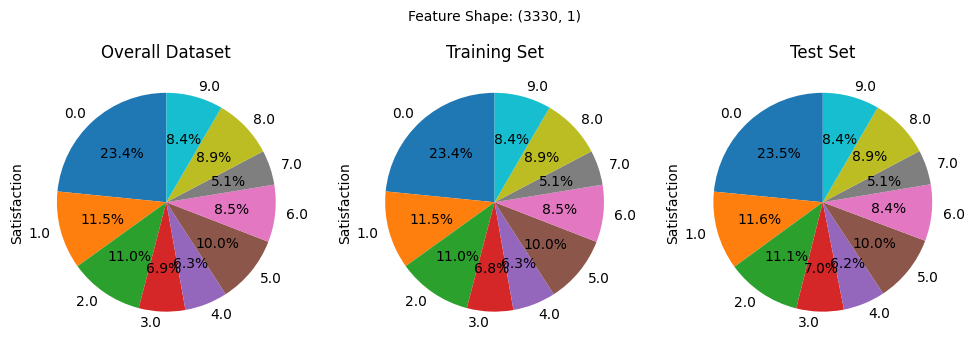

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


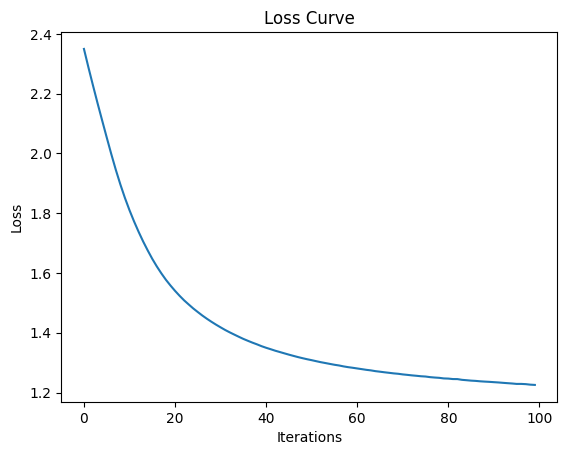

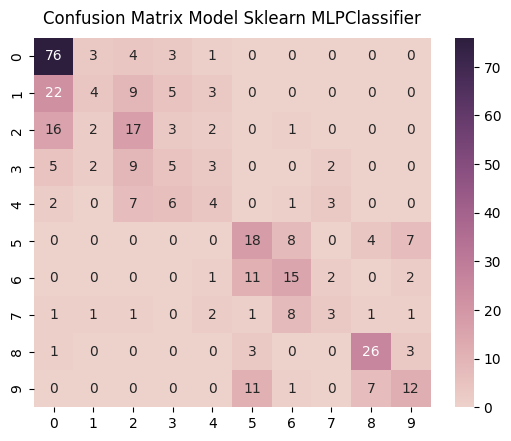

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


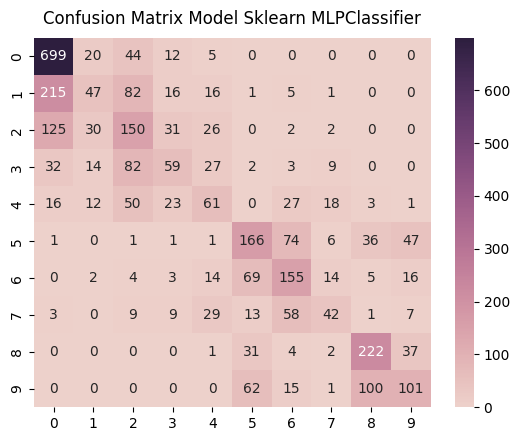

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


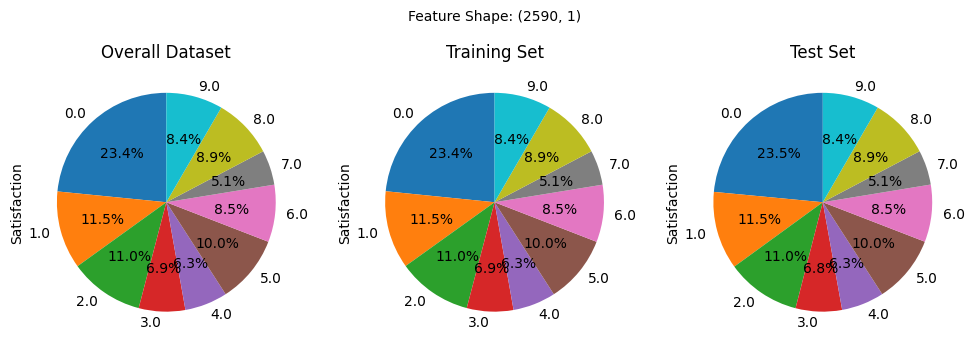

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


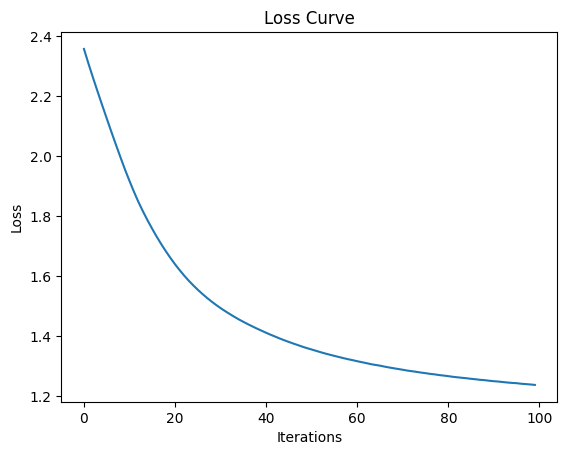

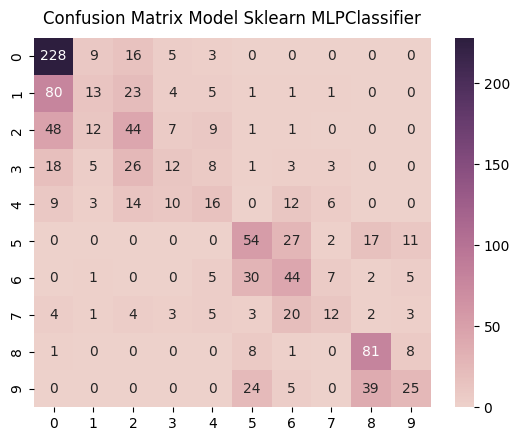

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


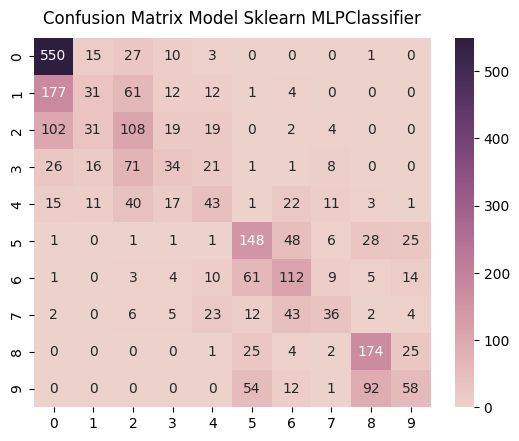

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


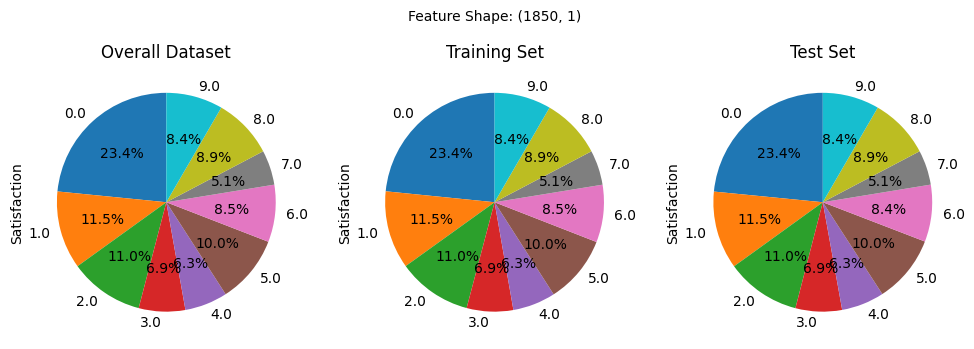

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


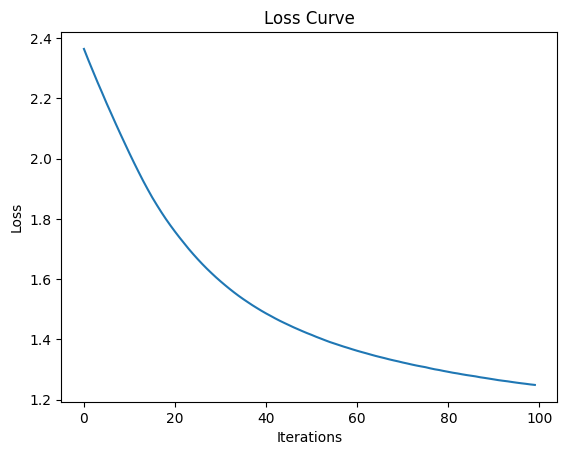

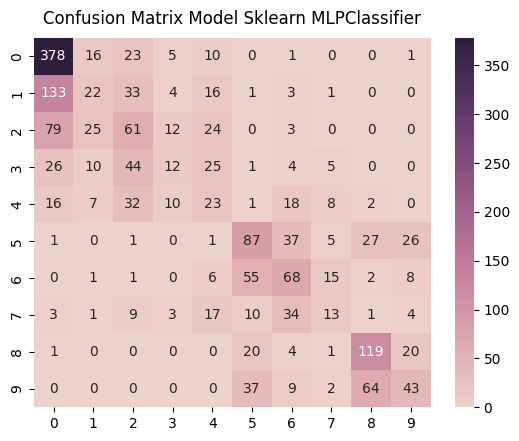

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


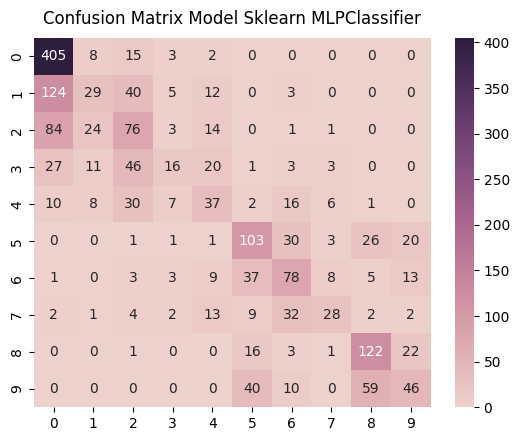

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [308]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 16/32/64


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


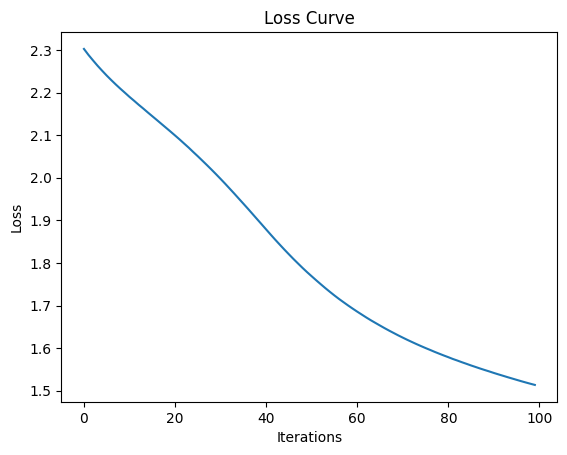

In [309]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16, 32, 64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [310]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

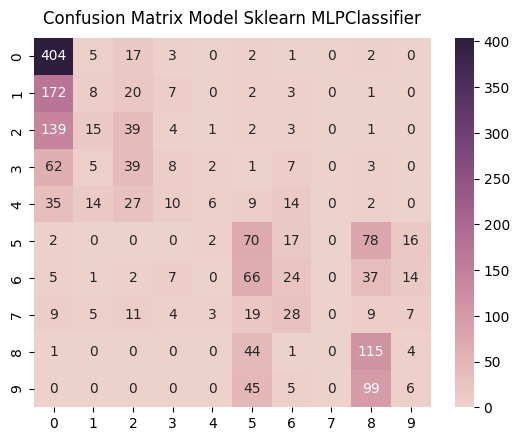

              precision    recall  f1-score      support
0.0            0.487334  0.930876  0.639747   434.000000
1.0            0.150943  0.037559  0.060150   213.000000
2.0            0.251613  0.191176  0.217270   204.000000
3.0            0.186047  0.062992  0.094118   127.000000
4.0            0.428571  0.051282  0.091603   117.000000
5.0            0.269231  0.378378  0.314607   185.000000
6.0            0.233010  0.153846  0.185328   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.331412  0.696970  0.449219   165.000000
9.0            0.127660  0.038710  0.059406   155.000000
accuracy       0.367369  0.367369  0.367369     0.367369
macro avg      0.246582  0.254179  0.211145  1851.000000
weighted avg   0.285997  0.367369  0.285196  1851.000000
Mean Squared Error:  3.868179362506753


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [311]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

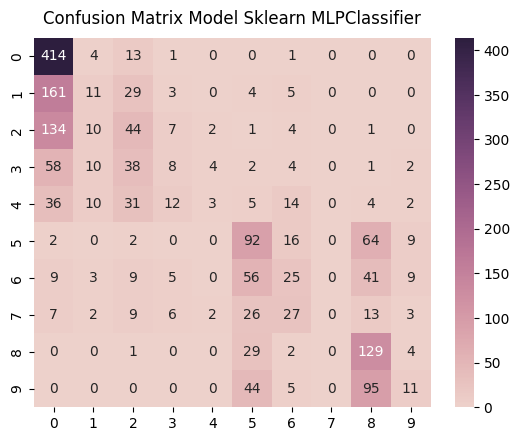

              precision    recall  f1-score      support
0.0            0.504263  0.956120  0.660287   433.000000
1.0            0.220000  0.051643  0.083650   213.000000
2.0            0.250000  0.216749  0.232190   203.000000
3.0            0.190476  0.062992  0.094675   127.000000
4.0            0.272727  0.025641  0.046875   117.000000
5.0            0.355212  0.497297  0.414414   185.000000
6.0            0.242718  0.159236  0.192308   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.370690  0.781818  0.502924   165.000000
9.0            0.275000  0.070968  0.112821   155.000000
accuracy       0.398378  0.398378  0.398378     0.398378
macro avg      0.268109  0.282246  0.234014  1850.000000
weighted avg   0.313333  0.398378  0.311185  1850.000000
Mean Squared Error:  3.5891891891891894


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [312]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

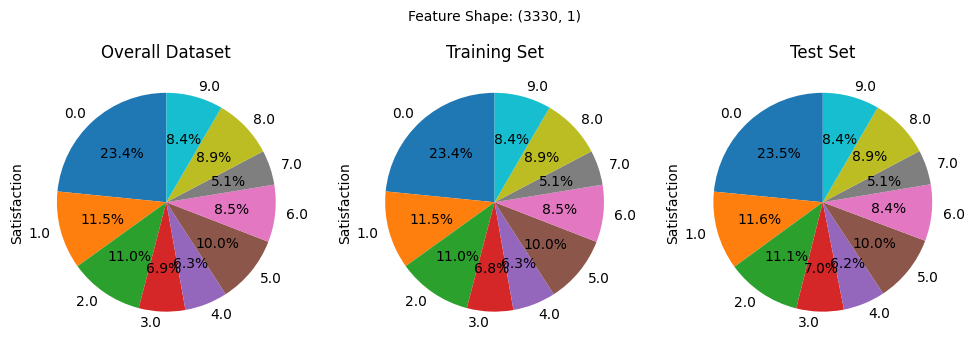

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


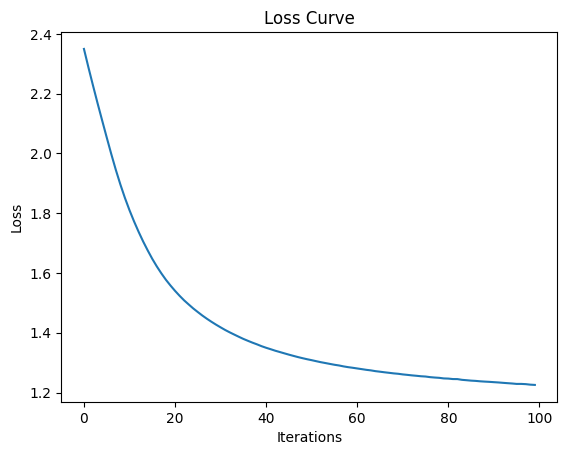

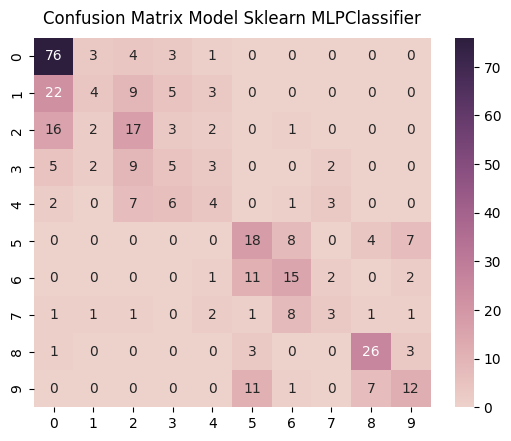

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


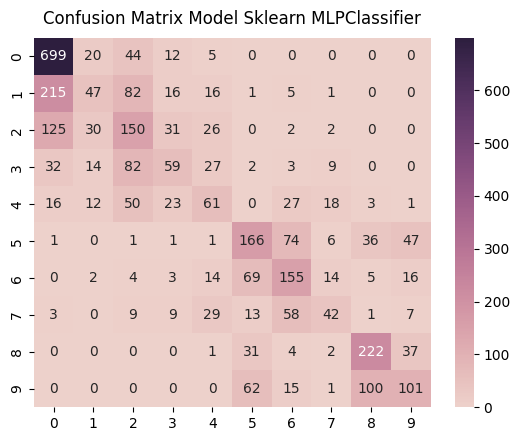

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


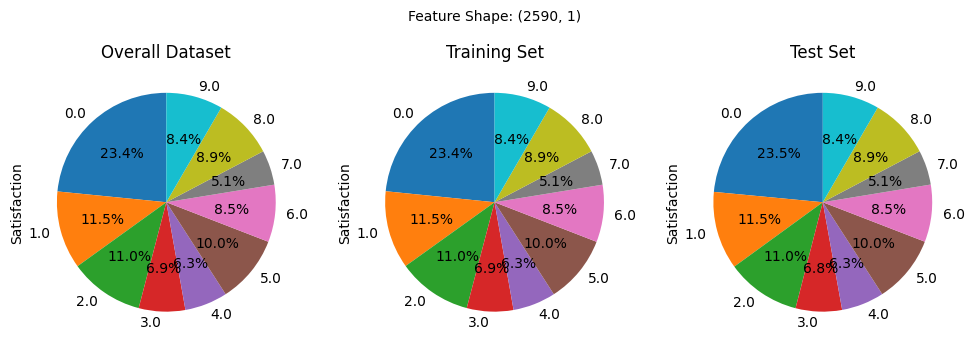

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


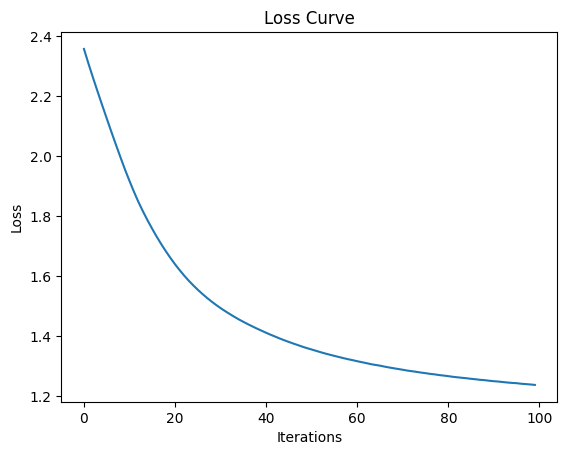

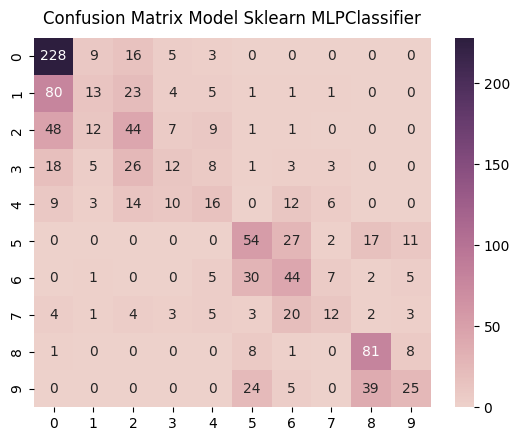

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


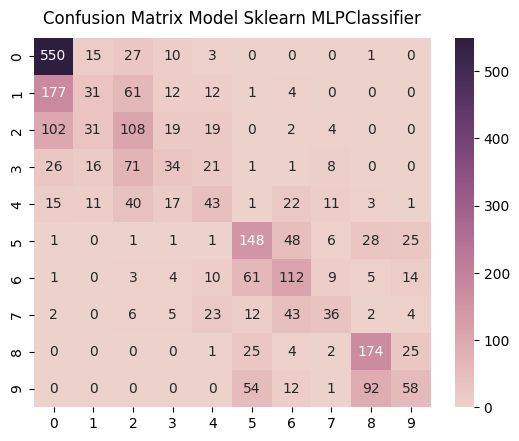

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


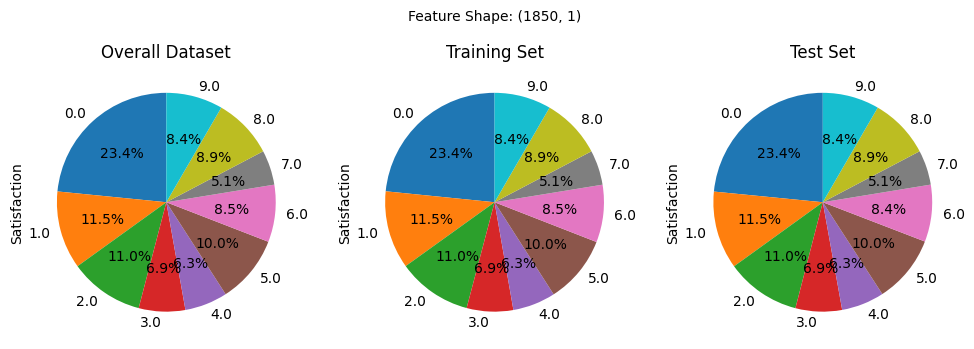

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


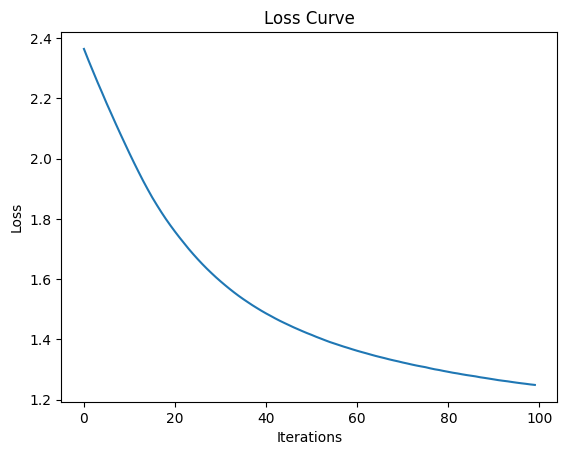

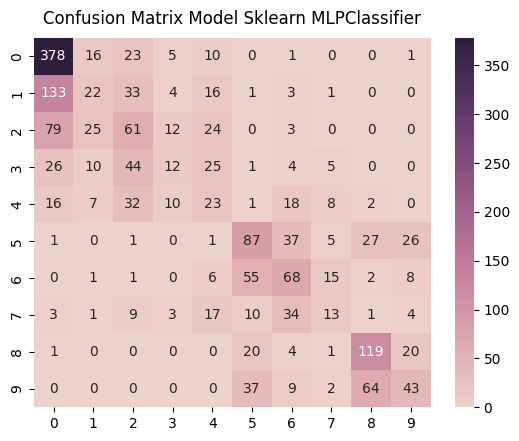

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


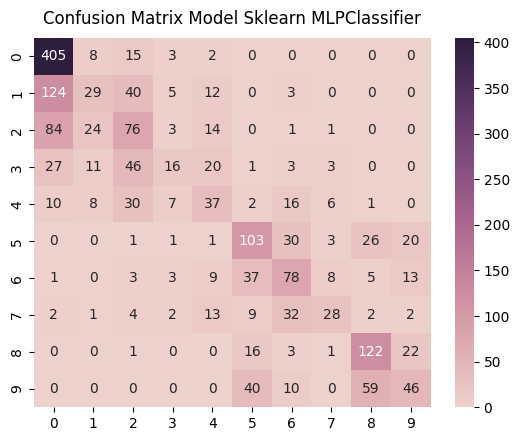

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [313]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 64/32/16


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


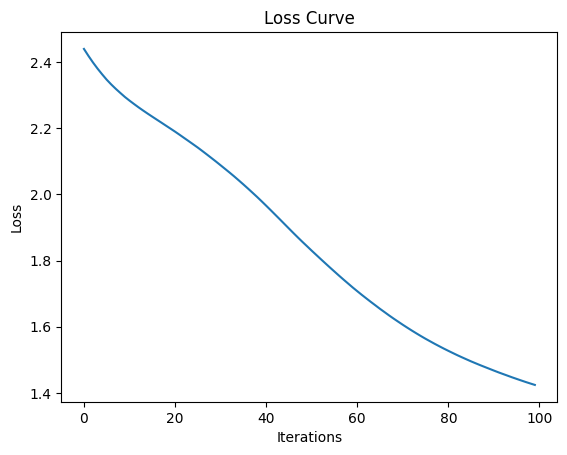

In [314]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [315]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

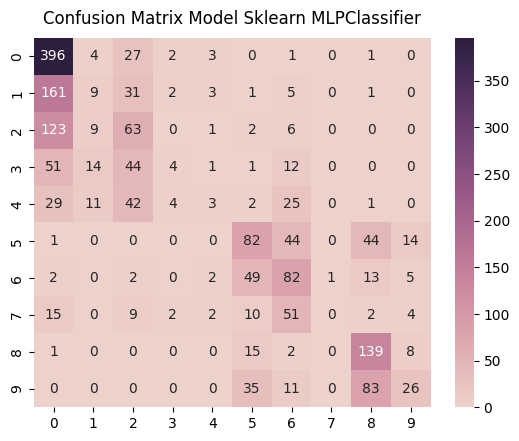

              precision    recall  f1-score     support
0.0            0.508344  0.912442  0.652927   434.00000
1.0            0.191489  0.042254  0.069231   213.00000
2.0            0.288991  0.308824  0.298578   204.00000
3.0            0.285714  0.031496  0.056738   127.00000
4.0            0.200000  0.025641  0.045455   117.00000
5.0            0.416244  0.443243  0.429319   185.00000
6.0            0.343096  0.525641  0.415190   156.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.489437  0.842424  0.619154   165.00000
9.0            0.456140  0.167742  0.245283   155.00000
accuracy       0.434360  0.434360  0.434360     0.43436
macro avg      0.317946  0.329971  0.283187  1851.00000
weighted avg   0.357664  0.434360  0.354361  1851.00000
Mean Squared Error:  3.1674770394381415


In [316]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

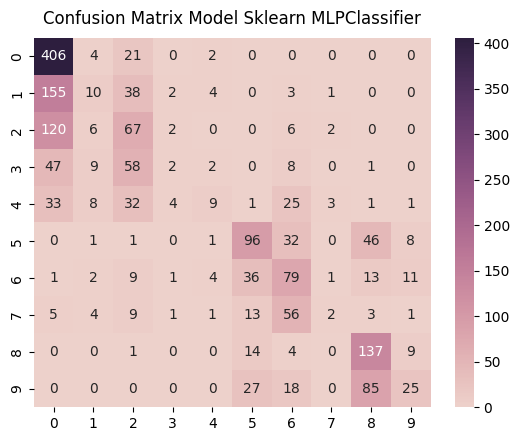

              precision    recall  f1-score     support
0.0            0.529335  0.937644  0.676667   433.00000
1.0            0.227273  0.046948  0.077821   213.00000
2.0            0.283898  0.330049  0.305239   203.00000
3.0            0.166667  0.015748  0.028777   127.00000
4.0            0.391304  0.076923  0.128571   117.00000
5.0            0.513369  0.518919  0.516129   185.00000
6.0            0.341991  0.503185  0.407216   157.00000
7.0            0.222222  0.021053  0.038462    95.00000
8.0            0.479021  0.830303  0.607539   165.00000
9.0            0.454545  0.161290  0.238095   155.00000
accuracy       0.450270  0.450270  0.450270     0.45027
macro avg      0.360963  0.344206  0.302452  1850.00000
weighted avg   0.389979  0.450270  0.373218  1850.00000
Mean Squared Error:  2.8551351351351353


In [317]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

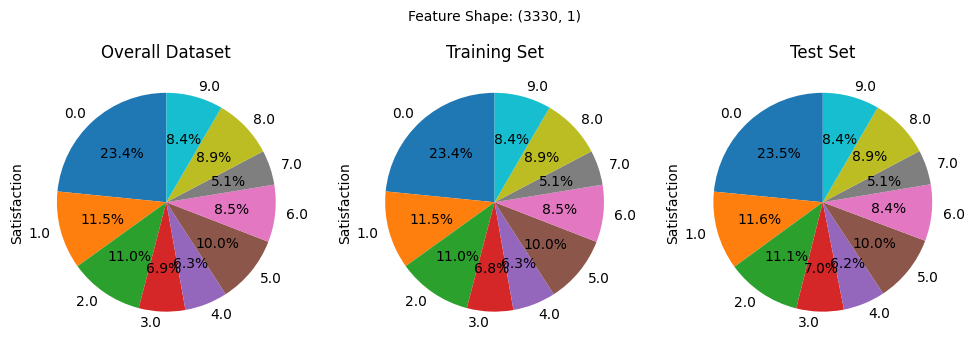

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


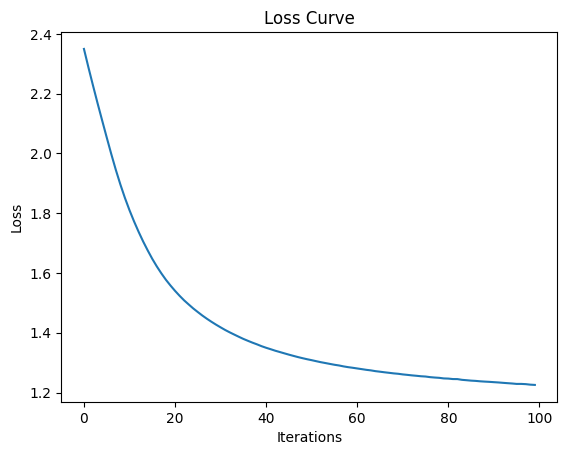

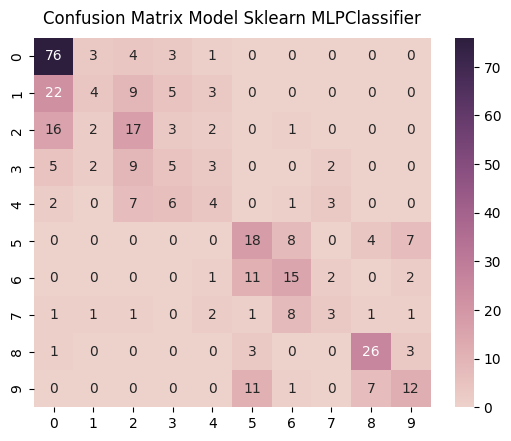

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


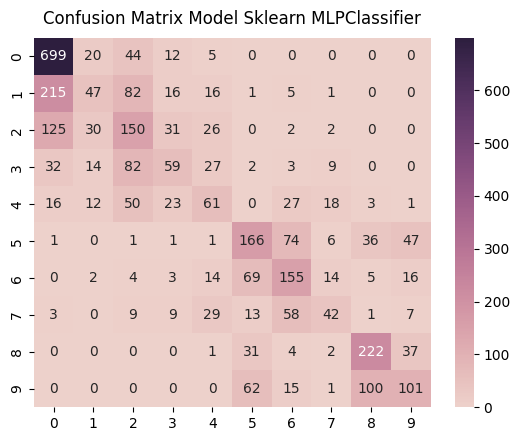

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


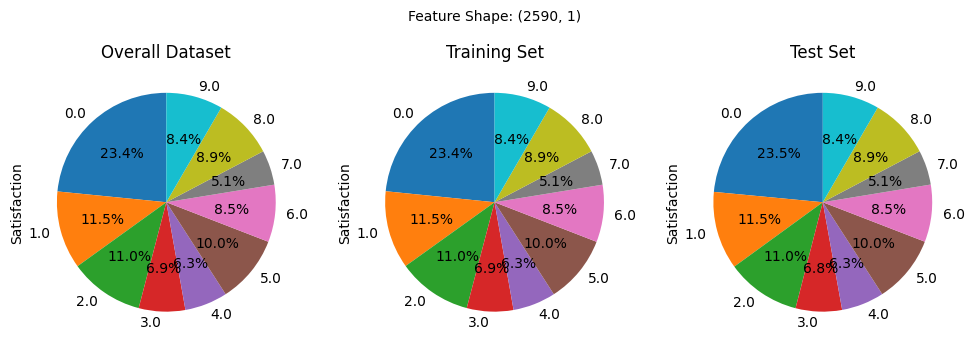

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


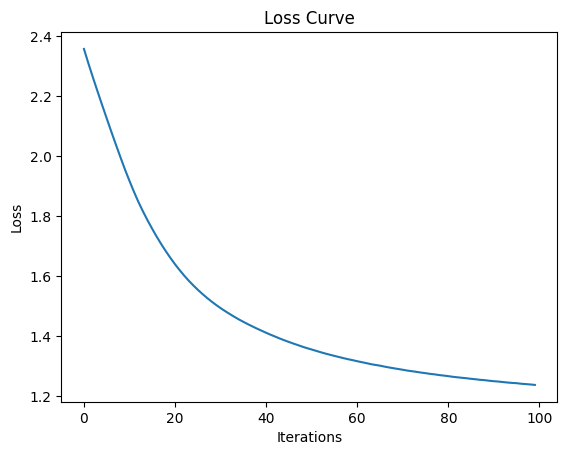

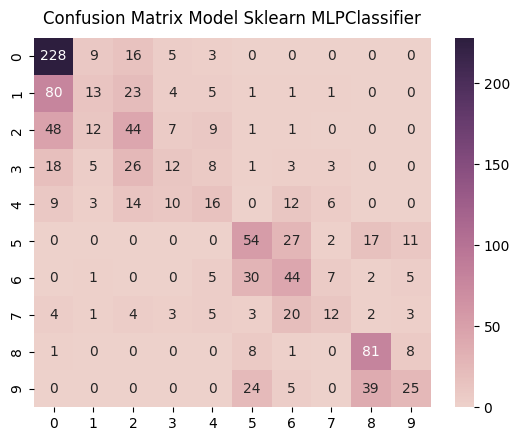

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


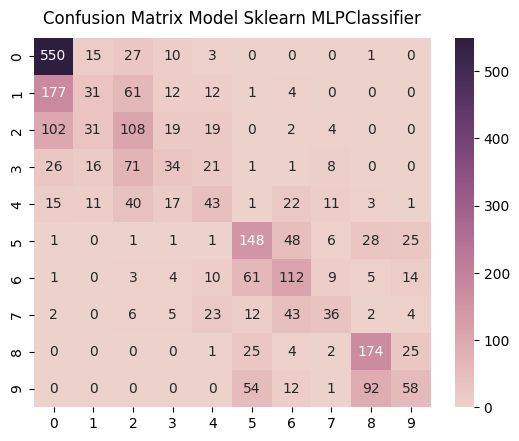

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


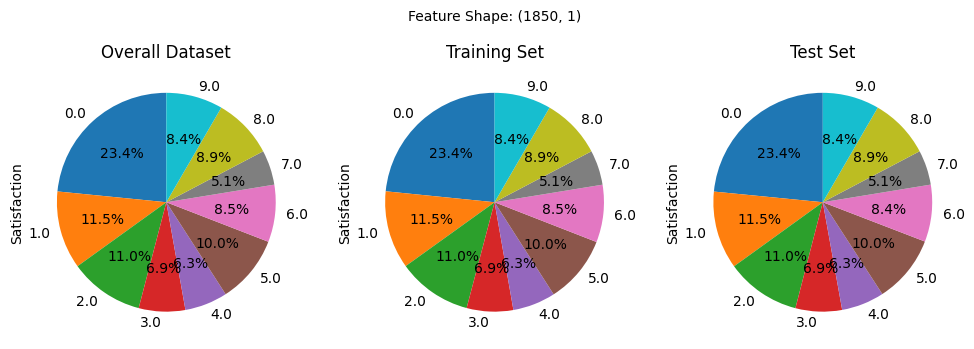

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


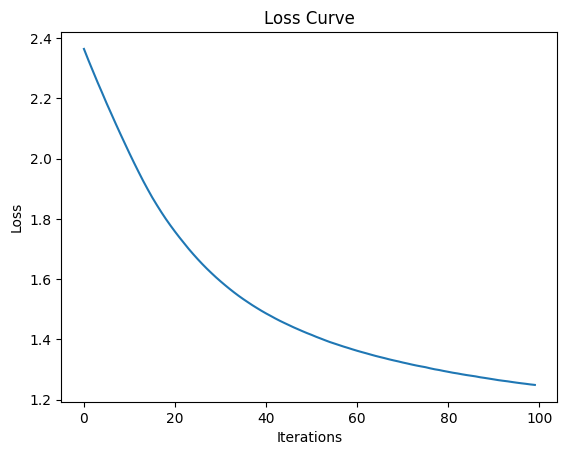

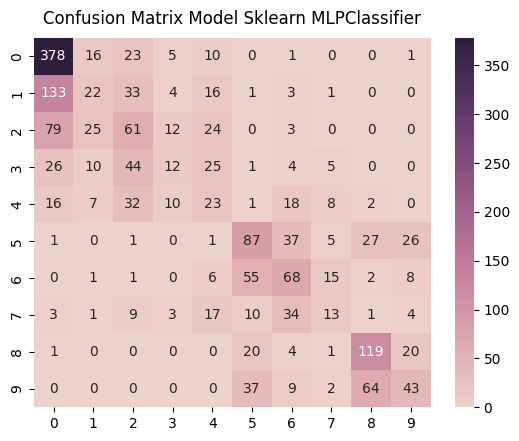

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


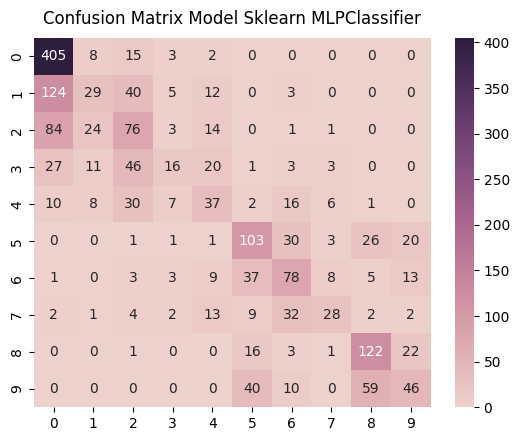

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [318]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 8/64/128


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


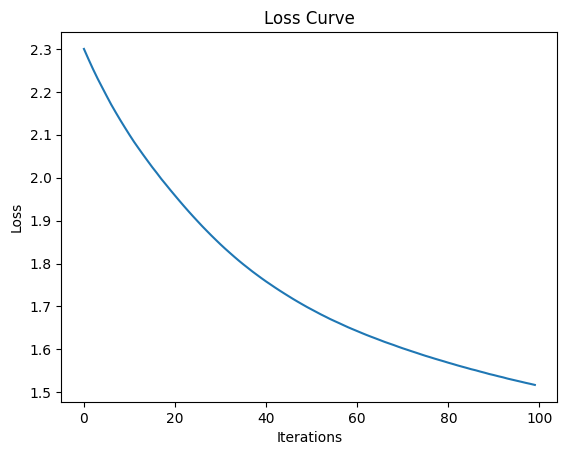

In [319]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8, 64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [320]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

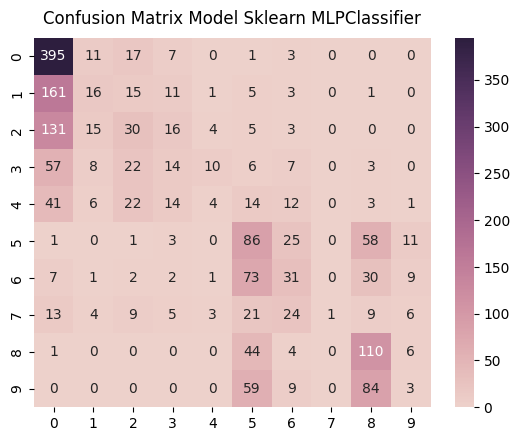

              precision    recall  f1-score      support
0.0            0.489467  0.910138  0.636583   434.000000
1.0            0.262295  0.075117  0.116788   213.000000
2.0            0.254237  0.147059  0.186335   204.000000
3.0            0.194444  0.110236  0.140704   127.000000
4.0            0.173913  0.034188  0.057143   117.000000
5.0            0.273885  0.464865  0.344689   185.000000
6.0            0.256198  0.198718  0.223827   156.000000
7.0            1.000000  0.010526  0.020833    95.000000
8.0            0.369128  0.666667  0.475162   165.000000
9.0            0.083333  0.019355  0.031414   155.000000
accuracy       0.372771  0.372771  0.372771     0.372771
macro avg      0.335690  0.263687  0.223348  1851.000000
weighted avg   0.337473  0.372771  0.295870  1851.000000
Mean Squared Error:  3.9313884386817937


In [321]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

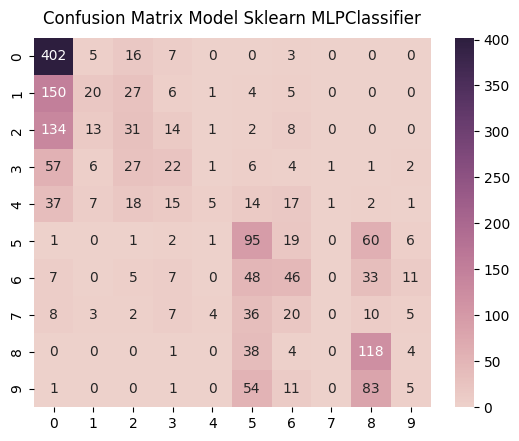

              precision    recall  f1-score      support
0.0            0.504391  0.928406  0.653659   433.000000
1.0            0.370370  0.093897  0.149813   213.000000
2.0            0.244094  0.152709  0.187879   203.000000
3.0            0.268293  0.173228  0.210526   127.000000
4.0            0.384615  0.042735  0.076923   117.000000
5.0            0.319865  0.513514  0.394191   185.000000
6.0            0.335766  0.292994  0.312925   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.384365  0.715152  0.500000   165.000000
9.0            0.147059  0.032258  0.052910   155.000000
accuracy       0.402162  0.402162  0.402162     0.402162
macro avg      0.295882  0.294489  0.253883  1850.000000
weighted avg   0.337308  0.402162  0.325176  1850.000000
Mean Squared Error:  3.6724324324324322


In [322]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

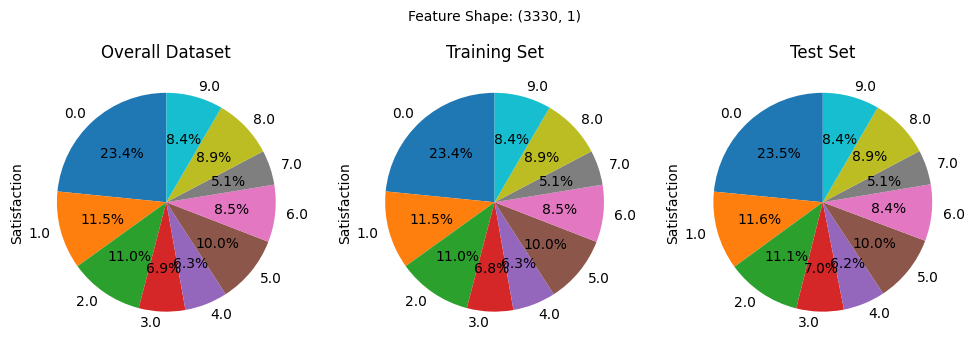

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


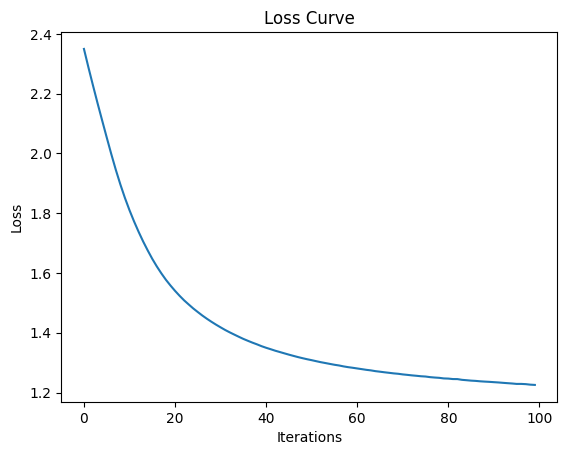

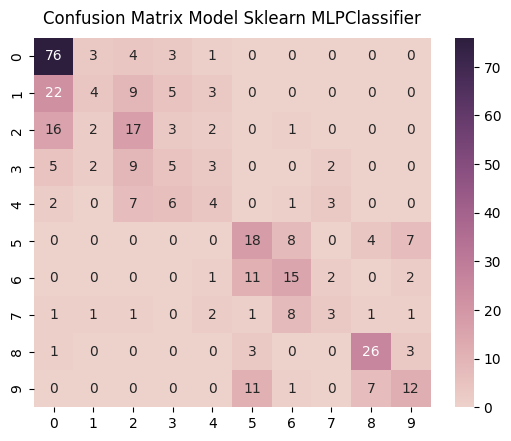

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


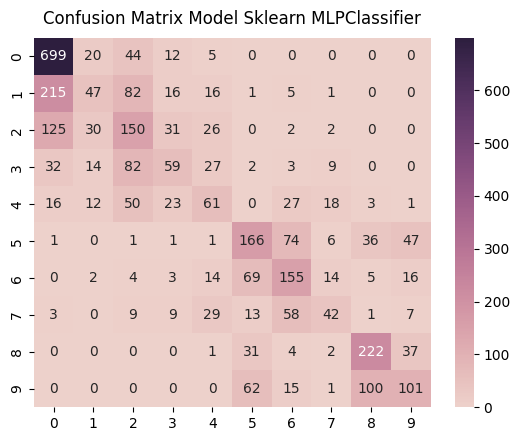

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


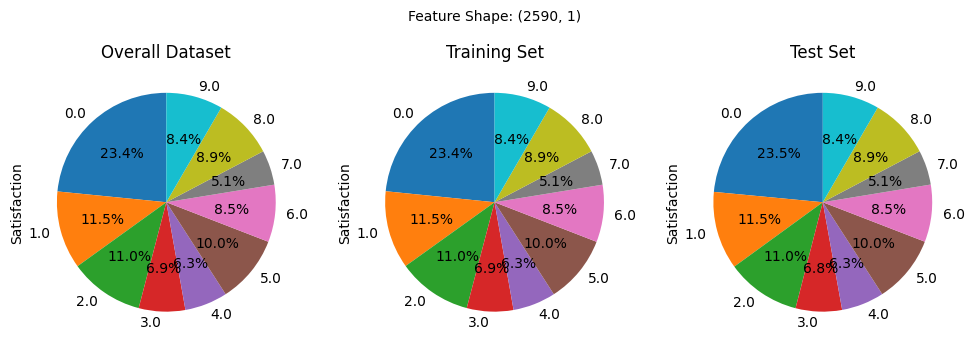

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


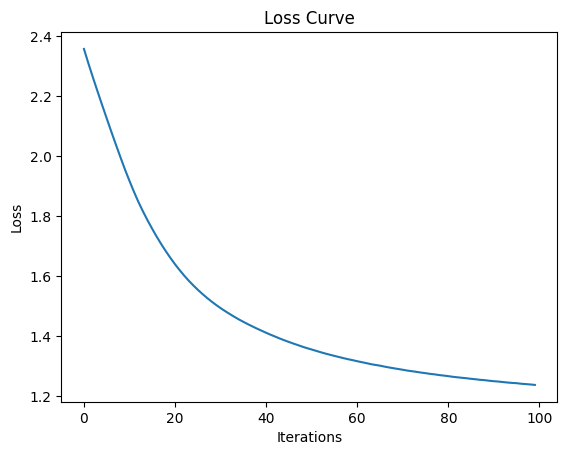

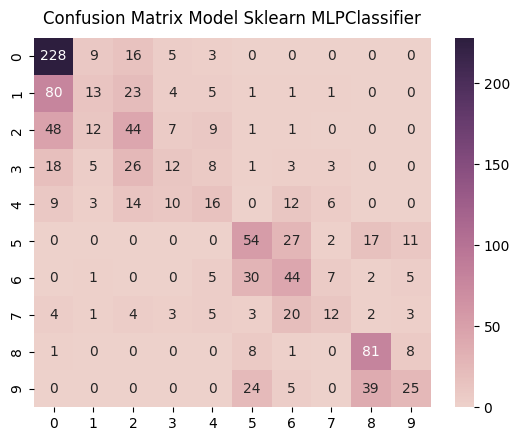

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


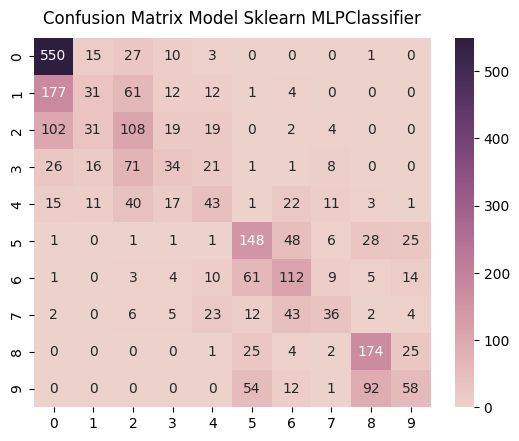

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


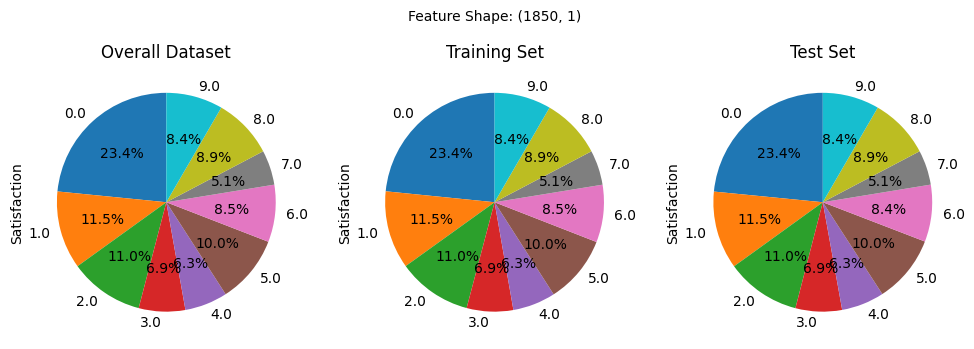

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


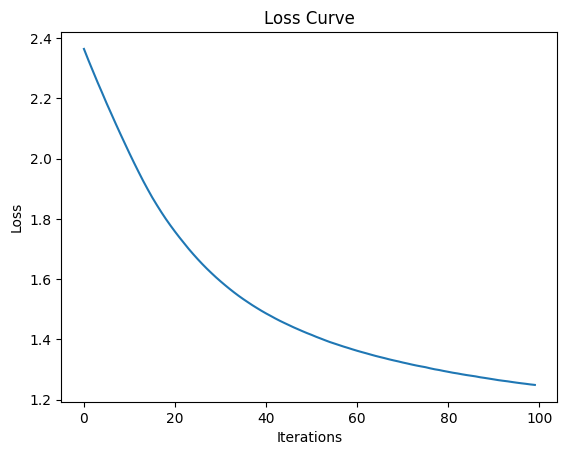

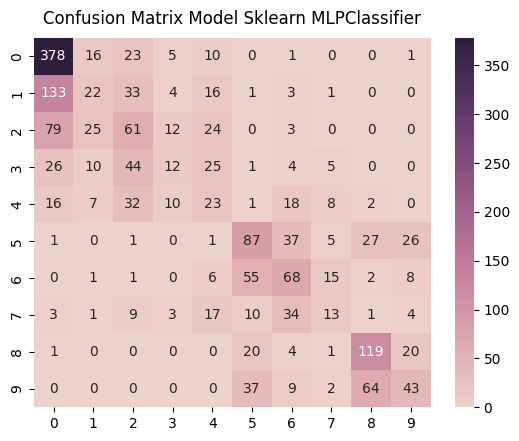

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


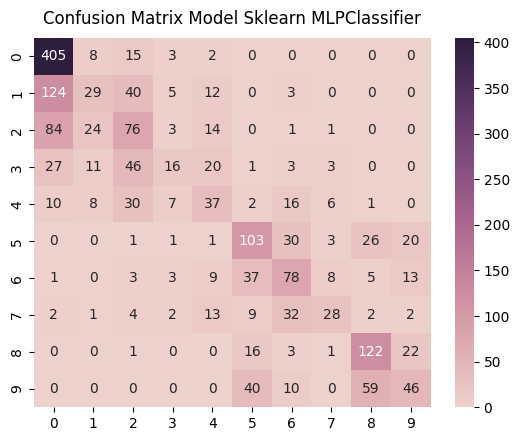

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [323]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 128/64/8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


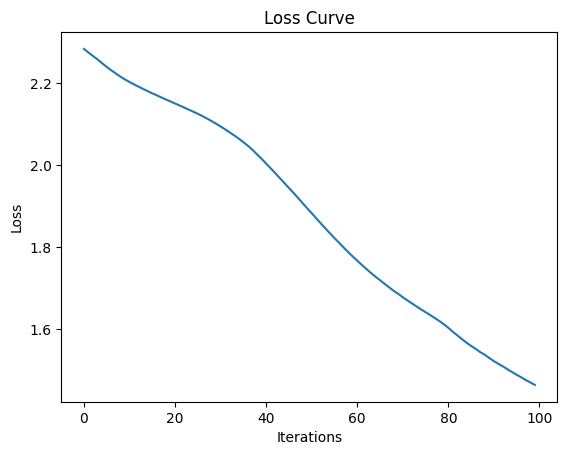

In [324]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [325]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

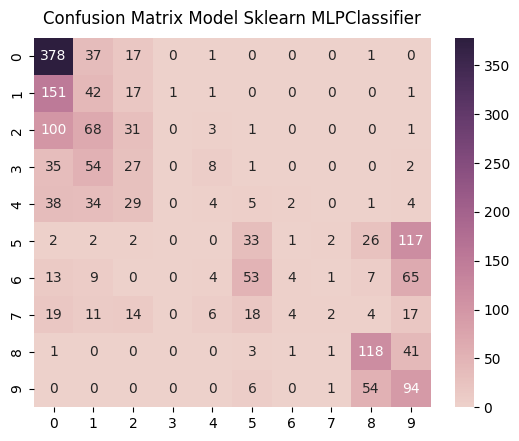

              precision    recall  f1-score      support
0.0            0.512890  0.870968  0.645602   434.000000
1.0            0.163424  0.197183  0.178723   213.000000
2.0            0.226277  0.151961  0.181818   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.148148  0.034188  0.055556   117.000000
5.0            0.275000  0.178378  0.216393   185.000000
6.0            0.333333  0.025641  0.047619   156.000000
7.0            0.285714  0.021053  0.039216    95.000000
8.0            0.559242  0.715152  0.627660   165.000000
9.0            0.274854  0.606452  0.378270   155.000000
accuracy       0.381415  0.381415  0.381415     0.381415
macro avg      0.277888  0.280097  0.237086  1851.000000
weighted avg   0.316474  0.381415  0.310769  1851.000000
Mean Squared Error:  4.608319827120475


In [326]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

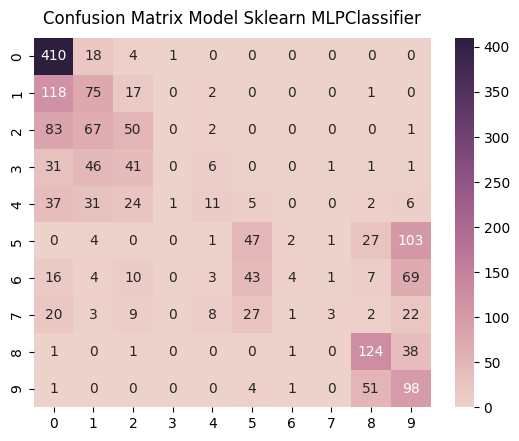

              precision    recall  f1-score      support
0.0            0.571827  0.946882  0.713043   433.000000
1.0            0.302419  0.352113  0.325380   213.000000
2.0            0.320513  0.246305  0.278552   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.333333  0.094017  0.146667   117.000000
5.0            0.373016  0.254054  0.302251   185.000000
6.0            0.444444  0.025478  0.048193   157.000000
7.0            0.500000  0.031579  0.059406    95.000000
8.0            0.576744  0.751515  0.652632   165.000000
9.0            0.289941  0.632258  0.397566   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.371224  0.333420  0.292369  1850.000000
weighted avg   0.401335  0.444324  0.373077  1850.000000
Mean Squared Error:  4.257837837837838


In [327]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

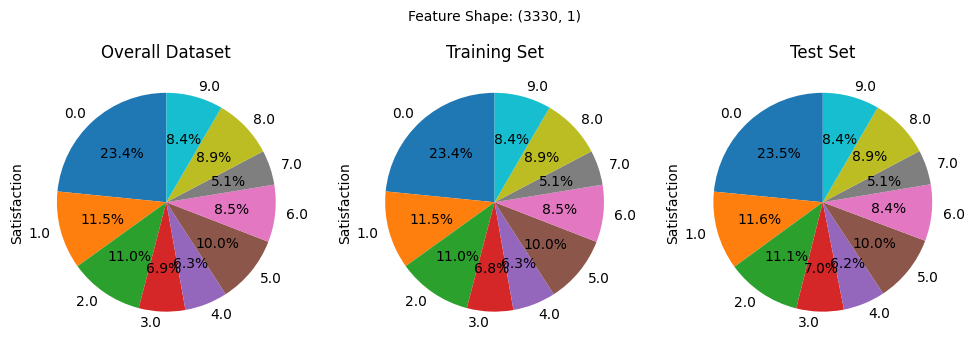

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


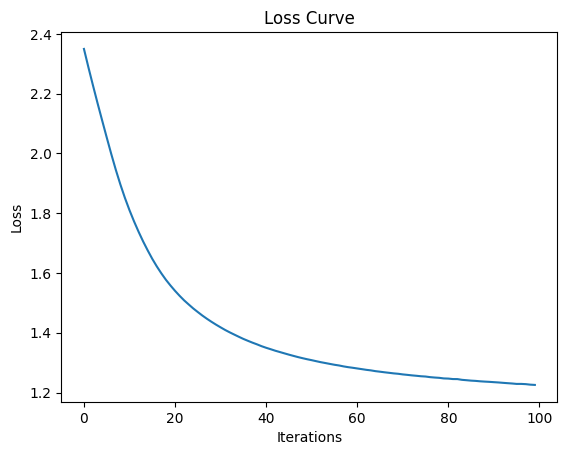

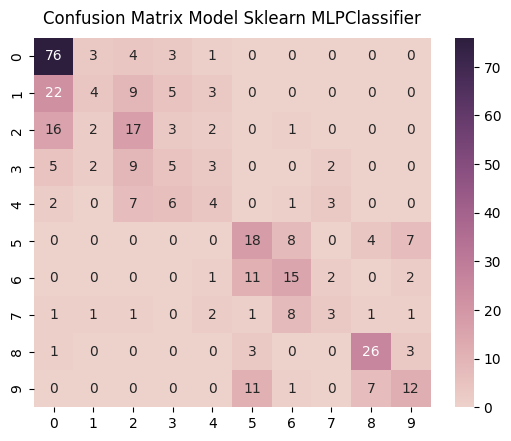

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


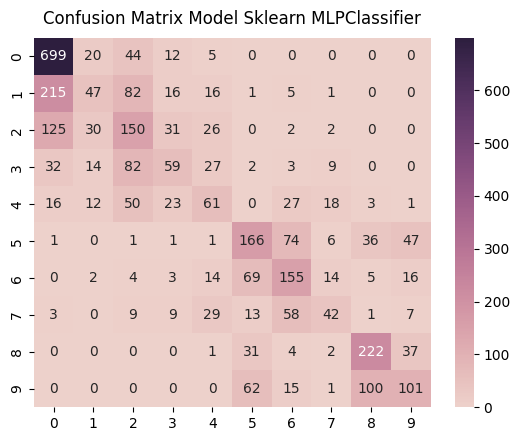

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


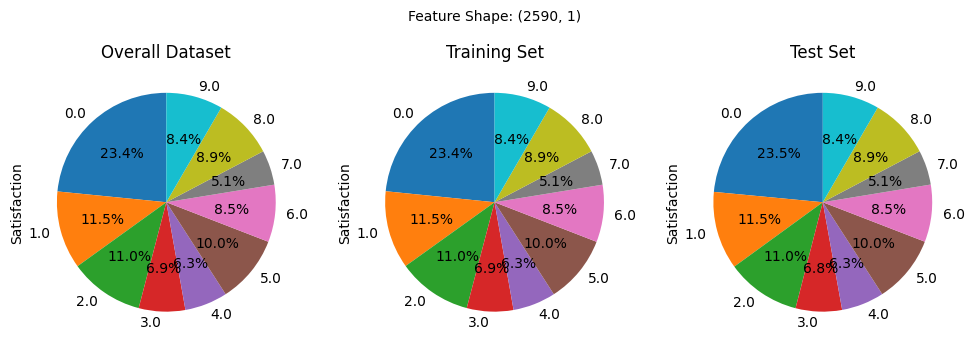

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


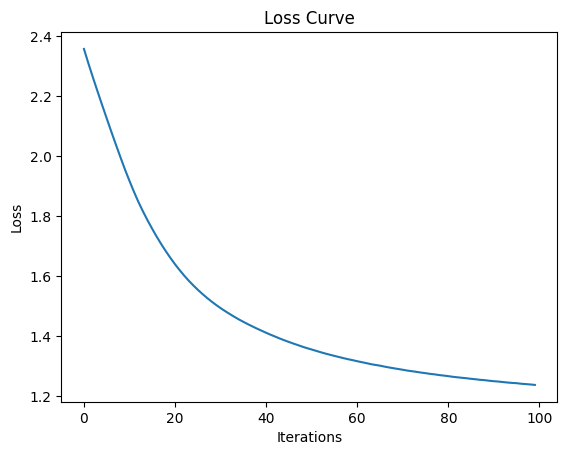

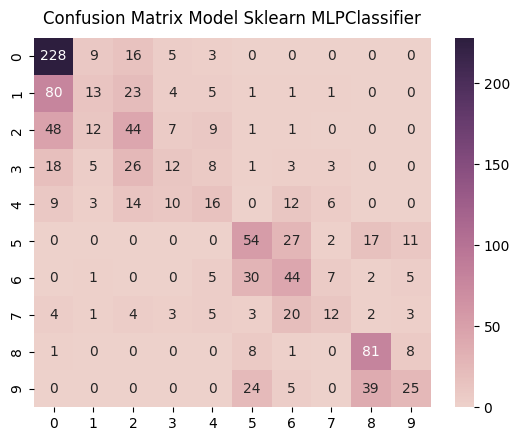

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


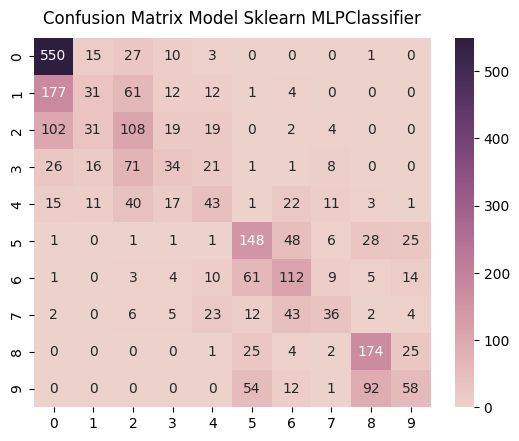

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


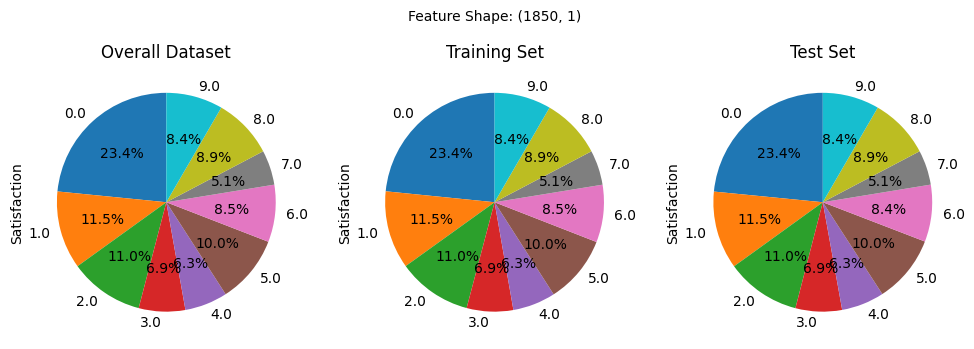

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


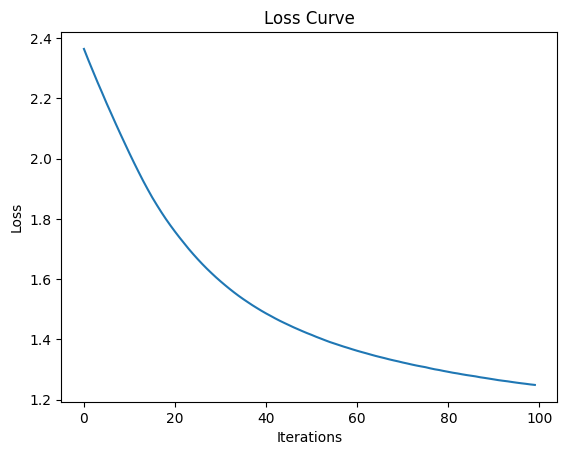

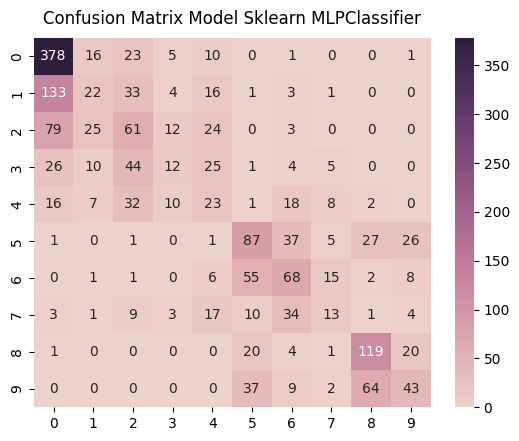

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


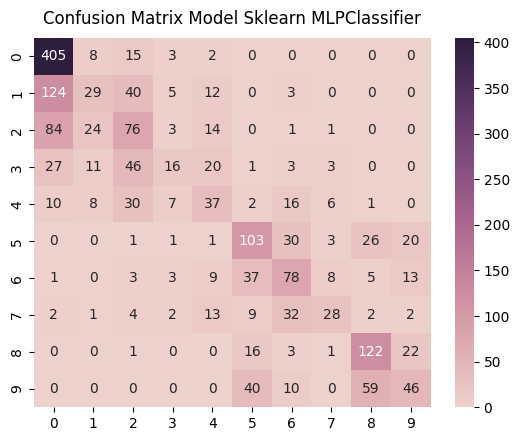

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [328]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 16/8/32


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


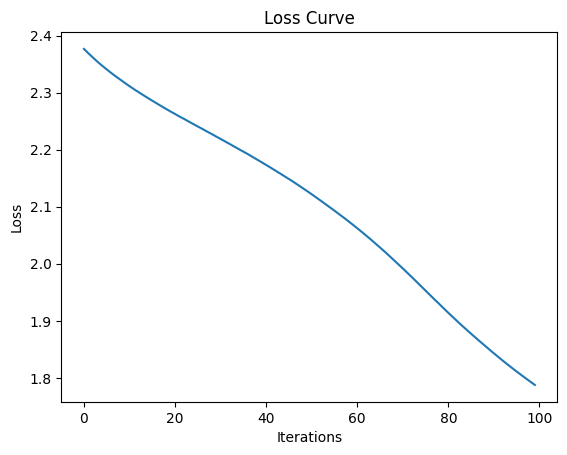

In [329]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16, 8, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [330]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

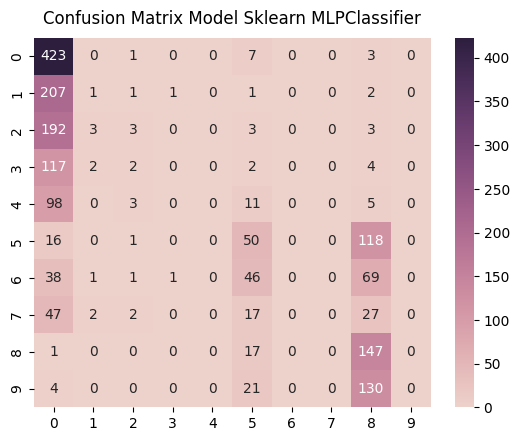

              precision    recall  f1-score      support
0.0            0.370079  0.974654  0.536462   434.000000
1.0            0.111111  0.004695  0.009009   213.000000
2.0            0.214286  0.014706  0.027523   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.285714  0.270270  0.277778   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.289370  0.890909  0.436850   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.127056  0.215523  0.128762  1851.000000
weighted avg   0.177525  0.337115  0.196557  1851.000000
Mean Squared Error:  6.041599135602377


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [331]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

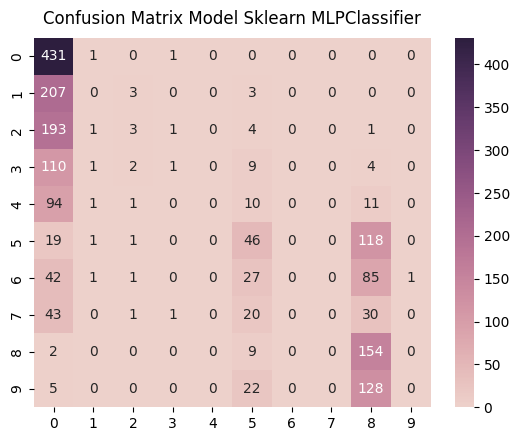

              precision    recall  f1-score      support
0.0            0.376091  0.995381  0.545915   433.000000
1.0            0.000000  0.000000  0.000000   213.000000
2.0            0.250000  0.014778  0.027907   203.000000
3.0            0.250000  0.007874  0.015267   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.306667  0.248649  0.274627   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.290019  0.933333  0.442529   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.343243  0.343243  0.343243     0.343243
macro avg      0.147278  0.220002  0.130624  1850.000000
weighted avg   0.189153  0.343243  0.198815  1850.000000
Mean Squared Error:  5.833513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [332]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

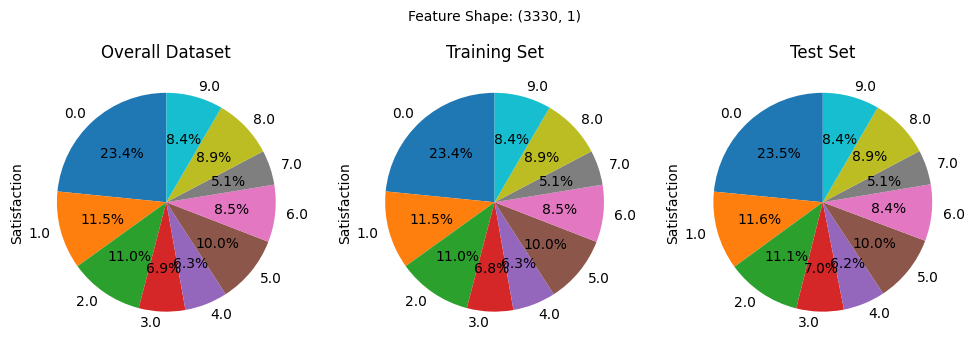

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


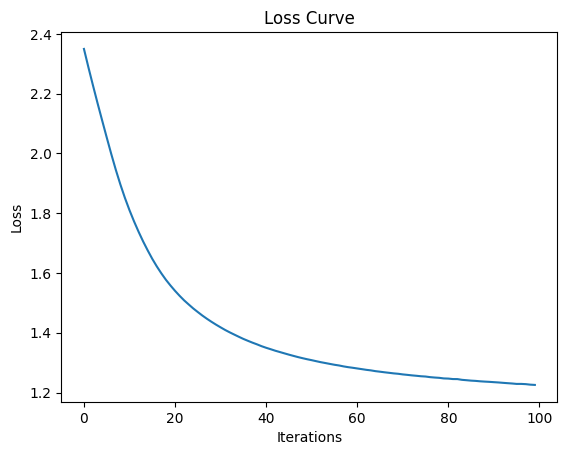

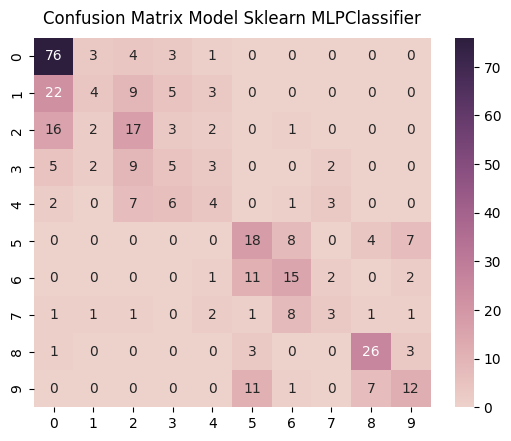

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


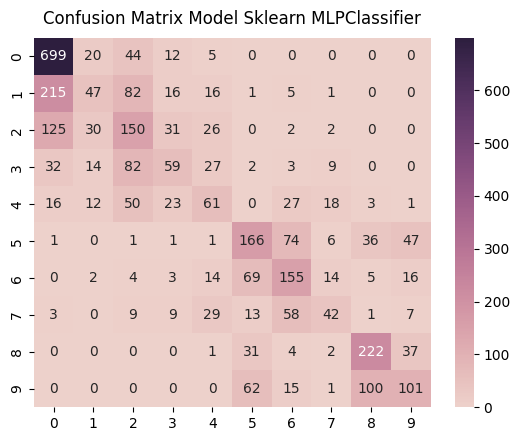

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


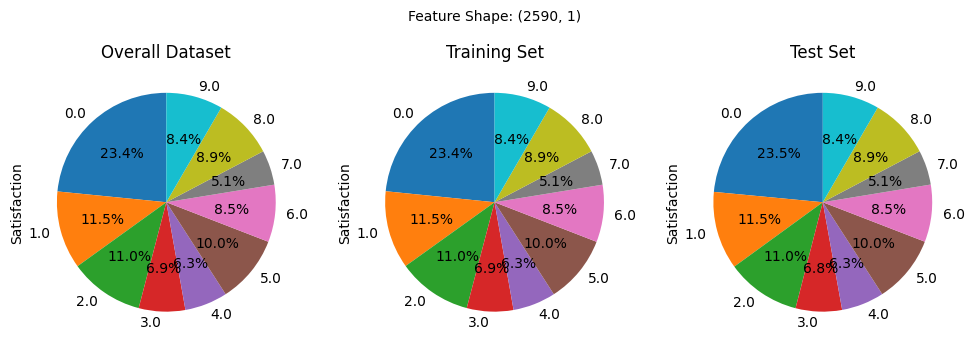

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


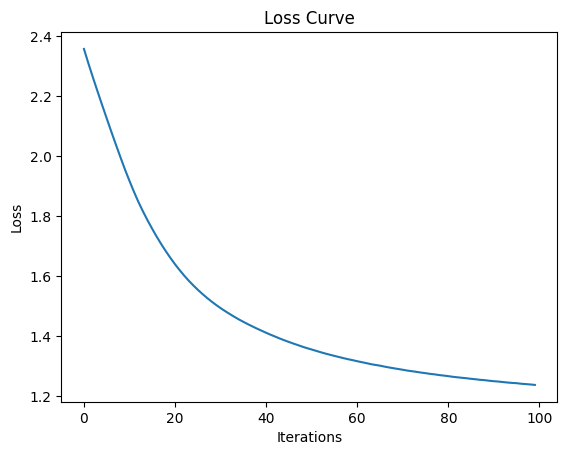

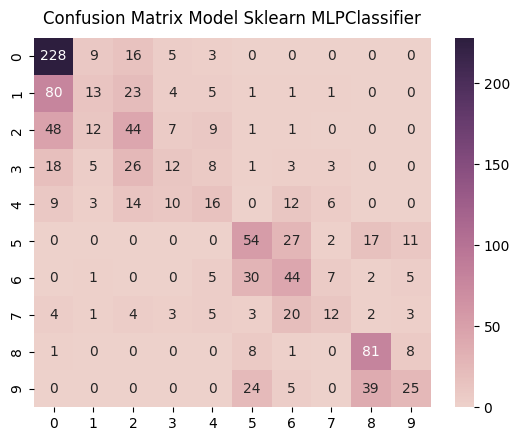

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


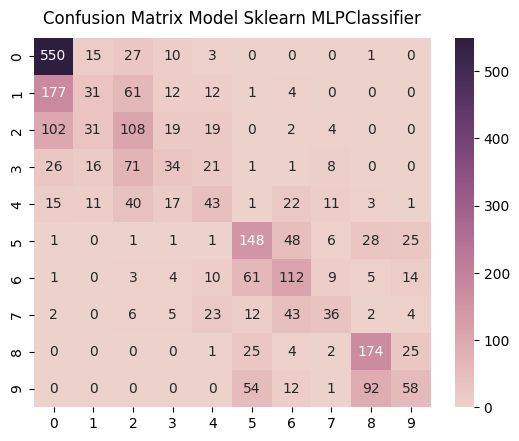

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


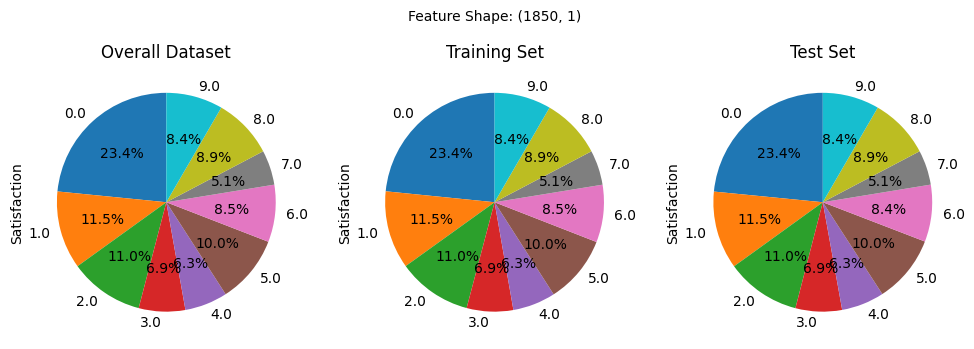

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


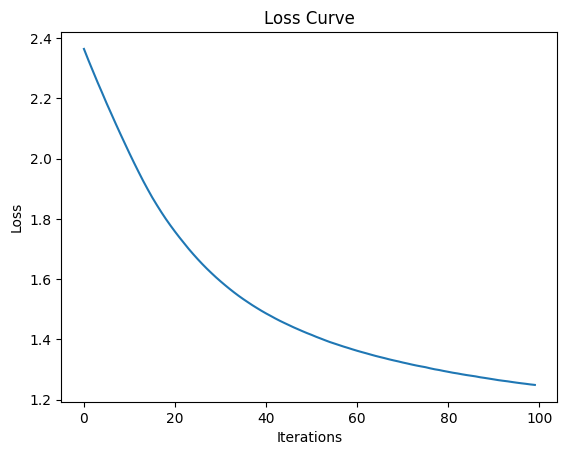

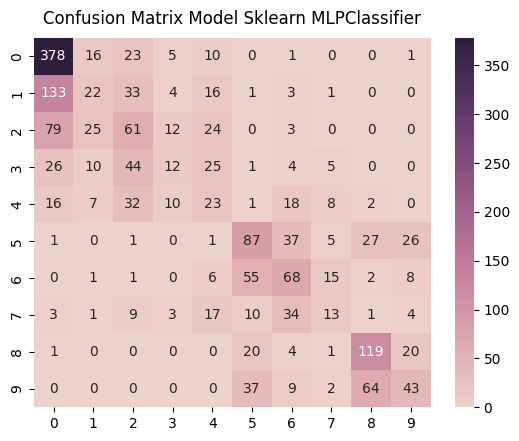

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


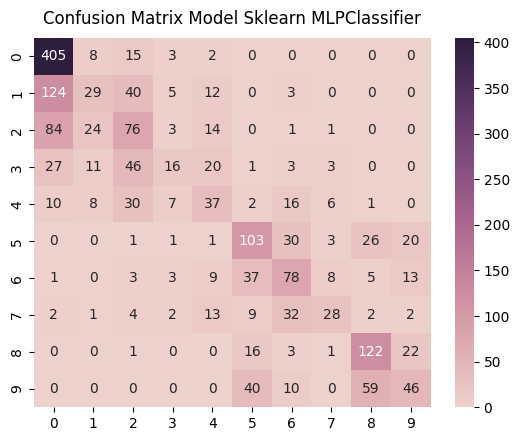

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [333]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 32/8/16


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


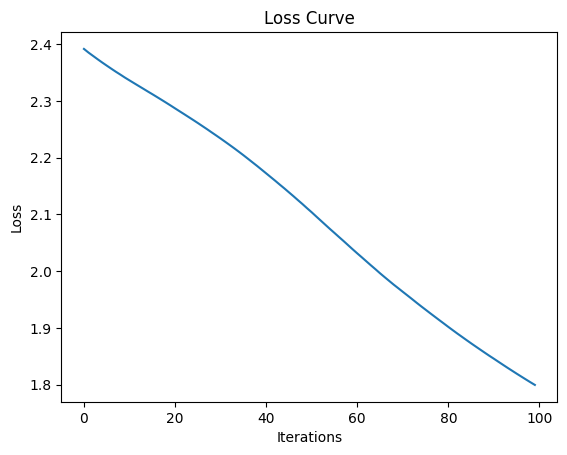

In [334]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 8, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [335]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

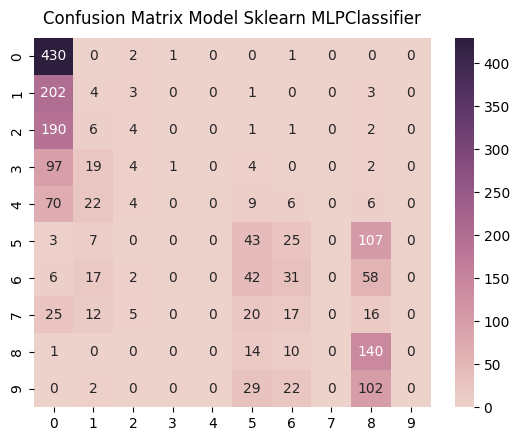

              precision    recall  f1-score      support
0.0            0.419922  0.990783  0.589849   434.000000
1.0            0.044944  0.018779  0.026490   213.000000
2.0            0.166667  0.019608  0.035088   204.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.263804  0.232432  0.247126   185.000000
6.0            0.274336  0.198718  0.230483   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.321101  0.848485  0.465890   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352782  0.352782  0.352782     0.352782
macro avg      0.199077  0.231668  0.161043  1851.000000
weighted avg   0.234414  0.352782  0.231934  1851.000000
Mean Squared Error:  4.810913019989195


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [336]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

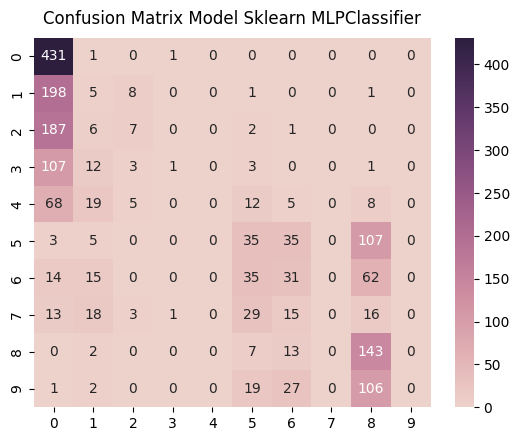

              precision    recall  f1-score      support
0.0            0.421722  0.995381  0.592440   433.000000
1.0            0.058824  0.023474  0.033557   213.000000
2.0            0.269231  0.034483  0.061135   203.000000
3.0            0.333333  0.007874  0.015385   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.244755  0.189189  0.213415   185.000000
6.0            0.244094  0.197452  0.218310   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.322072  0.866667  0.469622   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352973  0.352973  0.352973     0.352973
macro avg      0.189403  0.231452  0.160386  1850.000000
weighted avg   0.231820  0.352973  0.232045  1850.000000
Mean Squared Error:  4.57945945945946


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [337]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

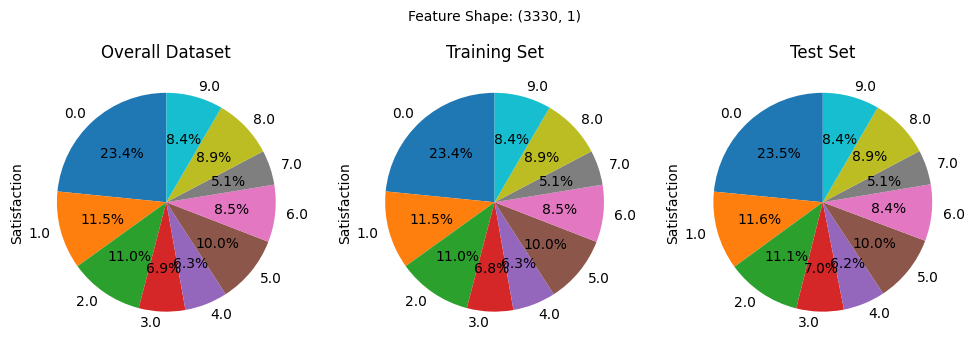

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


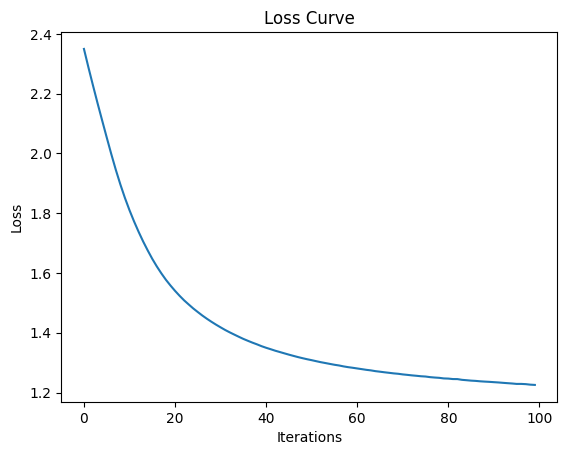

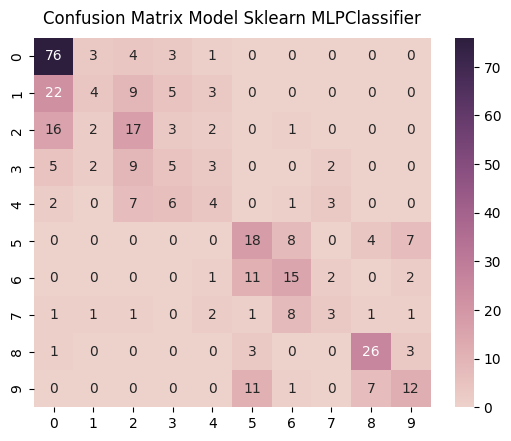

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


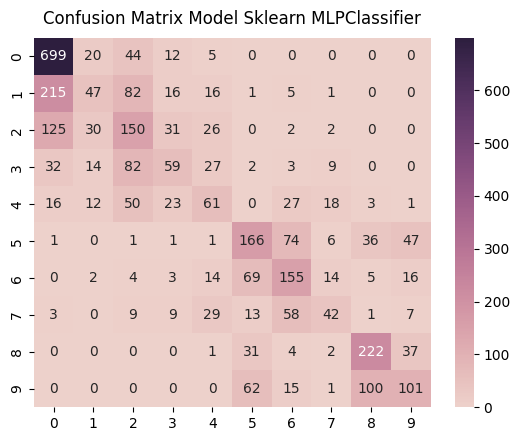

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


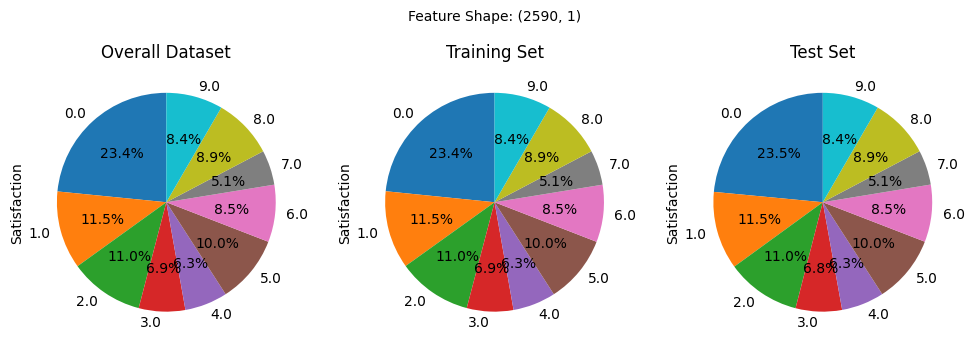

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


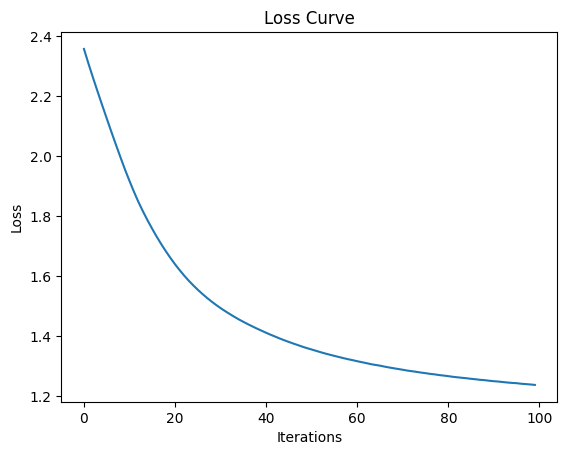

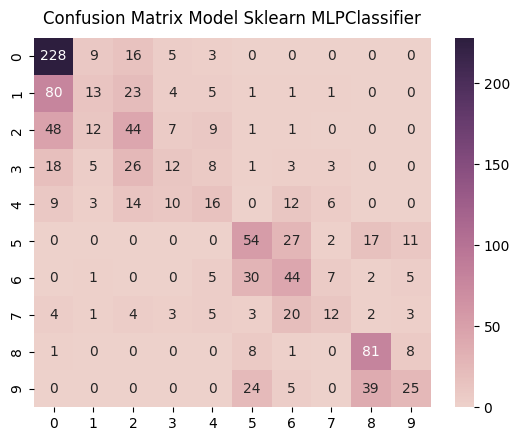

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


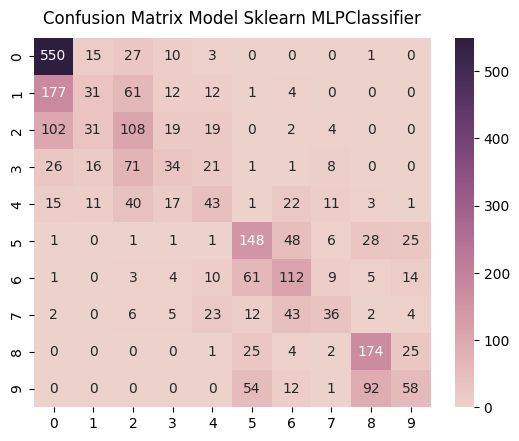

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


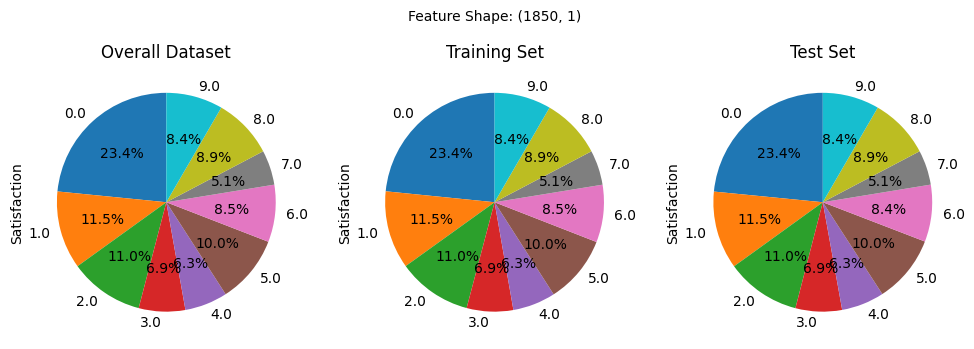

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


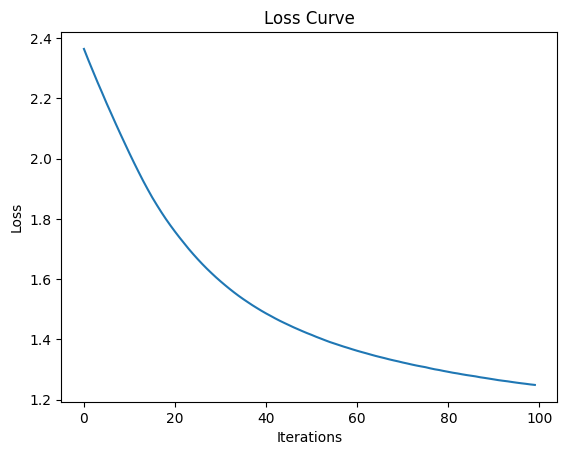

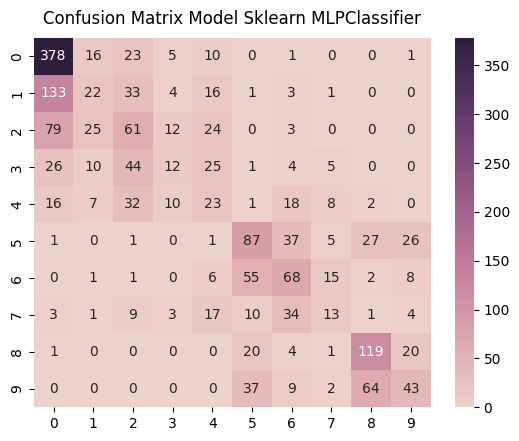

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


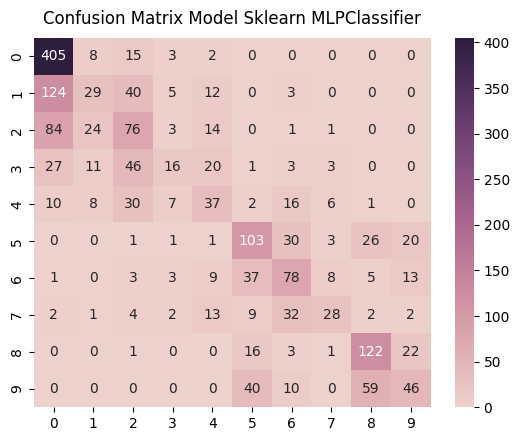

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [338]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 64/16/8


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


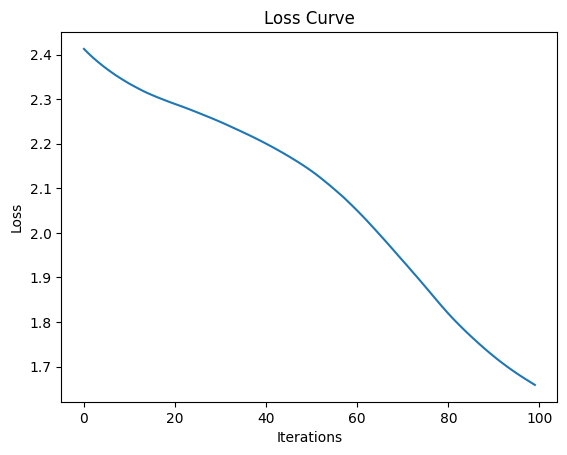

In [339]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [340]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

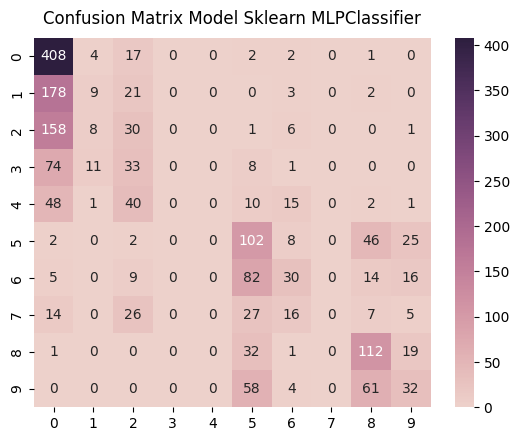

              precision    recall  f1-score    support
0.0            0.459459  0.940092  0.617247   434.0000
1.0            0.272727  0.042254  0.073171   213.0000
2.0            0.168539  0.147059  0.157068   204.0000
3.0            0.000000  0.000000  0.000000   127.0000
4.0            0.000000  0.000000  0.000000   117.0000
5.0            0.316770  0.551351  0.402367   185.0000
6.0            0.348837  0.192308  0.247934   156.0000
7.0            0.000000  0.000000  0.000000    95.0000
8.0            0.457143  0.678788  0.546341   165.0000
9.0            0.323232  0.206452  0.251969   155.0000
accuracy       0.390600  0.390600  0.390600     0.3906
macro avg      0.234671  0.275830  0.229610  1851.0000
weighted avg   0.286563  0.390600  0.301366  1851.0000
Mean Squared Error:  4.135602377093463


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [341]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

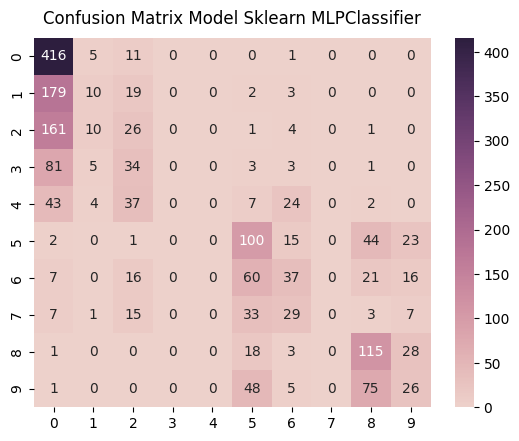

              precision    recall  f1-score      support
0.0            0.463252  0.960739  0.625094   433.000000
1.0            0.285714  0.046948  0.080645   213.000000
2.0            0.163522  0.128079  0.143646   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.367647  0.540541  0.437637   185.000000
6.0            0.298387  0.235669  0.263345   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.438931  0.696970  0.538642   165.000000
9.0            0.260000  0.167742  0.203922   155.000000
accuracy       0.394595  0.394595  0.394595     0.394595
macro avg      0.227745  0.277669  0.229293  1850.000000
weighted avg   0.282284  0.394595  0.302592  1850.000000
Mean Squared Error:  3.6875675675675677


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [342]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

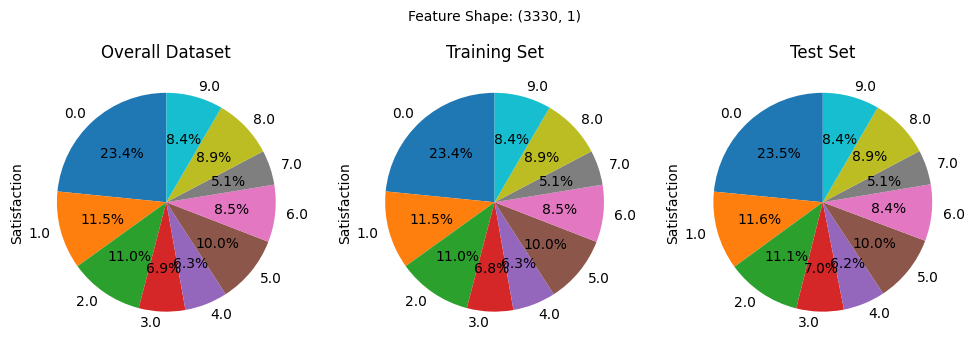

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


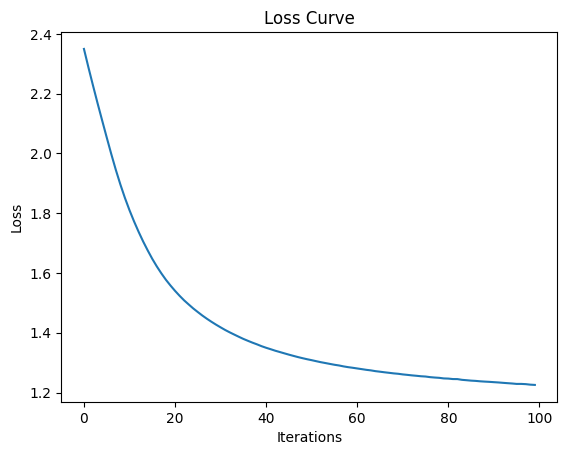

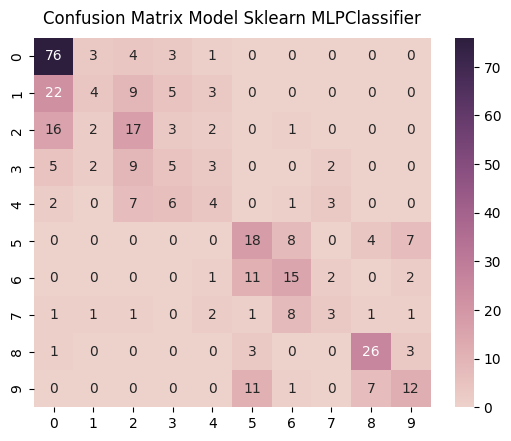

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


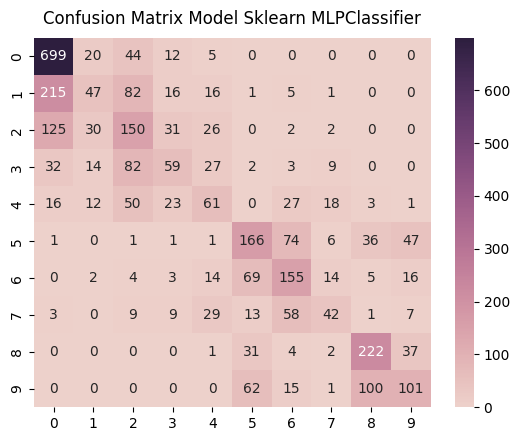

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


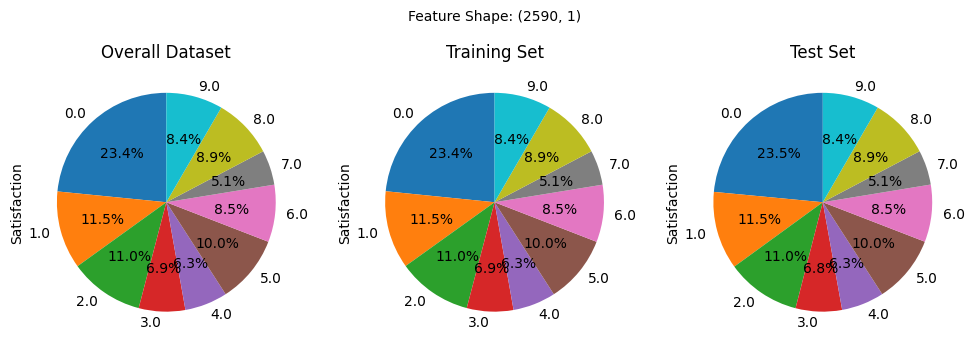

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


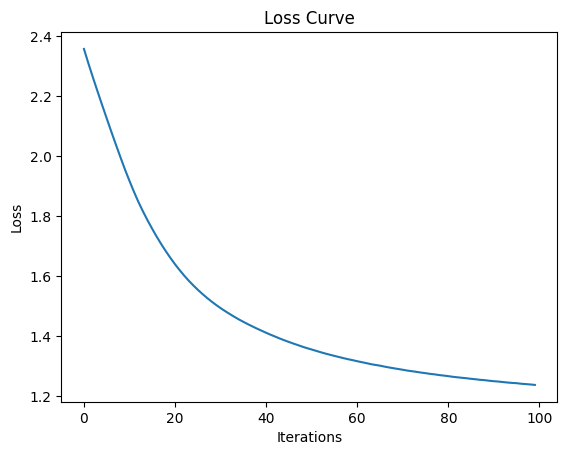

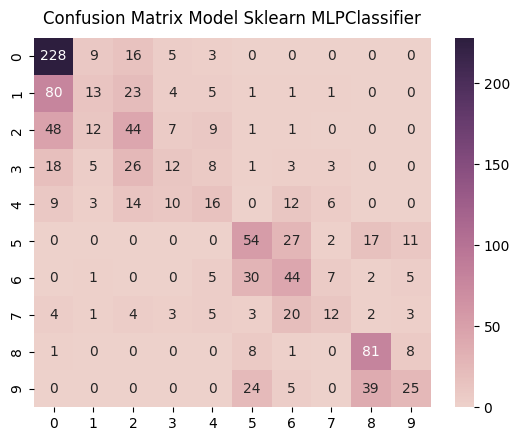

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


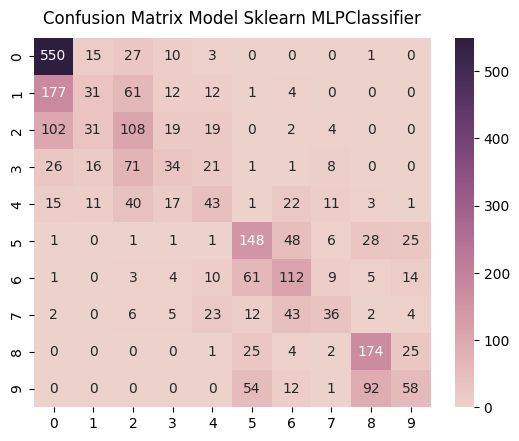

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


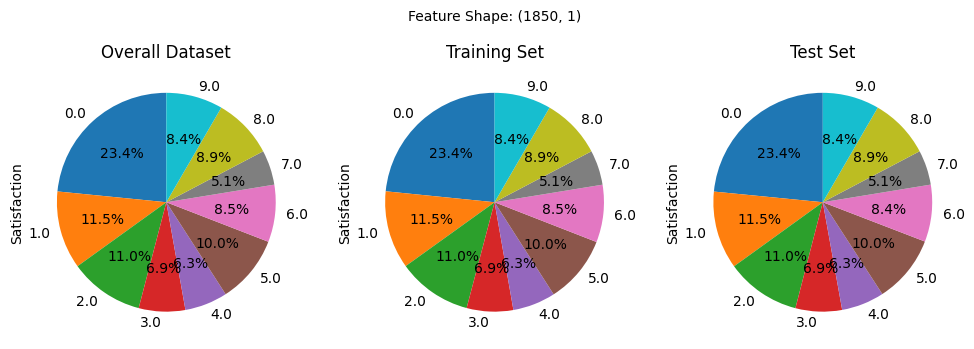

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


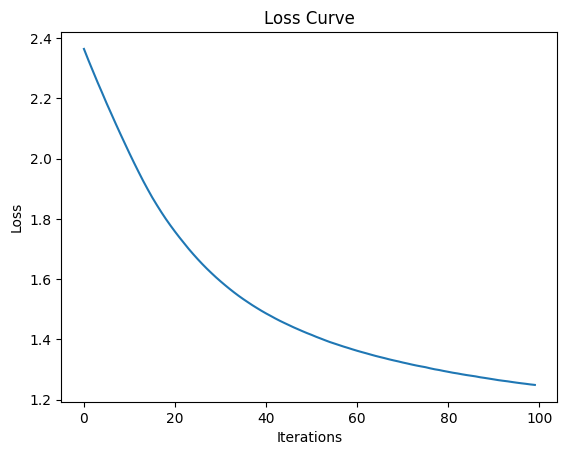

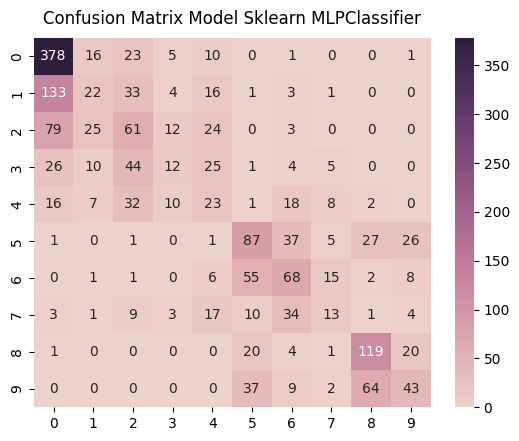

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


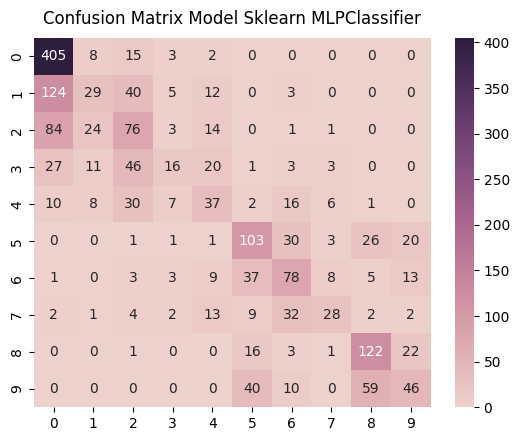

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [343]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 128/32/16

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


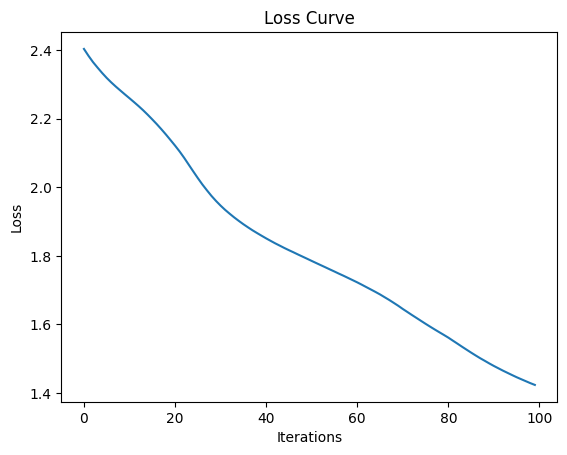

In [344]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [345]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

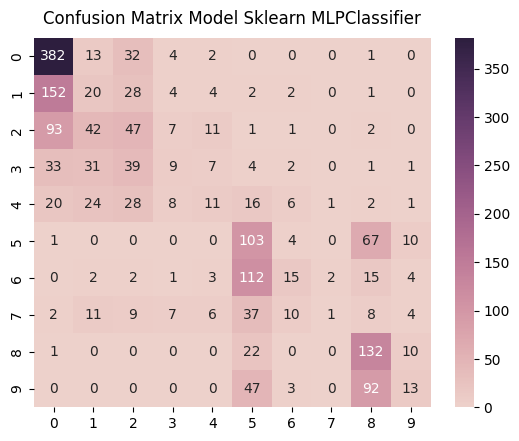

              precision    recall  f1-score      support
0.0            0.558480  0.880184  0.683363   434.000000
1.0            0.139860  0.093897  0.112360   213.000000
2.0            0.254054  0.230392  0.241645   204.000000
3.0            0.225000  0.070866  0.107784   127.000000
4.0            0.250000  0.094017  0.136646   117.000000
5.0            0.299419  0.556757  0.389414   185.000000
6.0            0.348837  0.096154  0.150754   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.411215  0.800000  0.543210   165.000000
9.0            0.302326  0.083871  0.131313   155.000000
accuracy       0.396002  0.396002  0.396002     0.396002
macro avg      0.303919  0.291666  0.251669  1851.000000
weighted avg   0.340408  0.396002  0.327901  1851.000000
Mean Squared Error:  3.1534305780659104


In [346]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

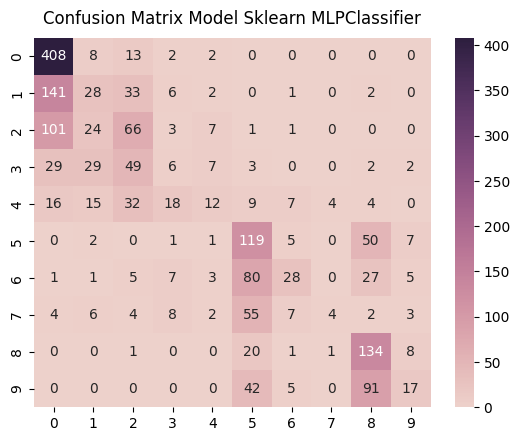

              precision    recall  f1-score      support
0.0            0.582857  0.942263  0.720212   433.000000
1.0            0.247788  0.131455  0.171779   213.000000
2.0            0.325123  0.325123  0.325123   203.000000
3.0            0.117647  0.047244  0.067416   127.000000
4.0            0.333333  0.102564  0.156863   117.000000
5.0            0.361702  0.643243  0.463035   185.000000
6.0            0.509091  0.178344  0.264151   157.000000
7.0            0.444444  0.042105  0.076923    95.000000
8.0            0.429487  0.812121  0.561845   165.000000
9.0            0.404762  0.109677  0.172589   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.375623  0.333414  0.297994  1850.000000
weighted avg   0.404197  0.444324  0.375812  1850.000000
Mean Squared Error:  2.790810810810811


In [347]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

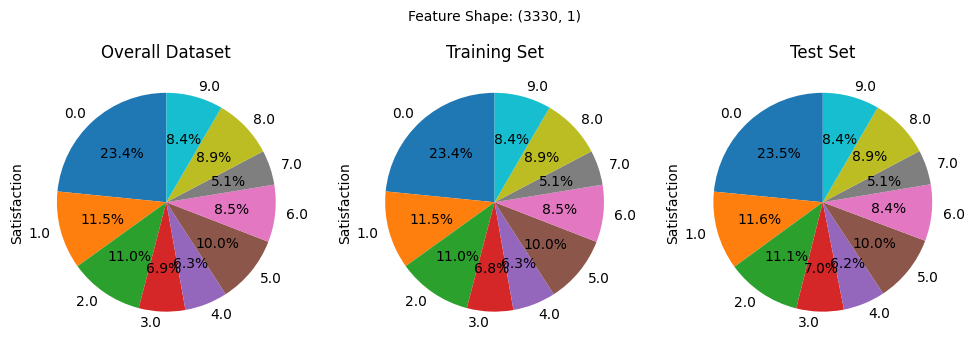

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


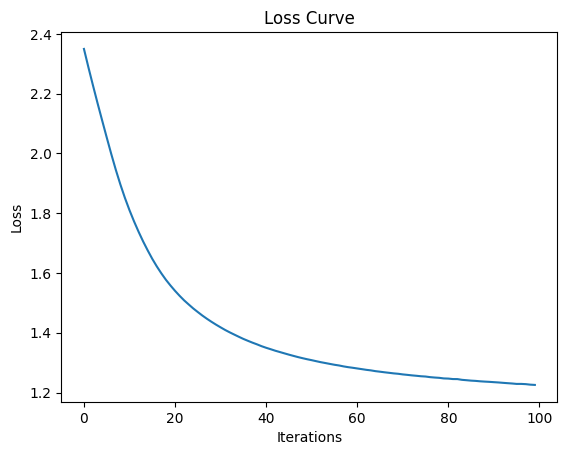

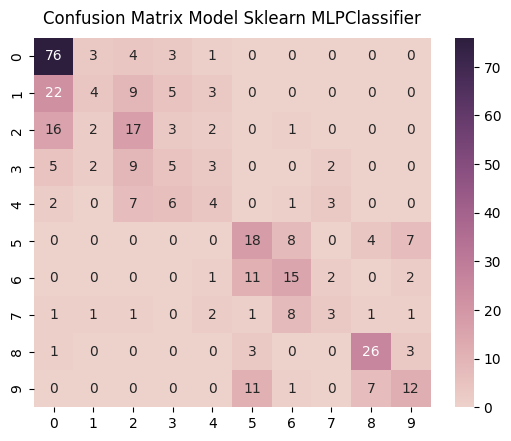

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


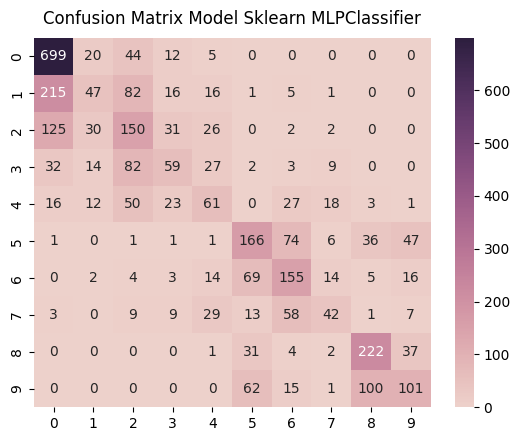

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


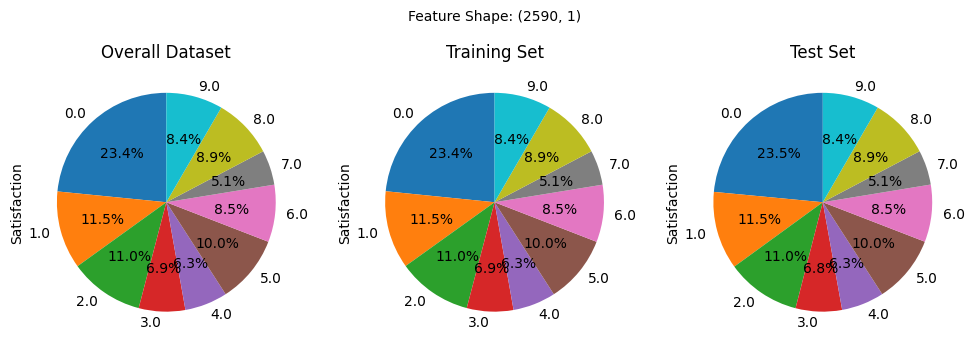

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


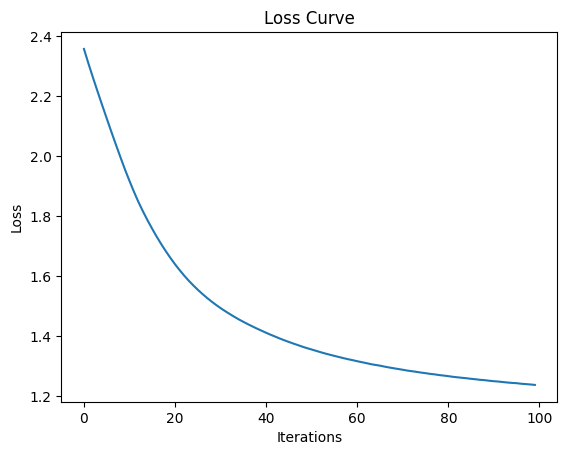

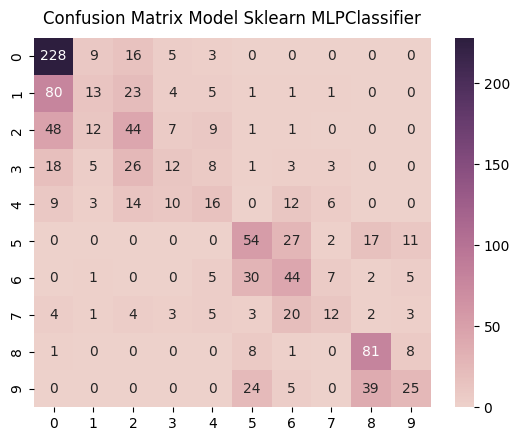

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


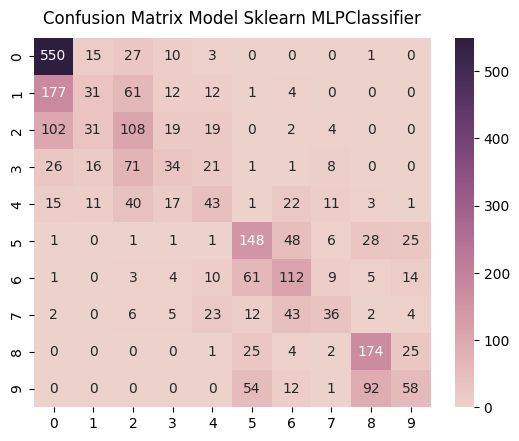

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


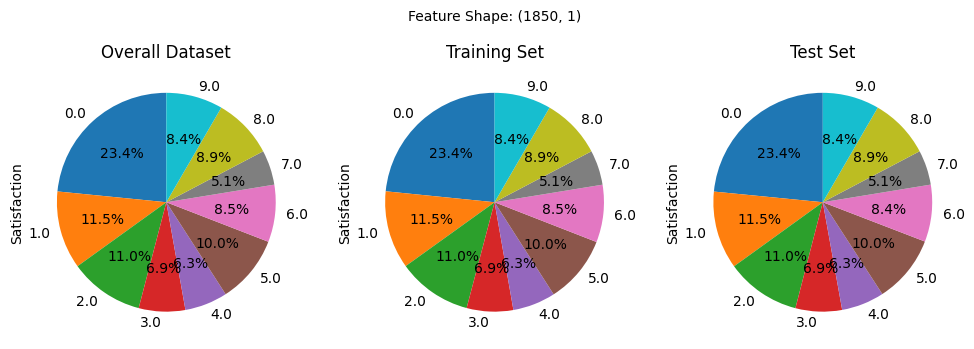

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


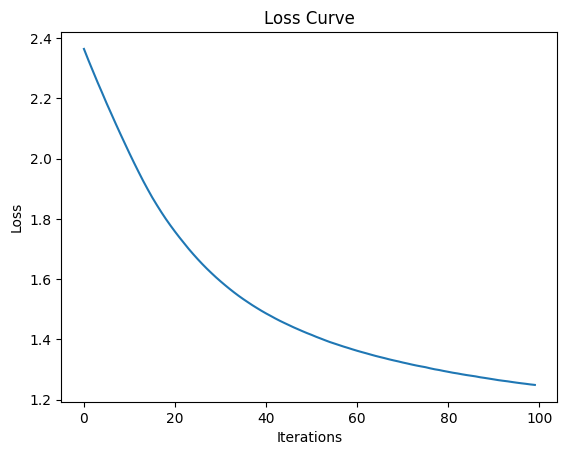

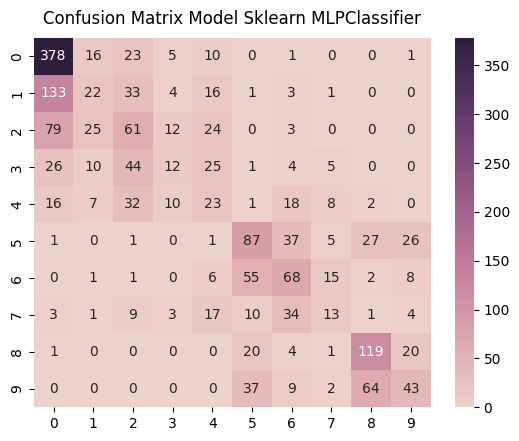

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


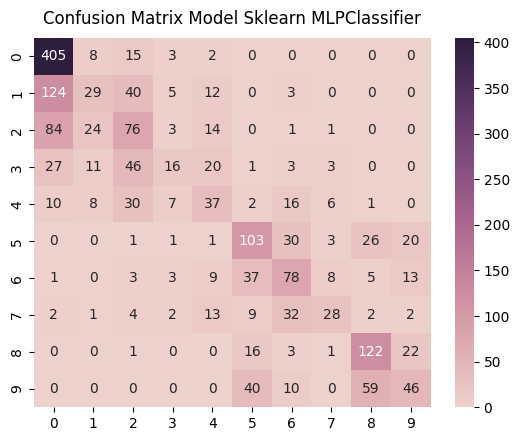

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [348]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))

